# Supplementary figures — copied from `../Fig2.ipynb`

**This is a near-verbatim copy of the source notebook**, not a cleaned
reproduction. Only inert cells were removed: empty cells, cells that are
entirely commented out, and cells that only `print()` or display a table.
Every cell that computes or plots anything is untouched.

Panels produced here: `GSEA_UP_expression`, `GSEA_UP_CC_expression`, `GSEA_UP_MF_expression` — NOTE: this is a copy of all of Fig2.ipynb, which also builds main Figure 2 and the panels already covered by `SupFig_Fig2.ipynb`

Two mechanical path edits were applied so the notebook runs from this directory
and cannot overwrite the published figures:

* `../code/...` → `../../code/...` (this notebook sits one level deeper)
* `../code/plots/` → `plots/` and `../code/revision_plots/` → `revision_plots/`

Cells unrelated to the supplementary panels were **kept**, so this notebook may
compute more than it needs to. That is the trade for not re-tracing it.

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import gzip
from tqdm import tqdm
import os
import re
import statsmodels.api as sm
from statsmodels.regression.linear_model import OLS


In [2]:
gtex_colors = {
  "Adipose-Subcutaneous": {
    "tissue_abbrv": "ADPSBQ", 
    "tissue_color_hex": "FFA54F", 
    "tissue_color_rgb": "255,165,79"
  }, 
  "Adipose-Visceral_Omentum": {
    "tissue_abbrv": "ADPVSC", 
    "tissue_color_hex": "EE9A00", 
    "tissue_color_rgb": "238,154,0"
  }, 
  "AdrenalGland": {
    "tissue_abbrv": "ADRNLG", 
    "tissue_color_hex": "8FBC8F", 
    "tissue_color_rgb": "143,188,143"
  }, 
  "Artery-Aorta": {
    "tissue_abbrv": "ARTAORT", 
    "tissue_color_hex": "8B1C62", 
    "tissue_color_rgb": "139,28,98"
  }, 
  "Artery-Coronary": {
    "tissue_abbrv": "ARTCRN", 
    "tissue_color_hex": "EE6A50", 
    "tissue_color_rgb": "238,106,80"
  }, 
  "Artery-Femoral": {
    "tissue_abbrv": "ARTFMR", 
    "tissue_color_hex": "FF4500", 
    "tissue_color_rgb": "255,69,0"
  }, 
  "Artery-Tibial": {
    "tissue_abbrv": "ARTTBL", 
    "tissue_color_hex": "FF0000", 
    "tissue_color_rgb": "255,0,0"
  }, 
  "Bladder": {
    "tissue_abbrv": "BLDDER", 
    "tissue_color_hex": "CDB79E", 
    "tissue_color_rgb": "205,183,158"
  }, 
  "Brain-Amygdala": {
    "tissue_abbrv": "BRNAMY", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Brain-Anteriorcingulatecortex_BA24": {
    "tissue_abbrv": "BRNACC", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Brain-Caudate_basalganglia": {
    "tissue_abbrv": "BRNCDT", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Brain-CerebellarHemisphere": {
    "tissue_abbrv": "BRNCHB", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Brain-Cerebellum": {
    "tissue_abbrv": "BRNCHA", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Brain-Cortex": {
    "tissue_abbrv": "BRNCTXA", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Brain-FrontalCortex_BA9": {
    "tissue_abbrv": "BRNCTXB", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Brain-Hippocampus": {
    "tissue_abbrv": "BRNHPP", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Brain-Hypothalamus": {
    "tissue_abbrv": "BRNHPT", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Brain-Nucleusaccumbens_basalganglia": {
    "tissue_abbrv": "BRNNCC", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Brain-Putamen_basalganglia": {
    "tissue_abbrv": "BRNPTM", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Brain-Spinalcord_cervicalc-1": {
    "tissue_abbrv": "BRNSPC", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Brain-Substantianigra": {
    "tissue_abbrv": "BRNSNG", 
    "tissue_color_hex": "EEEE00", 
    "tissue_color_rgb": "238,238,0"
  }, 
  "Breast-MammaryTissue": {
    "tissue_abbrv": "BREAST", 
    "tissue_color_hex": "00CDCD", 
    "tissue_color_rgb": "0,205,205"
  }, 
  "Cells-EBV-transformedlymphocytes": {
    "tissue_abbrv": "LCL", 
    "tissue_color_hex": "EE82EE", 
    "tissue_color_rgb": "238,130,238"
  }, 
  "Cells-Culturedfibroblasts": {
    "tissue_abbrv": "FIBRBLS", 
    "tissue_color_hex": "9AC0CD", 
    "tissue_color_rgb": "154,192,205"
  }, 
  "Cervix-Ectocervix": {
    "tissue_abbrv": "CVXECT", 
    "tissue_color_hex": "EED5D2", 
    "tissue_color_rgb": "238,213,210"
  }, 
  "Cervix-Endocervix": {
    "tissue_abbrv": "CVSEND", 
    "tissue_color_hex": "EED5D2", 
    "tissue_color_rgb": "238,213,210"
  }, 
  "Colon-Sigmoid": {
    "tissue_abbrv": "CLNSGM", 
    "tissue_color_hex": "CDB79E", 
    "tissue_color_rgb": "205,183,158"
  }, 
  "Colon-Transverse": {
    "tissue_abbrv": "CLNTRN", 
    "tissue_color_hex": "EEC591", 
    "tissue_color_rgb": "238,197,145"
  }, 
  "Esophagus-GastroesophagealJunction": {
    "tissue_abbrv": "ESPGEJ", 
    "tissue_color_hex": "8B7355", 
    "tissue_color_rgb": "139,115,85"
  }, 
  "Esophagus-Mucosa": {
    "tissue_abbrv": "ESPMCS", 
    "tissue_color_hex": "8B7355", 
    "tissue_color_rgb": "139,115,85"
  }, 
  "Esophagus-Muscularis": {
    "tissue_abbrv": "ESPMSL", 
    "tissue_color_hex": "CDAA7D", 
    "tissue_color_rgb": "205,170,125"
  }, 
  "FallopianTube": {
    "tissue_abbrv": "FLLPNT", 
    "tissue_color_hex": "EED5D2", 
    "tissue_color_rgb": "238,213,210"
  }, 
  "Heart-AtrialAppendage": {
    "tissue_abbrv": "HRTAA", 
    "tissue_color_hex": "B452CD", 
    "tissue_color_rgb": "180,82,205"
  }, 
  "Heart-LeftVentricle": {
    "tissue_abbrv": "HRTLV", 
    "tissue_color_hex": "7A378B", 
    "tissue_color_rgb": "122,55,139"
  }, 
  "Kidney-Cortex": {
    "tissue_abbrv": "KDNCTX", 
    "tissue_color_hex": "CDB79E", 
    "tissue_color_rgb": "205,183,158"
  }, 
  "Kidney-Medulla": {
    "tissue_abbrv": "KDNMDL", 
    "tissue_color_hex": "CDB79E", 
    "tissue_color_rgb": "205,183,158"
  }, 
  "Liver": {
    "tissue_abbrv": "LIVER", 
    "tissue_color_hex": "CDB79E", 
    "tissue_color_rgb": "205,183,158"
  }, 
  "Lung": {
    "tissue_abbrv": "LUNG", 
    "tissue_color_hex": "9ACD32", 
    "tissue_color_rgb": "154,205,50"
  }, 
  "MinorSalivaryGland": {
    "tissue_abbrv": "SLVRYG", 
    "tissue_color_hex": "CDB79E", 
    "tissue_color_rgb": "205,183,158"
  }, 
  "Muscle-Skeletal": {
    "tissue_abbrv": "MSCLSK", 
    "tissue_color_hex": "7A67EE", 
    "tissue_color_rgb": "122,103,238"
  }, 
  "Nerve-Tibial": {
    "tissue_abbrv": "NERVET", 
    "tissue_color_hex": "FFD700", 
    "tissue_color_rgb": "255,215,0"
  }, 
  "Ovary": {
    "tissue_abbrv": "OVARY", 
    "tissue_color_hex": "FFB6C1", 
    "tissue_color_rgb": "255,182,193"
  }, 
  "Pancreas": {
    "tissue_abbrv": "PNCREAS", 
    "tissue_color_hex": "CD9B1D", 
    "tissue_color_rgb": "205,155,29"
  }, 
  "Pituitary": {
    "tissue_abbrv": "PTTARY", 
    "tissue_color_hex": "B4EEB4", 
    "tissue_color_rgb": "180,238,180"
  }, 
  "Prostate": {
    "tissue_abbrv": "PRSTTE", 
    "tissue_color_hex": "D9D9D9", 
    "tissue_color_rgb": "217,217,217"
  }, 
  "Skin-NotSunExposed_Suprapubic": {
    "tissue_abbrv": "SKINNS", 
    "tissue_color_hex": "3A5FCD", 
    "tissue_color_rgb": "58,95,205"
  }, 
  "Skin-SunExposed_Lowerleg": {
    "tissue_abbrv": "SKINS", 
    "tissue_color_hex": "1E90FF", 
    "tissue_color_rgb": "30,144,255"
  }, 
  "SmallIntestine-TerminalIleum": {
    "tissue_abbrv": "SNTTRM", 
    "tissue_color_hex": "CDB79E", 
    "tissue_color_rgb": "205,183,158"
  }, 
  "Spleen": {
    "tissue_abbrv": "SPLEEN", 
    "tissue_color_hex": "CDB79E", 
    "tissue_color_rgb": "205,183,158"
  }, 
  "Stomach": {
    "tissue_abbrv": "STMACH", 
    "tissue_color_hex": "FFD39B", 
    "tissue_color_rgb": "255,211,155"
  }, 
  "Testis": {
    "tissue_abbrv": "TESTIS", 
    "tissue_color_hex": "A6A6A6", 
    "tissue_color_rgb": "166,166,166"
  }, 
  "Thyroid": {
    "tissue_abbrv": "THYROID", 
    "tissue_color_hex": "008B45", 
    "tissue_color_rgb": "0,139,69"
  }, 
  "Uterus": {
    "tissue_abbrv": "UTERUS", 
    "tissue_color_hex": "EED5D2", 
    "tissue_color_rgb": "238,213,210"
  }, 
  "Vagina": {
    "tissue_abbrv": "VAGINA", 
    "tissue_color_hex": "EED5D2", 
    "tissue_color_rgb": "238,213,210"
  }, 
  "WholeBlood": {
    "tissue_abbrv": "WHLBLD", 
    "tissue_color_hex": "FF00FF", 
    "tissue_color_rgb": "255,0,255"
  }
}

In [3]:
tissues = os.listdir('/project/yangili1/cfbuenabadn/SpliFi/code/results/pheno/noisy/GTEx/')

In [4]:
tissues_list = []
pct_list = []
total_counts_list = []
up_counts_list = []
cols_list = []
for tissue in tissues:
    all_counts_array = 0
    up_counts_array = 0
    
    with gzip.open(f'/project/yangili1/cfbuenabadn/SpliFi/code/results/pheno/noisy/GTEx/{tissue}/leafcutter_perind_numers.counts.noise_by_intron.gz', 'rb') as fh:
        cols = [x.split('.')[0] + '.' + tissue for x in fh.readline().decode().rstrip().split(' ')[1:]]
        cols_list += cols
        for x in tqdm(fh):
            sample_row = x.decode().rstrip().split(' ')
            itype = sample_row[0].split(':')[-1]
            sample_array = np.array([int(x) for x in sample_row[1:]])
            if itype == 'UP':
                up_counts_array += sample_array
            all_counts_array += sample_array

    total_counts_list += list(all_counts_array)
    up_counts_list += list(up_counts_array)
    pct = 100*(up_counts_array/all_counts_array)
    tissues_sublist = [tissue]*len(pct)
    tissues_list += tissues_sublist
    pct_list += list(pct)

pct_df = pd.DataFrame()
pct_df['tissue'] = tissues_list
pct_df['pct'] = pct_list
pct_df['total_counts'] = total_counts_list
pct_df['up_counts'] = up_counts_list
pct_df.index = cols_list


102305it [00:04, 21765.23it/s]
100393it [00:05, 16856.18it/s]
103296it [00:09, 11188.30it/s]
106105it [00:16, 6552.21it/s]
98137it [00:11, 8455.04it/s]
128328it [00:11, 11500.43it/s]
109912it [00:16, 6544.40it/s]
100056it [00:03, 27955.24it/s]
95357it [00:17, 5472.64it/s]
114311it [00:15, 7425.36it/s]
100389it [00:03, 25563.87it/s]
88952it [00:04, 18029.27it/s]
101510it [00:06, 16821.50it/s]
89607it [00:15, 5824.55it/s]
108774it [00:17, 6211.87it/s]
97921it [00:04, 22461.44it/s]
102250it [00:06, 16537.90it/s]
105312it [00:04, 24227.47it/s]
107100it [00:15, 7118.22it/s]
110122it [00:07, 14587.39it/s]
103219it [00:06, 16591.04it/s]
98231it [00:05, 19629.27it/s]
102123it [00:13, 7735.37it/s]
101029it [00:04, 20410.81it/s]
105032it [00:05, 19892.27it/s]
101166it [00:02, 43016.50it/s]
109170it [00:05, 21210.38it/s]
93397it [00:09, 9797.40it/s]
102033it [00:05, 19242.13it/s]
103113it [00:06, 15993.31it/s]
104736it [00:08, 11691.44it/s]
109601it [00:13, 7936.80it/s]
93881it [00:07, 12726.52it

In [6]:
sorted_tissues = pct_df.groupby('tissue').pct.median().sort_values().index
# # # expression_x = median_expression.loc[median_expression.loc[median_expression.gene_id.isin(protein_coding_genes)].index, sorted_tissues].quantile(0.5, axis=0)
# # expression_x = median_expression[sorted_tissues].quantile(0.75, axis=0)


# fig, ax = plt.subplots(nrows = 2, figsize=(10, 3), gridspec_kw={'height_ratios':[15, 5], 'hspace':0.005}, dpi=300)
# list_y = []
# list_pos = []
# pos = 0
# for tissue_, pct_ in pct_df.groupby('tissue')[['pct']].median().sort_values('pct').iterrows():
#     y = sorted(pct_df.loc[pct_df.tissue == tissue_, 'pct'])
#     x = np.linspace(pos - 0.5, pos+0.5, len(y))
#     ax[0].scatter(x, y, alpha=0.2, edgecolor='none', facecolor='navy', s=10)
#     list_pos.append(pos)
# #     list_y.append(y)
#     pos -= 1.5

# ax[1].bar(list_pos, expression_x)
# # ax.boxplot(list_y)

In [7]:
pct_df['log_counts'] = np.log10(pct_df.total_counts)

In [9]:
import re

def transform_string(s):
    s = s.replace(" ", "")  # Remove spaces
    s = re.sub(r"\(", "_", s)  # Replace '(' with '_'
    s = re.sub(r"\)", "", s)  # Remove ')'
    return s

median_expression = pd.read_csv('/project2/mstephens/cfbuenabadn/gtex-stm/code/gtex_tables/GTEx_Analysis_2017-06-05_v8_RNASeQCv1.1.9_gene_median_tpm.gct.gz',
                               sep='\t', skiprows=2)

median_expression.columns = [transform_string(x) for x in median_expression.columns]

genes_annot = pd.read_csv('/project2/mstephens/cfbuenabadn/gtex-stm/code/Annotations/genes.bed', sep='\t',
                         names = ['chrom', 'start', 'end', 'gene_id', 'annot', 'strand'])
genes_annot['gene_id'] = genes_annot.gene_id.apply(lambda x: x.split('.')[0])
median_expression['gene_id'] = median_expression.Name.apply(lambda x: x.split('.')[0])
protein_coding_genes = pd.Index(genes_annot.loc[genes_annot.annot == 'protein_coding'].gene_id)

In [10]:
median_expression.index = median_expression.gene_id 
X = median_expression.loc[median_expression.index.intersection(protein_coding_genes), sorted_tissues]

In [11]:
n = X.shape[0]

In [12]:
X_hat = X.divide(X.max(axis=1), axis=0)

In [14]:
samples = pd.read_csv('/project2/mstephens/cfbuenabadn/gtex-stm/data/sample.tsv', sep='\t')

In [15]:
gtex_table = '/project2/mstephens/cfbuenabadn/gtex-stm/code/gtex_tables/GTEx_Analysis_2017-06-05_v8_RNASeQCv1.1.9_gene_tpm.gct.gz'

In [16]:
samples['tissue'] = samples.tissue_site_detail.apply(lambda x: transform_string(x))

In [17]:
with gzip.open(gtex_table, 'rb') as fh:
    fh.readline()
    fh.readline()
    sample_list = fh.readline().decode().rstrip().split('\t')[2:]
    for line in tqdm(fh):
        row = line.decode().rstrip().split('\t')
        if row[1] == 'UPF1':
            upf1 = [float(x) for x in row[2:]]
        elif row[1] == 'UPF2':
            upf2 = [float(x) for x in row[2:]]
        elif row[1] == 'UPF3A':
            upf3a = [float(x) for x in row[2:]]
        elif row[1] == 'UPF3B':
            upf3b = [float(x) for x in row[2:]]
        elif row[1] == 'GABBR1':
            gabbr1 = [float(x) for x in row[2:]]
            
        elif row[1] == 'ABCA5':
            abca5 = [float(x) for x in row[2:]]
        elif row[1] == 'AKAP8L':
            akap8l = [float(x) for x in row[2:]]
        elif row[1] == 'CNNM3':
            cnnm3 = [float(x) for x in row[2:]]
        elif row[1] == 'DLG4':
            dlg4 = [float(x) for x in row[2:]]
        elif row[1] == 'EIF4A2':
            eif4a2 = [float(x) for x in row[2:]]
            
        elif row[1] == 'MRTO4':
            mrto4 = [float(x) for x in row[2:]]
        elif row[1] == 'MYOM2':
            myom2 = [float(x) for x in row[2:]]
        elif row[1] == 'NOC2L':
            noc2l = [float(x) for x in row[2:]]
        elif row[1] == 'SFT2D1':
            sft2d1 = [float(x) for x in row[2:]]
            
        elif row[1] == 'SRSF3':
            srsf3 = [float(x) for x in row[2:]]
        

56200it [00:53, 1059.34it/s]


In [18]:
upf_df = pd.DataFrame()
upf_df['UPF1'] = upf1
upf_df['UPF2'] = upf2
upf_df['UPF3A'] = upf3a
upf_df['UPF3B'] = upf3b
upf_df['GABBR1'] = gabbr1

upf_df['ABCA5'] = abca5
upf_df['AKAP8L'] = akap8l
upf_df['CNNM3'] = cnnm3
upf_df['DLG4'] = dlg4
upf_df['EIF4A2'] = eif4a2
upf_df['MRTO4'] = mrto4
upf_df['MYOM2'] = myom2
upf_df['NOC2L'] = noc2l
upf_df['SFT2D1'] = sft2d1
upf_df['SRSF3'] = srsf3

upf_df.index = sample_list
samples['alt_id'] = samples['entity:sample_id'].apply(lambda x: '-'.join(x.split('-')[:2])) + '.' + samples.tissue
upf_df = upf_df.merge(samples[['entity:sample_id', 'tissue', 'alt_id']], left_index=True, right_on='entity:sample_id')

# upf_df = upf_df.set_index('entity:sample_id')

In [19]:
pct_df['alt_id'] = pct_df.index

In [20]:
upf_df = upf_df.merge(pct_df, left_on=['alt_id', 'tissue'], right_on=['alt_id', 'tissue'])

In [21]:
upf_df['logUPF1'] = np.log10(upf_df.UPF1)
upf_df['logUPF2'] = np.log10(upf_df.UPF2)
upf_df['logUPF3A'] = np.log10(upf_df.UPF3A)
upf_df['logUPF3B'] = np.log10(upf_df.UPF3B)
upf_df['ratio'] = upf_df.UPF3A/upf_df.UPF3B
upf_df['logGABBR1'] = np.log10(upf_df.GABBR1)


upf_df['logABCA5'] = np.log10(upf_df.ABCA5)
upf_df['logAKAP8L'] = np.log10(upf_df.AKAP8L)
upf_df['logCNNM3'] = np.log10(upf_df.CNNM3)
upf_df['logDLG4'] = np.log10(upf_df.DLG4)
upf_df['logEIF4A2'] = np.log10(upf_df.EIF4A2)
upf_df['logMRTO4'] = np.log10(upf_df.MRTO4)
upf_df['logMYOM2'] = np.log10(upf_df.MYOM2)
upf_df['logNOC2L'] = np.log10(upf_df.NOC2L)
upf_df['logSFT2D1'] = np.log10(upf_df.SFT2D1)
upf_df['logSRSF3'] = np.log10(upf_df.SRSF3)

<Axes: xlabel='UPF3A', ylabel='pct'>

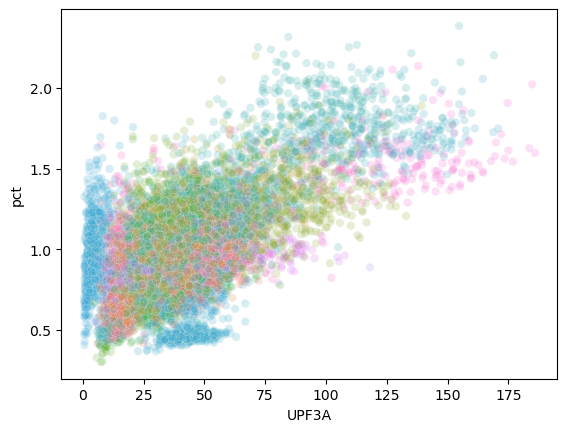

In [22]:
sns.scatterplot(data=upf_df, x='UPF3A', y='pct', legend=False, hue='tissue', alpha=0.2)

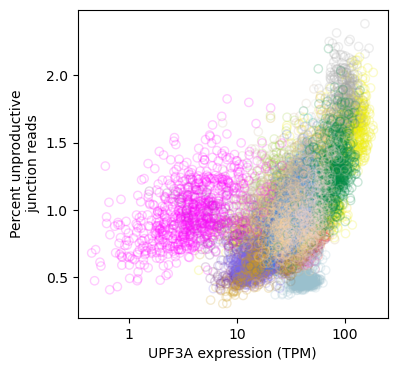

In [23]:
fig, ax = plt.subplots(figsize=(4,4))
for tissue, df in upf_df.groupby('tissue'):
    c = '#' + gtex_colors[tissue]['tissue_color_hex']
    ax.scatter(df.logUPF3A, df.pct, edgecolor=c, facecolor='none', alpha=0.2)
    
ax.set_xlabel('UPF3A expression (TPM)')
ax.set_ylabel('Percent unproductive\njunction reads')
ax.set_xticks([0, 1, 2], ['1', '10', '100'])

Text(0, 0.5, 'Percent unproductive\njunction reads')

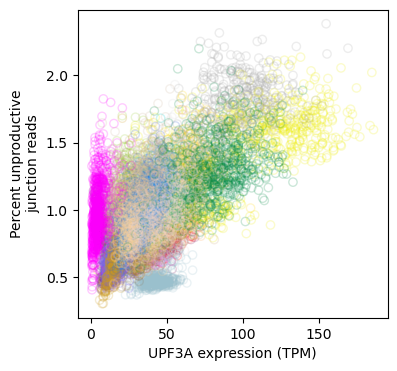

In [24]:
fig, ax = plt.subplots(figsize=(4,4))
for tissue, df in upf_df.groupby('tissue'):
    c = '#' + gtex_colors[tissue]['tissue_color_hex']
    ax.scatter(df.UPF3A, df.pct, edgecolor=c, facecolor='none', alpha=0.2)
    
ax.set_xlabel('UPF3A expression (TPM)')
ax.set_ylabel('Percent unproductive\njunction reads')
# ax.set_xticks([0, 1, 2], ['1', '10', '100'])

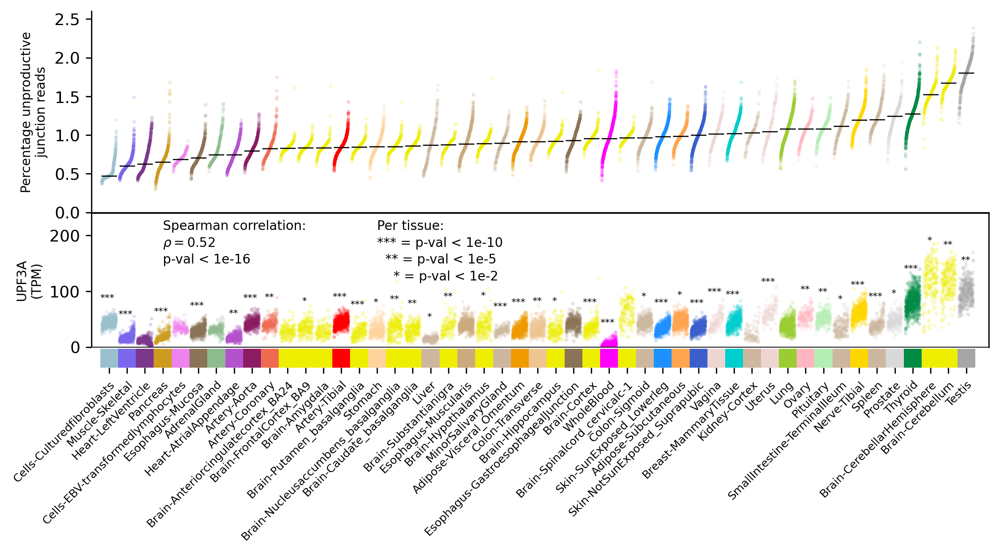

In [57]:
from scipy.stats import spearmanr, pearsonr
# sorted_tissues = pct_df.groupby('tissue').median().sort_values('pct').index
# expression_x = median_expression.loc[median_expression.loc[median_expression.gene_id.isin(protein_coding_genes)].index, sorted_tissues].quantile(0.5, axis=0)
# # expression_x = median_expression[sorted_tissues].quantile(0.5, axis=0)
# tau = (1-X_hat).sum(axis=0)/(n-1)

# shannon_list = []

fig, ax = plt.subplots(nrows = 3, figsize=(10, 4), gridspec_kw={'height_ratios':[15, 10, 1.5], 'hspace':0.005}, dpi=300)



# list_y = []
list_pos = []
pos = 0
for tissue_, pct_ in pct_df.groupby('tissue')[['pct']].median().sort_values('pct').iterrows():
#     y = sorted(pct_df.loc[pct_df.tissue == tissue_, 'pct'])
#     x = np.linspace(pos - 0.5, pos+0.5, len(y))
#     ax[1].scatter(x, y, alpha=0.2, edgecolor='none', facecolor='navy', s=10)
    list_pos.append(pos)
#     list_y.append(y)
    pos -= 1.5


sorted_tissues = pct_df.groupby('tissue').pct.median().sort_values().index[::-1]
expression_x = median_expression.loc[median_expression.loc[median_expression.gene_id.isin(protein_coding_genes)].index, sorted_tissues].quantile(0.5, axis=0)
# expression_x =((median_expression[sorted_tissues] > 0) & (median_expression[sorted_tissues] <= 1)).mean(axis=0)
tau = (1-X_hat).sum(axis=0)/(n-1)

pos=0

c_list = []
for tissue in sorted_tissues[::-1]:
    c = '#' + gtex_colors[tissue]['tissue_color_hex']
    c_list.append(c)
    y = upf_df.loc[upf_df.tissue == tissue, ].pct.sort_values()
    x = np.linspace(pos - 0.4, pos+0.4, len(y))
    ax[0].scatter(x, y, alpha=0.2, edgecolor='none', facecolor=c, s=5)
    median_y = np.median(y)
    ax[0].plot([pos-0.4, pos+0.4], [median_y, median_y], c='black', linewidth=0.75, alpha=0.95)
    list_pos.append(pos)
#     list_y.append(y)
    pos += 1
    
    y_tpm = list(upf_df.loc[upf_df.tissue == tissue, ].sort_values('pct').UPF3A)
    ax[1].scatter(x, y_tpm, alpha=0.2, edgecolor='none', facecolor=c, s=5)
    sp = pearsonr(x, y_tpm)
    median_tpm = np.median(y_tpm)
    

    
    if sp[1] <= 1e-10:
        ax[1].text(pos-1.5, np.quantile(y_tpm, 0.9)+30, '***', fontsize=6, c='black')
    elif sp[1] <= 1e-5:
        ax[1].text(pos-1.3, np.quantile(y_tpm, 0.9)+30, '**', fontsize=6, c='black')
    elif sp[1] <= 1e-2:
        ax[1].text(pos-1.2, np.quantile(y_tpm, 0.9)+30, '*', fontsize=6, c='black')
#     ax[0].plot([x[0], x[-1]], [median_tpm + ((-len(x))*sp[0]), median_tpm + ((len(x))*sp[0])], c='black')
#     ax[0].plot([x[0], x[-1]], [np.median(y_tpm[:50]), np.median(y_tpm[-50:])], c='black', linewidth=0.75, alpha=0.95)
#
    

# sns.stripplot(data = upf_df.loc[upf_df.tissue.isin(sorted_tissues)], x='tissue', y='UPF3A', 
#               alpha=0.02, 
#               edgecolor='tab:gray', facecolor='none', linewidth=1,
#               order=sorted_tissues[::-1], ax=ax[0])

# sns.boxplot(data = upf_df.loc[upf_df.tissue.isin(sorted_tissues)], x='tissue', y='UPF3A', 
#             showfliers=False,order=sorted_tissues[::-1], ax=ax[0],
#            boxprops=dict(facecolor='white', edgecolor='black'), medianprops={'color': 'tab:red'})


# sns.stripplot(data=pct_df, x = 'tissue', y='pct', ax=ax[1], order=sorted_tissues[::-1], alpha=0.02, 
#               edgecolor='tab:gray', facecolor='none', linewidth=1)

# sns.boxplot(data=pct_df, x = 'tissue', y='pct', ax=ax[1], order=sorted_tissues[::-1], showfliers=False,
#            boxprops=dict(facecolor='white', edgecolor='black'), medianprops={'color': 'tab:red'})
# ax[0].bar(np.arange(49)[::-1], expression_x, color='lightgray')
# ax[0].bar(list_pos, pct_df.tissue.value_counts().loc[sorted_tissues])
# ax.boxplot(list_y)
ax[0].set_xlim((-1, 49.25))
ax[0].set_ylim([0, 2.6])
ax[1].set_ylim([0, 240])
ax[1].set_xlim((-1, 49.25))
ax[2].set_xlim((-1, 49.25))

ax[1].set_xticks([])

ax[0].set_xticks([])
ax[2].set_xticks(np.arange(49), sorted_tissues[::-1], rotation=45, ha='right', rotation_mode='anchor', size=7)

ax[2].bar(range(49), [1]*49, width =1, color=c_list)

ax[2].spines[['top', 'bottom', 'right', 'left']].set_visible(False)
ax[2].set_yticks([])
ax[0].spines[['top', 'right']].set_visible(False)
ax[1].set_ylabel('UPF3A\n(TPM)', size=8)
ax[0].set_ylabel('Percentage unproductive\njunction reads', size=8)

ax[1].text(3, 210, 'Spearman correlation:', fontsize=8)
ax[1].text(3, 180, r'$\rho=0.52$', fontsize=8)
ax[1].text(3, 150, 'p-val < 1e-16', fontsize=8)

ax[1].text(15, 210, 'Per tissue:', fontsize=8)
ax[1].text(15, 180, '*** = p-val < 1e-10', fontsize=8)
ax[1].text(15, 150, '  ** = p-val < 1e-5', fontsize=8)
ax[1].text(15, 120, '    * = p-val < 1e-2', fontsize=8)

# ax[1].text(20, 180, r'Overall Spearman $\rho=0.52$' + '\np-val < 1e-10', fontsize=8)


# ax[0].plot([-0.5, 48.5], [np.median(expression_x), np.median(expression_x)], 'r--', alpha=0.5)
# ax[0].text(42, 7.2, 'Median: 6.26', fontsize=8)

plt.show()

# fig, ax = plt.subplots(figsize=(15, 3))
# sns.violinplot(data = upf_df.loc[upf_df.tissue.isin(sorted_tissues)], x='tissue', y='UPF3B', order=sorted_tissues, ax=ax)
# ax.set_xticklabels(sorted_tissues, rotation=90)

In [25]:
sorted_tissues = pct_df.groupby('tissue').pct.median().sort_values().index[::-1]
sorted_tissues

Index(['Testis', 'Brain-Cerebellum', 'Brain-CerebellarHemisphere', 'Thyroid',
       'Prostate', 'Spleen', 'Nerve-Tibial', 'SmallIntestine-TerminalIleum',
       'Pituitary', 'Ovary', 'Lung', 'Uterus', 'Kidney-Cortex',
       'Breast-MammaryTissue', 'Vagina', 'Skin-NotSunExposed_Suprapubic',
       'Adipose-Subcutaneous', 'Skin-SunExposed_Lowerleg', 'Colon-Sigmoid',
       'Brain-Spinalcord_cervicalc-1', 'WholeBlood', 'Brain-Cortex',
       'Esophagus-GastroesophagealJunction', 'Brain-Hippocampus',
       'Colon-Transverse', 'Adipose-Visceral_Omentum', 'MinorSalivaryGland',
       'Brain-Hypothalamus', 'Esophagus-Muscularis', 'Brain-Substantianigra',
       'Liver', 'Brain-Caudate_basalganglia',
       'Brain-Nucleusaccumbens_basalganglia', 'Stomach',
       'Brain-Putamen_basalganglia', 'Artery-Tibial', 'Brain-Amygdala',
       'Brain-FrontalCortex_BA9', 'Brain-Anteriorcingulatecortex_BA24',
       'Artery-Coronary', 'Artery-Aorta', 'Heart-AtrialAppendage',
       'AdrenalGland', 'Eso

In [26]:
sorted_tissues_names = ['Testis', 'Brain - Cerebellum', 'Brain - Cerebellar Hemisphere', 'Thyroid',
       'Prostate', 'Spleen', 'Nerve - Tibial', 'Small Intestine - Terminal Ileum',
       'Pituitary', 'Ovary', 'Lung', 'Uterus', 'Kidney - Cortex',
       'Breast - Mammary Tissue', 'Vagina', 'Skin - Not Sun Exposed (Suprapubic)',
       'Adipose - Subcutaneous', 'Skin - Sun Exposed (Lower leg)', 'Colon - Sigmoid',
       'Brain - Spinal cord (cervical c-1)', 'Whole Blood', 'Brain - Cortex',
       'Esophagus - Gastroesophageal Junction', 'Brain - Hippocampus',
       'Colon - Transverse', 'Adipose - Visceral (Omentum)', 'Minor Salivary Gland',
       'Brain - Hypothalamus', 'Esophagus - Muscularis', 'Brain - Substantianigra',
       'Liver', 'Brain - Caudate (basal ganglia)',
       'Brain - Nucleus accumbens (basal ganglia)', 'Stomach',
       'Brain - Putamen (basal ganglia)', 'Artery - Tibial', 'Brain - Amygdala',
       'Brain - Frontal Cortex (BA9)', 'Brain - Anterior cingulate cortex (BA24)',
       'Artery - Coronary', 'Artery - Aorta', 'Heart - Atrial Appendage',
       'Adrenal Gland', 'Esophagus - Mucosa', 'Cells - EBV-transformed lymphocytes',
       'Pancreas', 'Heart - Left Ventricle', 'Muscle - Skeletal',
       'Cells - Cultured fibroblasts']

In [ ]:
'Artery - Aorta', 'Brain - Cortex', 'Brain - Nucleus accumbens (basal ganglia)', 'Esophagus - Muscularis', 
    'Adipose - Visceral (omentum)', 'Adrenal gland', 'Artery - Coronary', 'Bladder', 'Brain - Amygdala', 
    'Brain - Anterior cingulate cortex (BA24)', 'Brain - Caudate (basal ganglia)', 'Brain - Cerebellar hemisphere', 
    'Brain - Cerebellum', 'Brain - Hypothalamus', 'Brain - Putamen (basal ganglia)', 'Brain - Spinalcord (cervical c-1)', 
    'Brain - Substantia nigra', 'Cells - Cultured fibroblasts', 'Esophagus - Gastroesophageal junction', 
    'Esophagus - Mucosa', 'Heart - Atrial appendage', 
    'Heart - Left ventricle', 'Kidney - Cortex', 'Lung', 'Minor salivary gland', 'Ovary', 'Pancreas', 'Pituitary', 
    'Prostate', 'Small intestine - Terminal ileum', 'Spleen', 'Stomach', 'Testis', 'Thyroid', 'Uterus', 'Vagina', 
    'Adipose - Subcutaneous', 'Artery - Tibial', 'Brain - Frontal cortex (BA9)', 'Brain - Hippocampus', 
    'Breast - Mammary tissue', 'Cells - EBV-transformed lymphocytes', 'Colon - Sigmoid', 'Colon - Transverse', 
    'Liver', 'Muscle - Skeletal', 'Nerve - Tibial', 'Skin - Not sun exposed (suprapubic)', 
    'Skin - Sun exposed (lower leg)', 'Whole blood'

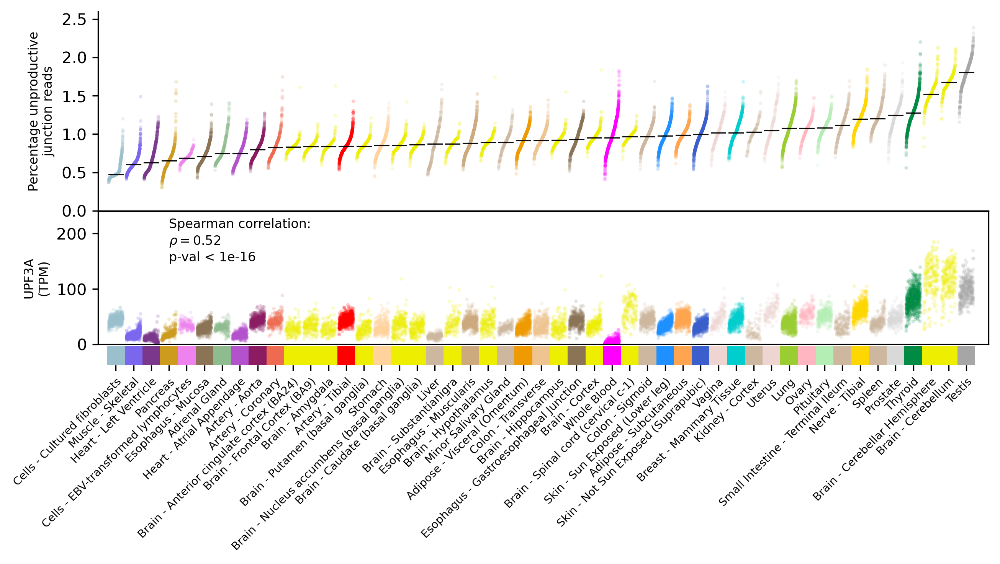

In [64]:
from scipy.stats import spearmanr, pearsonr
# sorted_tissues = pct_df.groupby('tissue').median().sort_values('pct').index
# expression_x = median_expression.loc[median_expression.loc[median_expression.gene_id.isin(protein_coding_genes)].index, sorted_tissues].quantile(0.5, axis=0)
# # expression_x = median_expression[sorted_tissues].quantile(0.5, axis=0)
# tau = (1-X_hat).sum(axis=0)/(n-1)

# shannon_list = []

fig, ax = plt.subplots(nrows = 3, figsize=(10, 4), gridspec_kw={'height_ratios':[15, 10, 1.5], 'hspace':0.005}, dpi=300)


sorted_tissues = pct_df.groupby('tissue').pct.median().sort_values().index[::-1]
expression_x = median_expression.loc[median_expression.loc[median_expression.gene_id.isin(protein_coding_genes)].index, sorted_tissues].quantile(0.5, axis=0)
# expression_x =((median_expression[sorted_tissues] > 0) & (median_expression[sorted_tissues] <= 1)).mean(axis=0)
tau = (1-X_hat).sum(axis=0)/(n-1)

pos=0

c_list = []
for tissue in sorted_tissues[::-1]:
    c = '#' + gtex_colors[tissue]['tissue_color_hex']
    c_list.append(c)
    y = upf_df.loc[upf_df.tissue == tissue, ].pct.sort_values()
    x = np.linspace(pos - 0.4, pos+0.4, len(y))
    ax[0].scatter(x, y, alpha=0.2, edgecolor='none', facecolor=c, s=5, rasterized=True)
    median_y = np.median(y)
    ax[0].plot([pos-0.4, pos+0.4], [median_y, median_y], c='black', linewidth=0.75, alpha=0.95)
    list_pos.append(pos)
#     list_y.append(y)
    pos += 1
    
    y_tpm = list(upf_df.loc[upf_df.tissue == tissue, ].sort_values('pct').UPF3A)
    ax[1].scatter(x, y_tpm, alpha=0.2, edgecolor='none', facecolor=c, s=5, rasterized=True)
    sp = pearsonr(x, y_tpm)
    median_tpm = np.median(y_tpm)
    

# ax.boxplot(list_y)
ax[0].set_xlim((-1, 49.25))
ax[0].set_ylim([0, 2.6])
ax[1].set_ylim([0, 240])
ax[1].set_xlim((-1, 49.25))
ax[2].set_xlim((-1, 49.25))

ax[1].set_xticks([])

ax[0].set_xticks([])
ax[2].set_xticks(np.arange(49), sorted_tissues_names[::-1], rotation=45, ha='right', rotation_mode='anchor', size=7)

ax[2].bar(range(49), [1]*49, width =1, color=c_list)

ax[2].spines[['top', 'bottom', 'right', 'left']].set_visible(False)
ax[2].set_yticks([])
ax[0].spines[['top', 'right']].set_visible(False)
ax[1].set_ylabel('UPF3A\n(TPM)', size=8)
ax[0].set_ylabel('Percentage unproductive\njunction reads', size=8)

ax[1].text(3, 210, 'Spearman correlation:', fontsize=8)
ax[1].text(3, 180, r'$\rho=0.52$', fontsize=8)
ax[1].text(3, 150, 'p-val < 1e-16', fontsize=8)

# ax[1].text(15, 210, 'Per tissue:', fontsize=8)
# ax[1].text(15, 180, '*** = p-val < 1e-10', fontsize=8)
# ax[1].text(15, 150, '  ** = p-val < 1e-5', fontsize=8)
# ax[1].text(15, 120, '    * = p-val < 1e-2', fontsize=8)

# ax[1].text(20, 180, r'Overall Spearman $\rho=0.52$' + '\np-val < 1e-10', fontsize=8)


# ax[0].plot([-0.5, 48.5], [np.median(expression_x), np.median(expression_x)], 'r--', alpha=0.5)
# ax[0].text(42, 7.2, 'Median: 6.26', fontsize=8)

# plt.show()

# fig, ax = plt.subplots(figsize=(15, 3))
# sns.violinplot(data = upf_df.loc[upf_df.tissue.isin(sorted_tissues)], x='tissue', y='UPF3B', order=sorted_tissues, ax=ax)
# ax.set_xticklabels(sorted_tissues, rotation=90)

plt.savefig('plots/fig2A.png', dpi=300, bbox_inches='tight')
plt.savefig('plots/fig2A.pdf', dpi=300, bbox_inches='tight')
plt.savefig('plots/fig2A.svg', dpi=300, bbox_inches='tight')

In [25]:
from scipy.stats import pearsonr, spearmanr

In [26]:
metadata = pd.read_csv('../../code/resources/GTEx/GTEx_Analysis_v8_Annotations_SampleAttributesDS.txt', sep='\t')
metadata_rin = metadata[['SAMPID', 'SMRIN']]
metadata_rin.columns = ['entity:sample_id', 'RIN']

In [28]:
upf_df = upf_df.merge(metadata_rin, on = 'entity:sample_id')

In [31]:
data = upf_df.groupby('tissue')[['UPF3A', 'pct']].median()

spearmanr(data.UPF3A, data.pct)

SignificanceResult(statistic=np.float64(0.6182810788001336), pvalue=np.float64(2.201927373649294e-06))

In [32]:
data = upf_df.groupby('tissue')[['logUPF3A', 'pct']].median()

spearmanr(data.logUPF3A, data.pct)

SignificanceResult(statistic=np.float64(0.6182810788001336), pvalue=np.float64(2.201927373649294e-06))

In [33]:
data = upf_df.groupby('tissue')[['ratio', 'pct']].median()

spearmanr(data.ratio, data.pct)

SignificanceResult(statistic=np.float64(0.1257142857142857), pvalue=np.float64(0.3894008168246077))

In [34]:
spearmanr(upf_df.ratio, upf_df.pct)

SignificanceResult(statistic=np.float64(0.1135189859008366), pvalue=np.float64(8.407603518603722e-51))

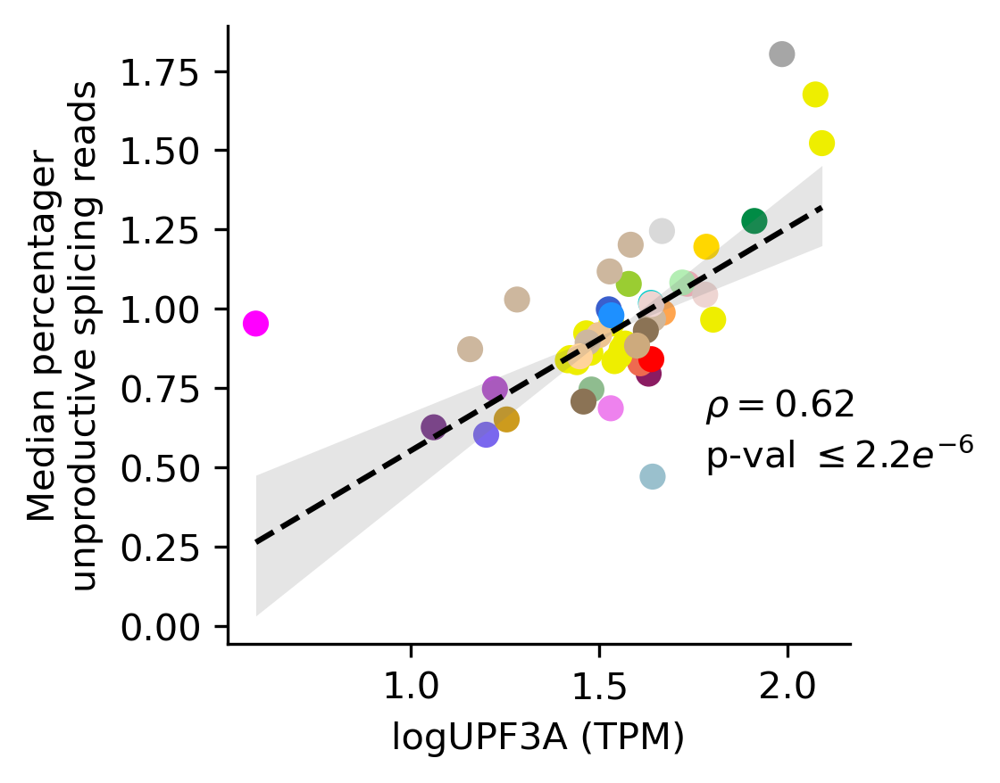

In [62]:
c_list = []
for tissue in data.index:
    c = '#' + gtex_colors[tissue]['tissue_color_hex']
    c_list.append(c)
    
fig, ax = plt.subplots(figsize=(3, 3), dpi=300)
    
ax.scatter(data.logUPF3A, data.pct, c=c_list)


Y = data.pct
X = data.logUPF3A
X = sm.add_constant(X)


rho_list = []
for i in range(100):
    idx = np.random.choice(np.arange(49), 30, replace=False)
    
    Y_ = Y.iloc[idx]
    X_ = X.iloc[idx]
    X_ = sm.add_constant(X_)

    
    model = sm.RLM(Y_,X_)
    results = model.fit()

    slope = results.params.iloc[1]
    const = results.params.iloc[0]

    rho_list.append(slope)

# slope = pearsonr(list(ds_sig.logef), list(ds_sig.log2FoldChange))[0]
# intercept = np.mean(list(ds_sig.log2FoldChange))
slope_90 = np.quantile(rho_list, 0.9)
slope_10 = np.quantile(rho_list, 0.1)

# Plot confidence intervals (optional)

model = sm.RLM(Y,X)
results = model.fit()

slope = results.params.loc['logUPF3A']
const = results.params.loc['const']

mean_X = np.mean(X.logUPF3A)

x = np.linspace(np.min(data.logUPF3A)-mean_X, np.max(data.logUPF3A)-mean_X, 100) 

ax.plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


ax.fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
                (slope_10 * x) + const+ (slope*mean_X), 
                 color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)


ax.set_xlabel('logUPF3A (TPM)')
ax.set_ylabel('Median percentager\nunproductive splicing reads')

ax.spines[['top', 'right']].set_visible(False)

ax.text(np.log10(60), 0.5, r'$\rho=0.62$' + '\np-val ' + r'$\leq 2.2e^{-6}$')


plt.savefig('plots/sup_fig4B.png', dpi=300, bbox_inches='tight')
plt.savefig('plots/sup_fig4B.pdf', dpi=300, bbox_inches='tight')
plt.savefig('plots/sup_fig4B.svg', dpi=300, bbox_inches='tight')

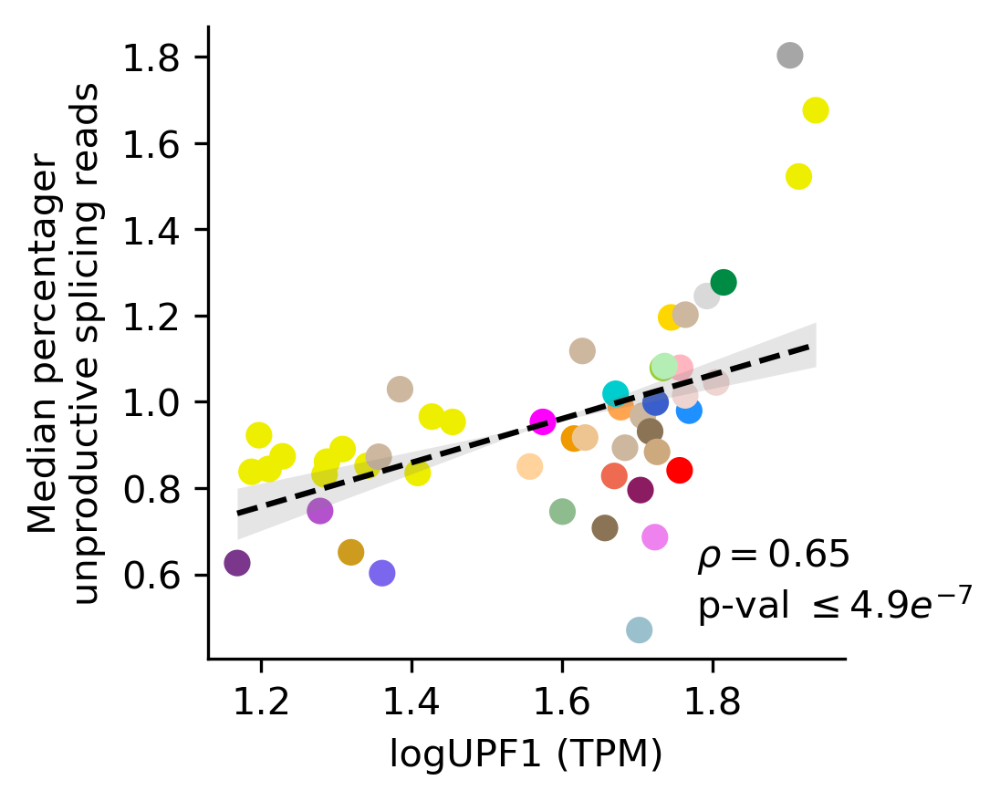

In [77]:
data = upf_df.groupby('tissue')[['logUPF1', 'pct']].median()

c_list = []
for tissue in data.index:
    c = '#' + gtex_colors[tissue]['tissue_color_hex']
    c_list.append(c)
    
fig, ax = plt.subplots(figsize=(3, 3), dpi=300)
    
ax.scatter(data.logUPF1, data.pct, c=c_list)


Y = data.pct
X = data.logUPF1
X = sm.add_constant(X)


rho_list = []
for i in range(100):
    idx = np.random.choice(np.arange(49), 30, replace=False)
    
    Y_ = Y.iloc[idx]
    X_ = X.iloc[idx]
    X_ = sm.add_constant(X_)

    
    model = sm.RLM(Y_,X_)
    results = model.fit()

    slope = results.params.iloc[1]
    const = results.params.iloc[0]

    rho_list.append(slope)

# slope = pearsonr(list(ds_sig.logef), list(ds_sig.log2FoldChange))[0]
# intercept = np.mean(list(ds_sig.log2FoldChange))
slope_90 = np.quantile(rho_list, 0.9)
slope_10 = np.quantile(rho_list, 0.1)

# Plot confidence intervals (optional)

model = sm.RLM(Y,X)
results = model.fit()

slope = results.params.loc['logUPF1']
const = results.params.loc['const']

mean_X = np.mean(X.logUPF1)

x = np.linspace(np.min(data.logUPF1)-mean_X, np.max(data.logUPF1)-mean_X, 100) 

ax.plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


ax.fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
                (slope_10 * x) + const+ (slope*mean_X), 
                 color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)


ax.set_xlabel('logUPF1 (TPM)')
ax.set_ylabel('Median percentager\nunproductive splicing reads')

ax.spines[['top', 'right']].set_visible(False)

ax.text(np.log10(60), 0.5, r'$\rho=0.65$' + '\np-val ' + r'$\leq 4.9e^{-7}$')


plt.savefig('plots/sup_fig4UPF1.png', dpi=300, bbox_inches='tight')
plt.savefig('plots/sup_fig4UPF1.pdf', dpi=300, bbox_inches='tight')
plt.savefig('plots/sup_fig4UPF1.svg', dpi=300, bbox_inches='tight')

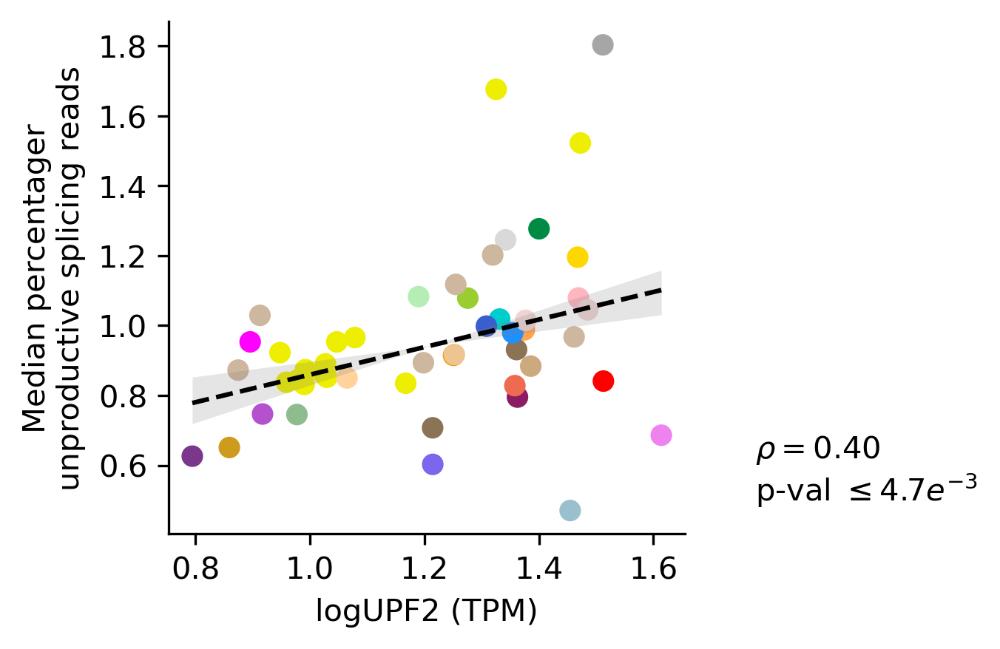

In [79]:
data = upf_df.groupby('tissue')[['logUPF2', 'pct']].median()

c_list = []
for tissue in data.index:
    c = '#' + gtex_colors[tissue]['tissue_color_hex']
    c_list.append(c)
    
fig, ax = plt.subplots(figsize=(3, 3), dpi=300)
    
ax.scatter(data.logUPF2, data.pct, c=c_list)


Y = data.pct
X = data.logUPF2
X = sm.add_constant(X)


rho_list = []
for i in range(100):
    idx = np.random.choice(np.arange(49), 30, replace=False)
    
    Y_ = Y.iloc[idx]
    X_ = X.iloc[idx]
    X_ = sm.add_constant(X_)

    
    model = sm.RLM(Y_,X_)
    results = model.fit()

    slope = results.params.iloc[1]
    const = results.params.iloc[0]

    rho_list.append(slope)

# slope = pearsonr(list(ds_sig.logef), list(ds_sig.log2FoldChange))[0]
# intercept = np.mean(list(ds_sig.log2FoldChange))
slope_90 = np.quantile(rho_list, 0.9)
slope_10 = np.quantile(rho_list, 0.1)

# Plot confidence intervals (optional)

model = sm.RLM(Y,X)
results = model.fit()

slope = results.params.loc['logUPF2']
const = results.params.loc['const']

mean_X = np.mean(X.logUPF2)

x = np.linspace(np.min(data.logUPF2)-mean_X, np.max(data.logUPF2)-mean_X, 100) 

ax.plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


ax.fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
                (slope_10 * x) + const+ (slope*mean_X), 
                 color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)


ax.set_xlabel('logUPF2 (TPM)')
ax.set_ylabel('Median percentager\nunproductive splicing reads')

ax.spines[['top', 'right']].set_visible(False)

ax.text(np.log10(60), 0.5, r'$\rho=0.40$' + '\np-val ' + r'$\leq 4.7e^{-3}$')


plt.savefig('plots/sup_fig4UPF2.png', dpi=300, bbox_inches='tight')
plt.savefig('plots/sup_fig4UPF2.pdf', dpi=300, bbox_inches='tight')
plt.savefig('plots/sup_fig4UPF2.svg', dpi=300, bbox_inches='tight')

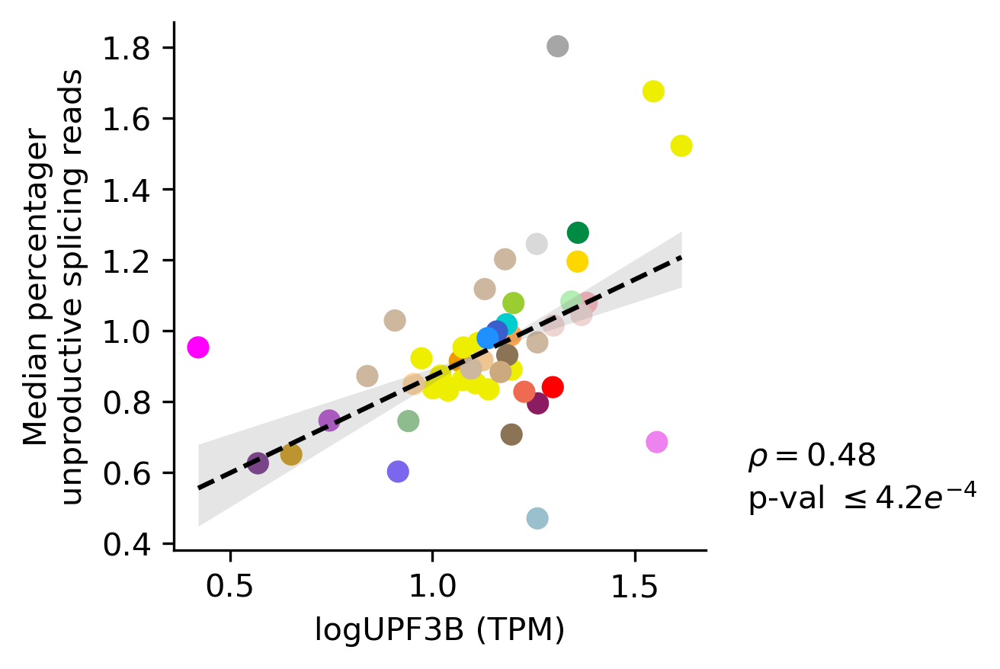

In [80]:
data = upf_df.groupby('tissue')[['logUPF3B', 'pct']].median()

c_list = []
for tissue in data.index:
    c = '#' + gtex_colors[tissue]['tissue_color_hex']
    c_list.append(c)
    
fig, ax = plt.subplots(figsize=(3, 3), dpi=300)
    
ax.scatter(data.logUPF3B, data.pct, c=c_list)


Y = data.pct
X = data.logUPF3B
X = sm.add_constant(X)


rho_list = []
for i in range(100):
    idx = np.random.choice(np.arange(49), 30, replace=False)
    
    Y_ = Y.iloc[idx]
    X_ = X.iloc[idx]
    X_ = sm.add_constant(X_)

    
    model = sm.RLM(Y_,X_)
    results = model.fit()

    slope = results.params.iloc[1]
    const = results.params.iloc[0]

    rho_list.append(slope)

# slope = pearsonr(list(ds_sig.logef), list(ds_sig.log2FoldChange))[0]
# intercept = np.mean(list(ds_sig.log2FoldChange))
slope_90 = np.quantile(rho_list, 0.9)
slope_10 = np.quantile(rho_list, 0.1)

# Plot confidence intervals (optional)

model = sm.RLM(Y,X)
results = model.fit()

slope = results.params.loc['logUPF3B']
const = results.params.loc['const']

mean_X = np.mean(X.logUPF3B)

x = np.linspace(np.min(data.logUPF3B)-mean_X, np.max(data.logUPF3B)-mean_X, 100) 

ax.plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


ax.fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
                (slope_10 * x) + const+ (slope*mean_X), 
                 color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)


ax.set_xlabel('logUPF3B (TPM)')
ax.set_ylabel('Median percentager\nunproductive splicing reads')

ax.spines[['top', 'right']].set_visible(False)

ax.text(np.log10(60), 0.5, r'$\rho=0.48$' + '\np-val ' + r'$\leq 4.2e^{-4}$')


plt.savefig('plots/sup_fig4UPF3B.png', dpi=300, bbox_inches='tight')
plt.savefig('plots/sup_fig4UPF3B.pdf', dpi=300, bbox_inches='tight')
plt.savefig('plots/sup_fig4UPF3B.svg', dpi=300, bbox_inches='tight')

In [35]:
data = upf_df.groupby('tissue')[['logUPF3B', 'pct']].median()

spearmanr(data.logUPF3B, data.pct)

SignificanceResult(statistic=np.float64(0.4842857142857142), pvalue=np.float64(0.00042211048826565583))

In [36]:
data = upf_df.groupby('tissue')[['logUPF1', 'pct']].median()

spearmanr(data.logUPF1, data.pct)

SignificanceResult(statistic=np.float64(0.6477551020408163), pvalue=np.float64(4.88059891447667e-07))

In [37]:
data = upf_df.groupby('tissue')[['logUPF2', 'pct']].median()

spearmanr(data.logUPF2, data.pct)

SignificanceResult(statistic=np.float64(0.39775510204081627), pvalue=np.float64(0.004651722025263991))

In [38]:
spearmanr(upf_df.logUPF1, upf_df.pct)

SignificanceResult(statistic=np.float64(0.46335560663504), pvalue=np.float64(0.0))

In [39]:
spearmanr(upf_df.logUPF3A, upf_df.pct)

SignificanceResult(statistic=np.float64(0.5249070829013607), pvalue=np.float64(0.0))

In [40]:
data = upf_df.groupby('tissue')[['RIN', 'pct']].median()

spearmanr(data.RIN, data.pct)

SignificanceResult(statistic=np.float64(-0.33299368811872054), pvalue=np.float64(0.019390346944399915))

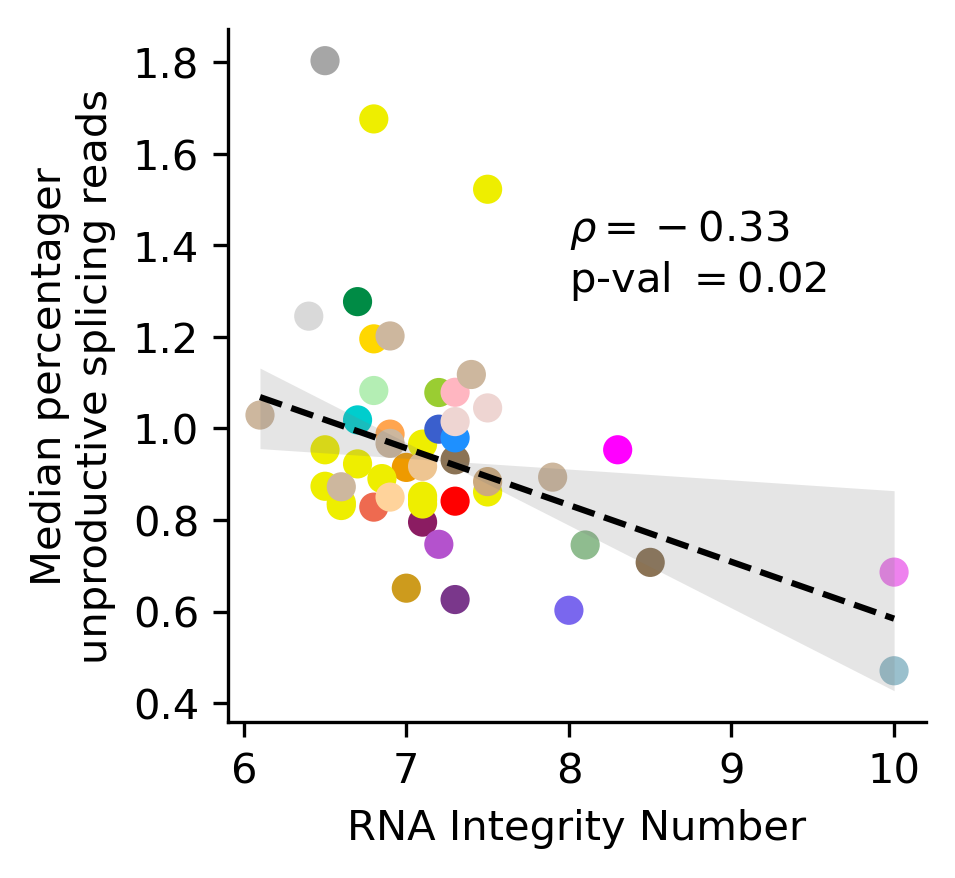

In [37]:


fig, ax = plt.subplots(figsize=(3, 3), dpi=300)


data = upf_df.groupby('tissue')[['RIN', 'pct']].median()
c_list = []
for tissue in data.index:
    c = '#' + gtex_colors[tissue]['tissue_color_hex']
    c_list.append(c)
    
ax.scatter(data.RIN, data.pct, c=c_list)


Y = data.pct
X = data.RIN
X = sm.add_constant(X)


rho_list = []
for i in range(100):
    idx = np.random.choice(np.arange(49), 15, replace=False)
    
    Y_ = Y.iloc[idx]
    X_ = X.iloc[idx]
    X_ = sm.add_constant(X_)

    
    model = sm.RLM(Y_,X_)
    results = model.fit()

    slope = results.params.iloc[1]
    const = results.params.iloc[0]

    rho_list.append(slope)

# slope = pearsonr(list(ds_sig.logef), list(ds_sig.log2FoldChange))[0]
# intercept = np.mean(list(ds_sig.log2FoldChange))
slope_90 = np.quantile(rho_list, 0.9)
slope_10 = np.quantile(rho_list, 0.1)

# Plot confidence intervals (optional)

model = sm.RLM(Y,X)
results = model.fit()

slope = results.params.loc['RIN']
const = results.params.loc['const']

mean_X = np.mean(X.RIN)

x = np.linspace(np.min(data.RIN)-mean_X, np.max(data.RIN)-mean_X, 100) 

ax.plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


ax.fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
                (slope_10 * x) + const+ (slope*mean_X), 
                 color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)


ax.set_xlabel('RNA Integrity Number')
ax.set_ylabel('Median percentager\nunproductive splicing reads')

ax.spines[['top', 'right']].set_visible(False)

ax.text(8, 1.3, r'$\rho=-0.33$' + '\np-val ' + r'$= 0.02$')



plt.savefig('plots/sup_fig4A.png', dpi=300, bbox_inches='tight')
plt.savefig('plots/sup_fig4A.pdf', dpi=300, bbox_inches='tight')
plt.savefig('plots/sup_fig4A.svg', dpi=300, bbox_inches='tight')

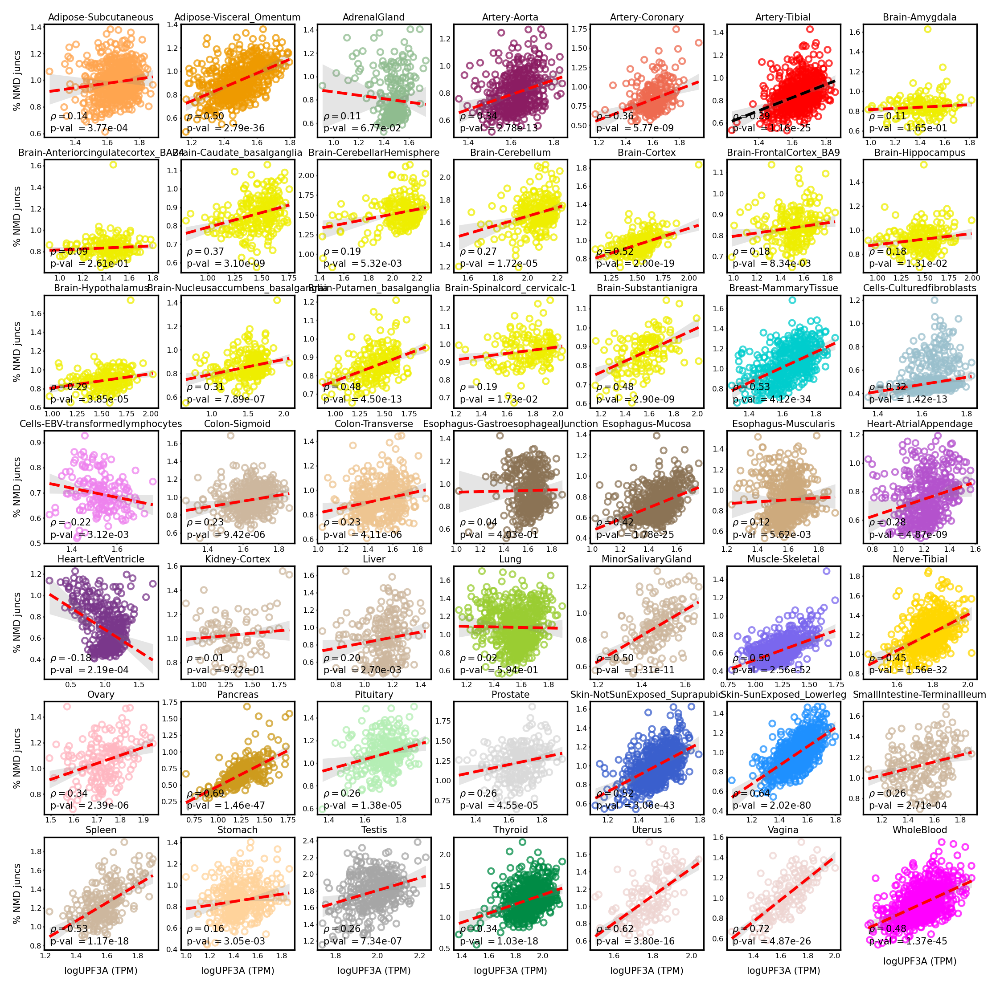

In [60]:
fig, ax = plt.subplots(7, 7, figsize=(9, 9), dpi=300)
i = 0
j = 0

tissue_list = []
rho_all_list = []
pval_all_list = []

for tissue, df in upf_df.sort_values('tissue').groupby('tissue'):
    tissue_list.append(tissue)
    ax[i, j].scatter(df.logUPF3A, df.pct, edgecolor = '#' + gtex_colors[tissue]['tissue_color_hex'], s=10, alpha=0.75, 
                     facecolor='none', rasterized=True)
    
    if j == 0:
        ax[i,j].set_ylabel('% NMD juncs', size=5)
    
    
        
    if (i == 6):
        ax[i,j].set_xlabel('logUPF3A (TPM)', size=5)
#     ax[i,j].set_xticks([])
#     ax[i,j].set_yticks([])
    
    
    ax[i,j].tick_params(labelsize=4, length=0.5, pad=1)
    
    Y = df.pct
    X = df.logUPF3A
    X = sm.add_constant(X)


    rho_list = []
    for n in range(100):
        idx = np.random.choice(np.arange(df.shape[0]), 50, replace=False)

        Y_ = Y.iloc[idx]
        X_ = X.iloc[idx]
        X_ = sm.add_constant(X_)


        model = sm.RLM(Y_,X_)
        results = model.fit()

        slope = results.params.iloc[1]
        const = results.params.iloc[0]

        rho_list.append(slope)

    # slope = pearsonr(list(ds_sig.logef), list(ds_sig.log2FoldChange))[0]
    # intercept = np.mean(list(ds_sig.log2FoldChange))
    slope_90 = np.quantile(rho_list, 0.9)
    slope_10 = np.quantile(rho_list, 0.1)

    # Plot confidence intervals (optional)

    model = sm.RLM(Y,X)
    results = model.fit()

    slope = results.params.loc['logUPF3A']
    const = results.params.loc['const']

    mean_X = np.mean(X.logUPF3A)

    x = np.linspace(np.min(df.logUPF3A)-mean_X, np.max(df.logUPF3A)-mean_X, 100) 

    if tissue == 'Artery-Tibial':
        ax[i, j].plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')
        
    else:
        
        ax[i, j].plot(x + mean_X, (slope * (x+mean_X)) + const, color='red', linestyle='--')


    ax[i, j].fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
                    (slope_10 * x) + const+ (slope*mean_X), 
                     color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)
    
    
    
    spear = spearmanr(df.logUPF3A, df.pct)
    
    rho_all_list.append(spear[0])
    pval_all_list.append(spear[1])
    
    
    slope = f"{spear[0]:.2f}"
    
    pval = f"{spear[1]:.2e}" 
    
    ax[i,j].get_ylim()
    
    
    ax[i, j].text(np.quantile(ax[i,j].get_xlim(), 0.05), np.quantile(ax[i,j].get_ylim(), 0.05), r'$\rho=$' + slope + '\np-val ' + r'$=$' + pval, fontsize=5)

    ax[i,j].set_title(tissue, size=5, pad=2)

    j += 1
    if j >= 7:
        j = 0
        i += 1
        
ax[-1,-1].set_xticks([])
ax[-1,-1].set_yticks([])
ax[-1,-1].spines[['top', 'right', 'bottom', 'left']].set_visible(False)
ax[-1,-1].set_facecolor('none')        
    

plt.savefig('plots/sup_fig5A.png', dpi=300, bbox_inches='tight')
plt.savefig('plots/sup_fig5A.pdf', dpi=300, bbox_inches='tight')
plt.savefig('plots/sup_fig5A.svg', dpi=300, bbox_inches='tight')

In [41]:
for tissue, df in upf_df.sort_values('tissue').groupby('tissue'):
    break

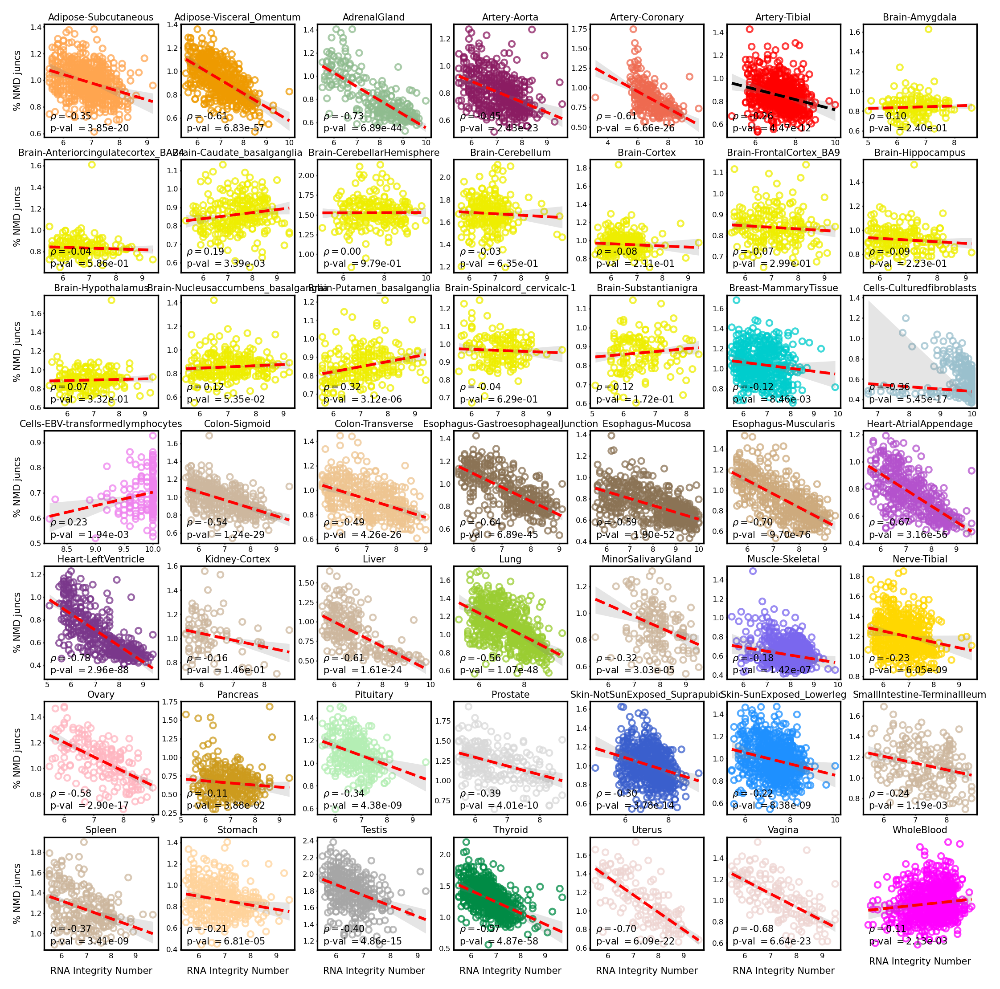

In [59]:
fig, ax = plt.subplots(7, 7, figsize=(9, 9), dpi=300)
i = 0
j = 0

tissue_rin_list = []
rho_rin_list = []
pval_rin_list = []

for tissue, df in upf_df.sort_values('tissue').groupby('tissue'):
    tissue_rin_list.append(tissue)
    ax[i, j].scatter(df.RIN, df.pct, edgecolor = '#' + gtex_colors[tissue]['tissue_color_hex'], s=10, alpha=0.75, 
                     facecolor='none', rasterized=True)
    
    if j == 0:
        ax[i,j].set_ylabel('% NMD juncs', size=5)
    
        
    if (i == 6):
        ax[i,j].set_xlabel('RNA Integrity Number', size=5)
#     ax[i,j].set_xticks([])
#     ax[i,j].set_yticks([])
    
    
    ax[i,j].tick_params(labelsize=4, length=0.5, pad=1)
    
    
#     ax[i,j].set_xticks([])
#     ax[i,j].set_yticks([])
    
    
    
    Y = df.pct
    X = df.RIN
    X = sm.add_constant(X)


    rho_list = []
    for n in range(100):
        idx = np.random.choice(np.arange(df.shape[0]), 50, replace=False)

        Y_ = Y.iloc[idx]
        X_ = X.iloc[idx]
        X_ = sm.add_constant(X_)


        model = sm.RLM(Y_,X_)
        results = model.fit()

        slope = results.params.iloc[1]
        const = results.params.iloc[0]

        rho_list.append(slope)

    # slope = pearsonr(list(ds_sig.logef), list(ds_sig.log2FoldChange))[0]
    # intercept = np.mean(list(ds_sig.log2FoldChange))
    slope_90 = np.quantile(rho_list, 0.9)
    slope_10 = np.quantile(rho_list, 0.1)

    # Plot confidence intervals (optional)

    model = sm.RLM(Y,X)
    results = model.fit()

    slope = results.params.loc['RIN']
    const = results.params.loc['const']

    mean_X = np.mean(X.RIN)

    x = np.linspace(np.min(df.RIN)-mean_X, np.max(df.RIN)-mean_X, 100) 

    if tissue == 'Artery-Tibial':
        ax[i, j].plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')
        
    else:
        
        ax[i, j].plot(x + mean_X, (slope * (x+mean_X)) + const, color='red', linestyle='--')


    ax[i, j].fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
                    (slope_10 * x) + const+ (slope*mean_X), 
                     color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)
    
    spear = spearmanr(df.RIN, df.pct)
    
    rho_rin_list.append(spear[0])
    pval_rin_list.append(spear[1])
    
    
    slope = f"{spear[0]:.2f}"
    
    pval = f"{spear[1]:.2e}" 
    
    ax[i,j].get_ylim()
    
    
    ax[i, j].text(np.quantile(ax[i,j].get_xlim(), 0.05), np.quantile(ax[i,j].get_ylim(), 0.05), r'$\rho=$' + slope + '\np-val ' + r'$=$' + pval, fontsize=5)

    ax[i,j].set_title(tissue, size=5, pad=2)

    j += 1
    if j >= 7:
        j = 0
        i += 1
        
ax[-1,-1].set_xticks([])
ax[-1,-1].set_yticks([])
ax[-1,-1].spines[['top', 'right', 'bottom', 'left']].set_visible(False)
ax[-1,-1].set_facecolor('none')        
        
    
plt.savefig('plots/sup_fig5B.png', dpi=300, bbox_inches='tight')
plt.savefig('plots/sup_fig5B.pdf', dpi=300, bbox_inches='tight')
plt.savefig('plots/sup_fig5B.svg', dpi=300, bbox_inches='tight')    

In [93]:


Y = upf_df.pct
X = upf_df[['RIN', 'logUPF3A']]
X = sm.add_constant(X)

model = sm.RLM(Y,X)
results = model.fit()
results.params

const       1.070244
RIN        -0.106066
logUPF3A    0.417005
dtype: float64

In [106]:
Y = upf_df.pct
X = upf_df[['RIN', 'logUPF1']]
X = sm.add_constant(X)

model = sm.RLM(Y,X)
results = model.fit()
results.params

const      1.067332
RIN       -0.130543
logUPF1    0.512426
dtype: float64

In [74]:


Y = upf_df.pct
X = upf_df[['RIN', 'logUPF3B']]
X = sm.add_constant(X)

model = sm.RLM(Y,X)
results = model.fit()
results.params

const       1.331868
RIN        -0.115602
logUPF3B    0.396950
dtype: float64

In [96]:
spearmanr(upf_df.RIN, upf_df.pct)

SignificanceResult(statistic=np.float64(-0.4372720492526659), pvalue=np.float64(0.0))

In [97]:
spearmanr(upf_df.logUPF3A, upf_df.pct)

SignificanceResult(statistic=np.float64(0.5249070829013607), pvalue=np.float64(0.0))

In [100]:
spearmanr(upf_df.logUPF2, upf_df.pct)

SignificanceResult(statistic=np.float64(0.27921985737752375), pvalue=np.float64(8.524673494133674e-308))

In [107]:
data = upf_df.groupby('tissue')[['logUPF1','logUPF2','logUPF3B', 'logUPF3A', 'RIN', 'ratio','pct']].median()



Y = data.pct
X = data[['logUPF1', 'RIN']]
X = sm.add_constant(X)

model = sm.RLM(Y,X)
results = model.fit()
results.params

const      1.182307
logUPF1    0.615247
RIN       -0.167961
dtype: float64

In [131]:
results_list = []
tissues_list = []

for tissue, df in upf_df.sort_values('tissue').groupby('tissue'):
    tissues_list.append(tissue)
    
    Y = df.pct
    X = df[['logUPF3A', 'RIN']]
    X = sm.add_constant(X)

    model = sm.RLM(Y,X)
    results = model.fit()

    results_list.append(results)

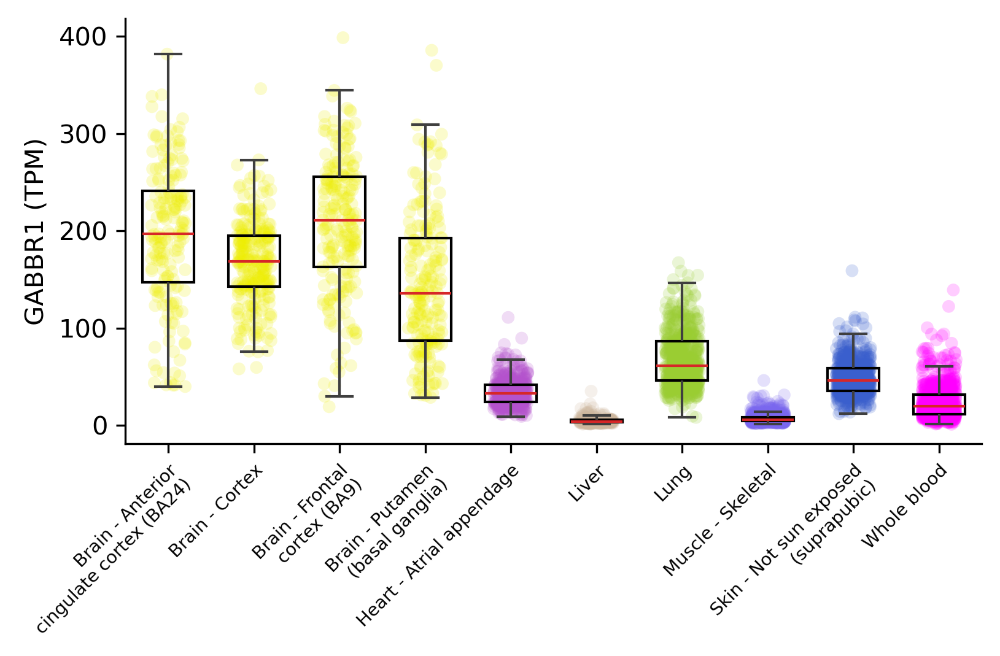

In [63]:
ten_tissues = ['Brain-Anteriorcingulatecortex_BA24',
 'Brain-Cortex',
 'Brain-FrontalCortex_BA9',
 'Brain-Putamen_basalganglia',
 'Heart-AtrialAppendage',
 'Liver',
 'Lung',
 'Muscle-Skeletal',
 'Skin-NotSunExposed_Suprapubic',
 'WholeBlood']

palette=['#EEEE00', '#EEEE00', '#EEEE00', '#EEEE00', '#B452CD', '#CDB79E', '#9ACD32', '#7A67EE', '#3A5FCD', '#FF00FF']

fig, ax = plt.subplots(figsize=(6, 3), dpi=300)

sns.stripplot(data = upf_df.loc[upf_df.tissue.isin(ten_tissues)].sort_values('tissue'), x = 'tissue', y='GABBR1', hue='tissue',
              palette=palette, alpha=0.2, rasterized=True, zorder=0, jitter=0.2)

sns.boxplot(data = upf_df.loc[upf_df.tissue.isin(ten_tissues)].sort_values('tissue'), x = 'tissue', y='GABBR1', 
#             palette=palette, 
            boxprops=dict(facecolor='none', edgecolor='black'), medianprops={'color': 'tab:red'},
            showfliers=False, width=.6, zorder=1)

ax.spines[['top', 'right']].set_visible(False)
ax.set_xlabel('')
# ax.set_yticks([])
ax.set_ylabel('GABBR1 (TPM)')
xrange = ax.get_xlim()

# ax.set_xscale("log")

ten_tissues_clean = ['Brain - Anterior\ncingulate cortex (BA24)',
 'Brain - Cortex',
 'Brain - Frontal\ncortex (BA9)',
 'Brain - Putamen\n(basal ganglia)',
 'Heart - Atrial appendage',
 'Liver',
 'Lung',
 'Muscle - Skeletal',
 'Skin - Not sun exposed\n(suprapubic)',
 'Whole blood']

ax.set_xticks(np.arange(10), ten_tissues_clean, rotation=45, ha='right', rotation_mode='anchor', size=7)

plt.savefig(f'plots/fig2_boxplots.png', dpi=300, bbox_inches='tight')
plt.savefig(f'plots/fig2_boxplots.pdf', dpi=300, bbox_inches='tight')
plt.savefig(f'plots/fig2_boxplots.svg', dpi=300, bbox_inches='tight')

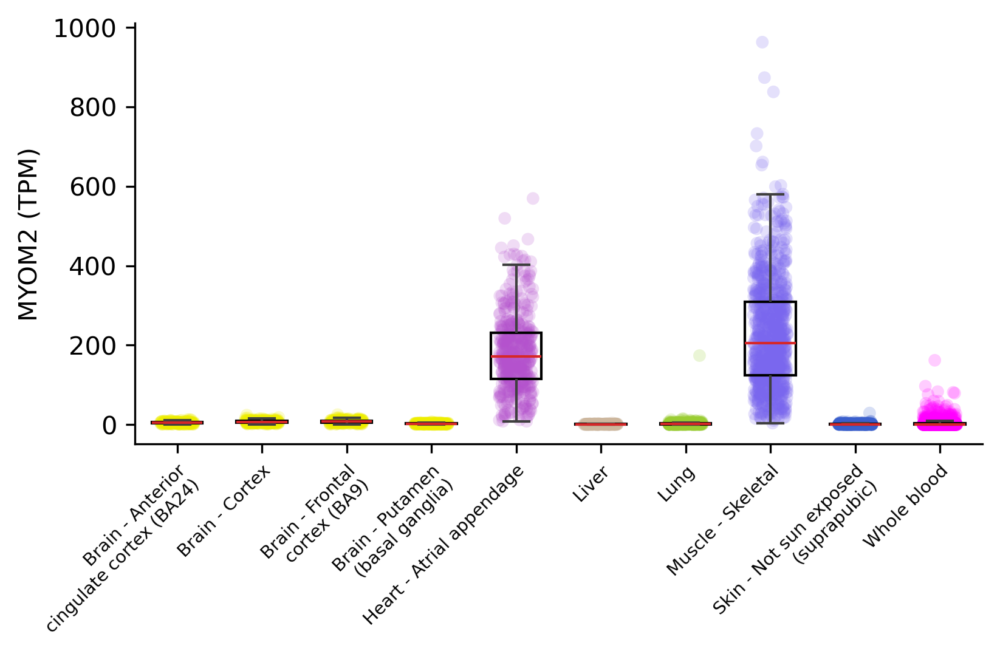

In [158]:
ten_tissues = ['Brain-Anteriorcingulatecortex_BA24',
 'Brain-Cortex',
 'Brain-FrontalCortex_BA9',
 'Brain-Putamen_basalganglia',
 'Heart-AtrialAppendage',
 'Liver',
 'Lung',
 'Muscle-Skeletal',
 'Skin-NotSunExposed_Suprapubic',
 'WholeBlood']

palette=['#EEEE00', '#EEEE00', '#EEEE00', '#EEEE00', '#B452CD', '#CDB79E', '#9ACD32', '#7A67EE', '#3A5FCD', '#FF00FF']

fig, ax = plt.subplots(figsize=(6, 3), dpi=300)

sns.stripplot(data = upf_df.loc[upf_df.tissue.isin(ten_tissues)].sort_values('tissue'), x = 'tissue', y='MYOM2', hue='tissue',
              palette=palette, alpha=0.2, rasterized=True, zorder=0, jitter=0.2)

sns.boxplot(data = upf_df.loc[upf_df.tissue.isin(ten_tissues)].sort_values('tissue'), x = 'tissue', y='MYOM2', 
#             palette=palette, 
            boxprops=dict(facecolor='none', edgecolor='black'), medianprops={'color': 'tab:red'},
            showfliers=False, width=.6, zorder=1)

ax.spines[['top', 'right']].set_visible(False)
ax.set_xlabel('')
# ax.set_yticks([])
ax.set_ylabel('MYOM2 (TPM)')
xrange = ax.get_xlim()

# ax.set_xscale("log")

ten_tissues_clean = ['Brain - Anterior\ncingulate cortex (BA24)',
 'Brain - Cortex',
 'Brain - Frontal\ncortex (BA9)',
 'Brain - Putamen\n(basal ganglia)',
 'Heart - Atrial appendage',
 'Liver',
 'Lung',
 'Muscle - Skeletal',
 'Skin - Not sun exposed\n(suprapubic)',
 'Whole blood']

ax.set_xticks(np.arange(10), ten_tissues_clean, rotation=45, ha='right', rotation_mode='anchor', size=7)


plt.savefig(f'plots/sup_fig7A.png', dpi=300, bbox_inches='tight')
plt.savefig(f'plots/sup_fig7A.pdf', dpi=300, bbox_inches='tight')
plt.savefig(f'plots/sup_fig7A.svg', dpi=300, bbox_inches='tight')

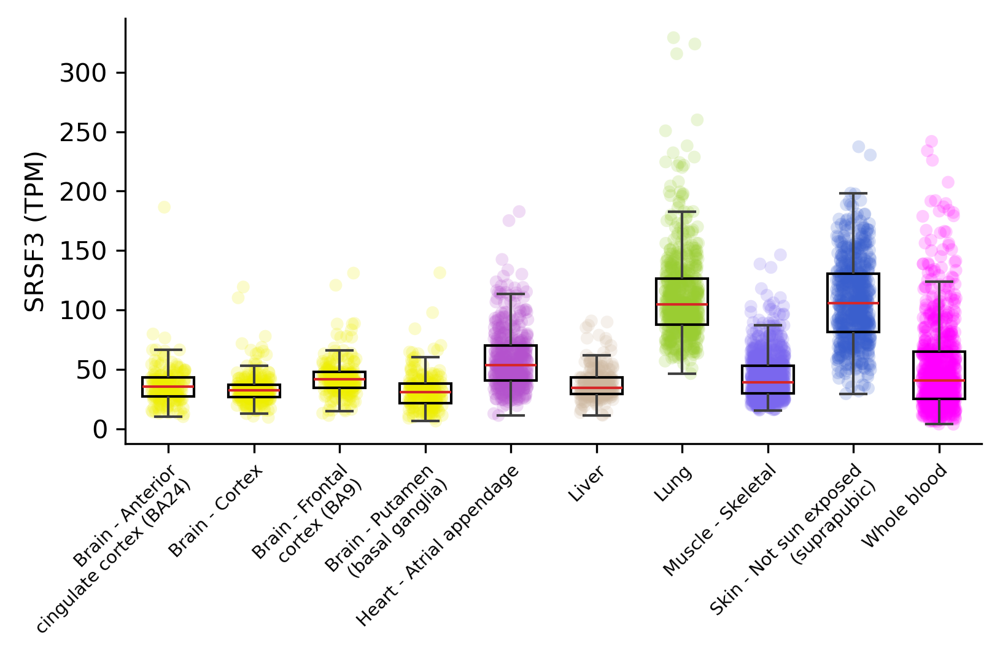

In [159]:
ten_tissues = ['Brain-Anteriorcingulatecortex_BA24',
 'Brain-Cortex',
 'Brain-FrontalCortex_BA9',
 'Brain-Putamen_basalganglia',
 'Heart-AtrialAppendage',
 'Liver',
 'Lung',
 'Muscle-Skeletal',
 'Skin-NotSunExposed_Suprapubic',
 'WholeBlood']

palette=['#EEEE00', '#EEEE00', '#EEEE00', '#EEEE00', '#B452CD', '#CDB79E', '#9ACD32', '#7A67EE', '#3A5FCD', '#FF00FF']

fig, ax = plt.subplots(figsize=(6, 3), dpi=300)

sns.stripplot(data = upf_df.loc[upf_df.tissue.isin(ten_tissues)].sort_values('tissue'), x = 'tissue', y='SRSF3', hue='tissue',
              palette=palette, alpha=0.2, rasterized=True, zorder=0, jitter=0.2)

sns.boxplot(data = upf_df.loc[upf_df.tissue.isin(ten_tissues)].sort_values('tissue'), x = 'tissue', y='SRSF3', 
#             palette=palette, 
            boxprops=dict(facecolor='none', edgecolor='black'), medianprops={'color': 'tab:red'},
            showfliers=False, width=.6, zorder=1)

ax.spines[['top', 'right']].set_visible(False)
ax.set_xlabel('')
# ax.set_yticks([])
ax.set_ylabel('SRSF3 (TPM)')
xrange = ax.get_xlim()

# ax.set_xscale("log")

ten_tissues_clean = ['Brain - Anterior\ncingulate cortex (BA24)',
 'Brain - Cortex',
 'Brain - Frontal\ncortex (BA9)',
 'Brain - Putamen\n(basal ganglia)',
 'Heart - Atrial appendage',
 'Liver',
 'Lung',
 'Muscle - Skeletal',
 'Skin - Not sun exposed\n(suprapubic)',
 'Whole blood']

ax.set_xticks(np.arange(10), ten_tissues_clean, rotation=45, ha='right', rotation_mode='anchor', size=7)

# plt.savefig(f'plots/fig2_boxplots.png', dpi=300, bbox_inches='tight')
# plt.savefig(f'plots/fig2_boxplots.pdf', dpi=300, bbox_inches='tight')
# plt.savefig(f'plots/fig2_boxplots.svg', dpi=300, bbox_inches='tight')

plt.savefig(f'plots/sup_fig7B.png', dpi=300, bbox_inches='tight')
plt.savefig(f'plots/sup_fig7B.pdf', dpi=300, bbox_inches='tight')
plt.savefig(f'plots/sup_fig7B.svg', dpi=300, bbox_inches='tight')

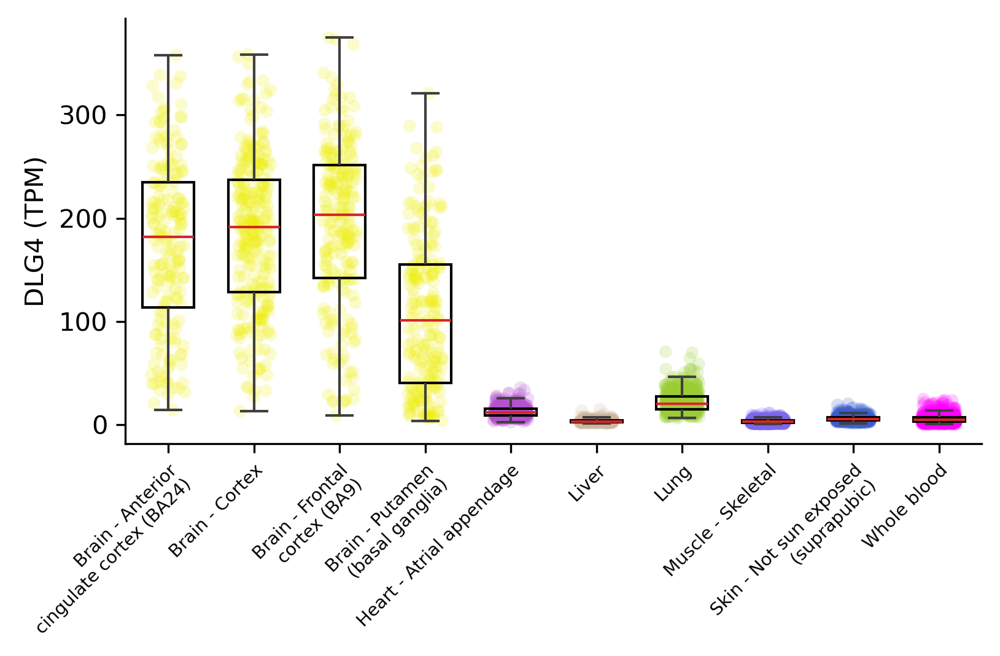

In [160]:
ten_tissues = ['Brain-Anteriorcingulatecortex_BA24',
 'Brain-Cortex',
 'Brain-FrontalCortex_BA9',
 'Brain-Putamen_basalganglia',
 'Heart-AtrialAppendage',
 'Liver',
 'Lung',
 'Muscle-Skeletal',
 'Skin-NotSunExposed_Suprapubic',
 'WholeBlood']

palette=['#EEEE00', '#EEEE00', '#EEEE00', '#EEEE00', '#B452CD', '#CDB79E', '#9ACD32', '#7A67EE', '#3A5FCD', '#FF00FF']

fig, ax = plt.subplots(figsize=(6, 3), dpi=300)

sns.stripplot(data = upf_df.loc[upf_df.tissue.isin(ten_tissues)].sort_values('tissue'), x = 'tissue', y='DLG4', hue='tissue',
              palette=palette, alpha=0.2, rasterized=True, zorder=0, jitter=0.2)

sns.boxplot(data = upf_df.loc[upf_df.tissue.isin(ten_tissues)].sort_values('tissue'), x = 'tissue', y='DLG4', 
#             palette=palette, 
            boxprops=dict(facecolor='none', edgecolor='black'), medianprops={'color': 'tab:red'},
            showfliers=False, width=.6, zorder=1)

ax.spines[['top', 'right']].set_visible(False)
ax.set_xlabel('')
# ax.set_yticks([])
ax.set_ylabel('DLG4 (TPM)')
xrange = ax.get_xlim()

# ax.set_xscale("log")

ten_tissues_clean = ['Brain - Anterior\ncingulate cortex (BA24)',
 'Brain - Cortex',
 'Brain - Frontal\ncortex (BA9)',
 'Brain - Putamen\n(basal ganglia)',
 'Heart - Atrial appendage',
 'Liver',
 'Lung',
 'Muscle - Skeletal',
 'Skin - Not sun exposed\n(suprapubic)',
 'Whole blood']

ax.set_xticks(np.arange(10), ten_tissues_clean, rotation=45, ha='right', rotation_mode='anchor', size=7)

# plt.savefig(f'plots/fig2_boxplots.png', dpi=300, bbox_inches='tight')
# plt.savefig(f'plots/fig2_boxplots.pdf', dpi=300, bbox_inches='tight')
# plt.savefig(f'plots/fig2_boxplots.svg', dpi=300, bbox_inches='tight')

plt.savefig(f'plots/sup_fig7C.png', dpi=300, bbox_inches='tight')
plt.savefig(f'plots/sup_fig7C.pdf', dpi=300, bbox_inches='tight')
plt.savefig(f'plots/sup_fig7C.svg', dpi=300, bbox_inches='tight')

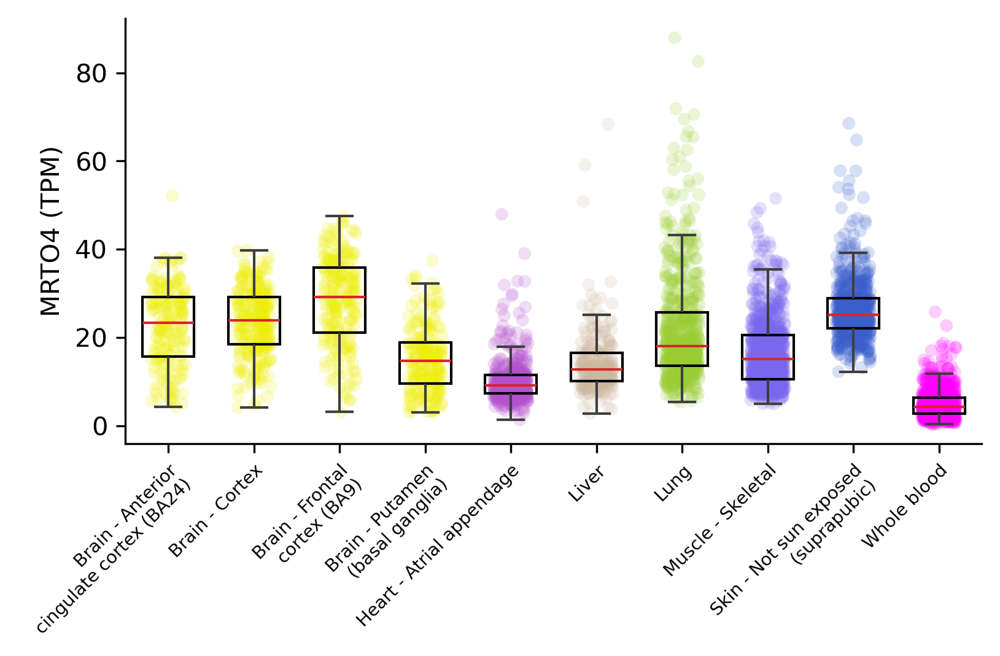

In [161]:
ten_tissues = ['Brain-Anteriorcingulatecortex_BA24',
 'Brain-Cortex',
 'Brain-FrontalCortex_BA9',
 'Brain-Putamen_basalganglia',
 'Heart-AtrialAppendage',
 'Liver',
 'Lung',
 'Muscle-Skeletal',
 'Skin-NotSunExposed_Suprapubic',
 'WholeBlood']

palette=['#EEEE00', '#EEEE00', '#EEEE00', '#EEEE00', '#B452CD', '#CDB79E', '#9ACD32', '#7A67EE', '#3A5FCD', '#FF00FF']

fig, ax = plt.subplots(figsize=(6, 3), dpi=300)

sns.stripplot(data = upf_df.loc[upf_df.tissue.isin(ten_tissues)].sort_values('tissue'), x = 'tissue', y='MRTO4', hue='tissue',
              palette=palette, alpha=0.2, rasterized=True, zorder=0, jitter=0.2)

sns.boxplot(data = upf_df.loc[upf_df.tissue.isin(ten_tissues)].sort_values('tissue'), x = 'tissue', y='MRTO4', 
#             palette=palette, 
            boxprops=dict(facecolor='none', edgecolor='black'), medianprops={'color': 'tab:red'},
            showfliers=False, width=.6, zorder=1)

ax.spines[['top', 'right']].set_visible(False)
ax.set_xlabel('')
# ax.set_yticks([])
ax.set_ylabel('MRTO4 (TPM)')
xrange = ax.get_xlim()

# ax.set_xscale("log")

ten_tissues_clean = ['Brain - Anterior\ncingulate cortex (BA24)',
 'Brain - Cortex',
 'Brain - Frontal\ncortex (BA9)',
 'Brain - Putamen\n(basal ganglia)',
 'Heart - Atrial appendage',
 'Liver',
 'Lung',
 'Muscle - Skeletal',
 'Skin - Not sun exposed\n(suprapubic)',
 'Whole blood']

ax.set_xticks(np.arange(10), ten_tissues_clean, rotation=45, ha='right', rotation_mode='anchor', size=7)

# plt.savefig(f'plots/fig2_boxplots.png', dpi=300, bbox_inches='tight')
# plt.savefig(f'plots/fig2_boxplots.pdf', dpi=300, bbox_inches='tight')
# plt.savefig(f'plots/fig2_boxplots.svg', dpi=300, bbox_inches='tight')

# plt.savefig(f'plots/sup_fig7C.png', dpi=300, bbox_inches='tight')
# plt.savefig(f'plots/sup_fig7C.pdf', dpi=300, bbox_inches='tight')
# plt.savefig(f'plots/sup_fig7C.svg', dpi=300, bbox_inches='tight')

In [8]:
os.listdir('/project/yangili1/cfbuenabadn/leafcutter2_paper/code/results/ds_v_dge_confounder')

['pairwise_comparisons.tab.gz',
 'inflection_points.tsv.gz',
 'tables',
 'deltaPSI_median_protein-coding.tsv.gz',
 'deltaPSI_median.tsv.gz',
 'rds_files']

In [4]:
# ds_dge = pd.read_csv('/project/yangili1/cfbuenabadn/leafcutter2_paper/code/results/ds_v_dge_pairwise_comparisons.tab.gz',
#                      sep='\t', index_col=0)

ds_dge = pd.read_csv('/project/yangili1/cfbuenabadn/leafcutter2_paper/code/results/ds_v_dge_confounder/pairwise_comparisons.tab.gz',
                     sep='\t', index_col=0)

In [8]:
ds_dge = ds_dge.loc[[x for x in ds_dge.index if "Bladder" not in x]]

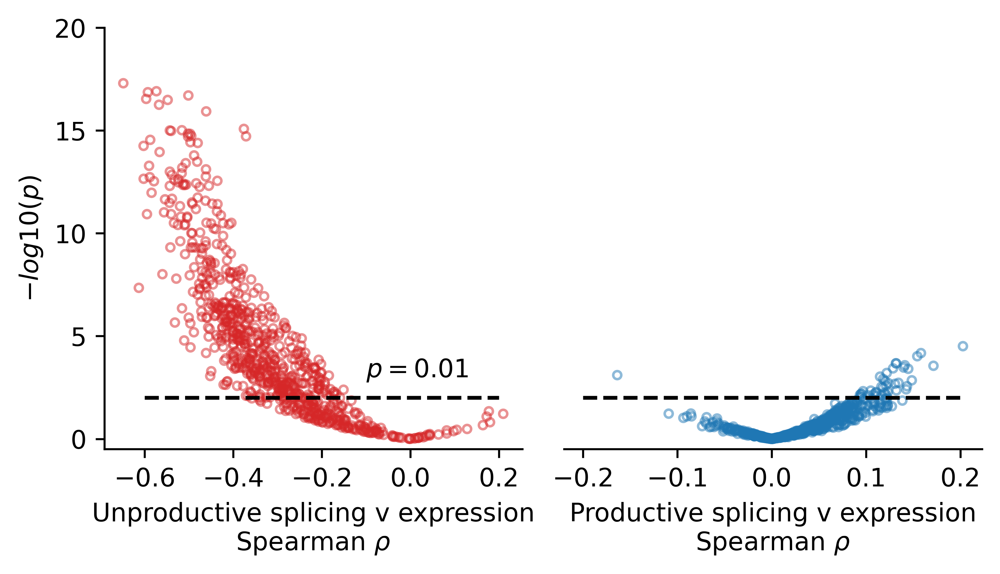

In [9]:
fig, ax = plt.subplots(ncols=2, figsize=(6.2, 3), gridspec_kw={'wspace':0.1}, dpi=600)
y = -np.log10(ds_dge.loc[ds_dge.n>=50].sort_values('spearman_pval').spearman_pval)[::-1]
x = ds_dge.loc[ds_dge.n>=50].sort_values('spearman_pval').spearman[::-1]
ax[0].scatter(x, y, edgecolor='tab:red', facecolor='none', s=10, alpha=0.5, rasterized=True)

x = [ds_dge.loc['Brain-Anteriorcingulatecortex_BA24_v_Cells-EBV-transformedlymphocytes', 'spearman']]
y = [-np.log10(ds_dge.loc['Brain-Anteriorcingulatecortex_BA24_v_Cells-EBV-transformedlymphocytes', 'spearman_pval'])]
# ax[0].scatter(x, y, edgecolor='black', facecolor='none', s=30, alpha=1, rasterized=True)

ax[0].plot([-0.6, 0.2], [2, 2], linestyle='--', c='black')
ax[0].text(-0.1, 3, r'$p=0.01$')
ax[0].set_xlabel('Unproductive splicing v expression\n' + r'Spearman $\rho$')
ax[0].set_ylabel(r'$-log10(p)$')
ax[0].set_ylim([-0.5, 20])
ax[0].spines[['top', 'right']].set_visible(False)

y = -np.log10(ds_dge.loc[ds_dge.n>=50].sort_values('spearman_pval_p').spearman_pval_p)[::-1]
x = ds_dge.loc[ds_dge.n>=50].sort_values('spearman_pval_p').spearman_p[::-1]
ax[1].scatter(x, y, edgecolor='tab:blue', facecolor='none', s=10, alpha=0.5, rasterized=True)
ax[1].plot([-0.2, 0.2], [2, 2], linestyle='--', c='black')
# ax[1].text(-0.1, 3.2, 'p=0.01')
ax[1].set_xlabel('Productive splicing v expression\n' + r'Spearman $\rho$')
# ax.set_ylabel(r'$-log10(p)$')
ax[1].set_ylim([-0.5, 20])
ax[1].set_yticks([])

x = [ds_dge.loc['Brain-Anteriorcingulatecortex_BA24_v_Cells-EBV-transformedlymphocytes', 'spearman_p']]
y = [-np.log10(ds_dge.loc['Brain-Anteriorcingulatecortex_BA24_v_Cells-EBV-transformedlymphocytes', 'spearman_pval_p'])]
# ax[1].scatter(x, y, edgecolor='black', facecolor='none', s=30, alpha=1, rasterized=True)

# ax[0].set_xlim([-0.65, 0.25])
# ax[1].set_xlim([-0.25, 0.65])

ax[1].spines[['top', 'right', 'left']].set_visible(False)
# ax[0].set_title('Unproductive splicing')
# ax[1].set_title('Productive splicing')

# ax[0].set_xlim((-0.7, 0.25))
# ax[1].set_xlim((-0.25, 0.7))
# plt.savefig('plots/fig2C.png', dpi=600, bbox_inches='tight')
# plt.savefig('plots/fig2C.pdf', dpi=600, bbox_inches='tight')
# plt.savefig('plots/fig2C.svg', dpi=600, bbox_inches='tight')

plt.savefig('plots/fig2C_corrected.png', dpi=600, bbox_inches='tight')
plt.savefig('plots/fig2C_corrected.pdf', dpi=600, bbox_inches='tight')
plt.savefig('plots/fig2C_corrected.svg', dpi=600, bbox_inches='tight')

In [10]:
np.mean(ds_dge.loc[ds_dge.n>=50].spearman < 0)

np.float64(0.9686274509803922)

In [11]:
from scipy.stats import false_discovery_control
false_discovery_control(ds_dge.spearman_pval)

array([2.55380261e-02, 8.54078451e-01, 5.37396942e-01, ...,
       3.65593762e-01, 8.03331214e-14, 9.53545721e-08])

In [12]:
ds_dge['FDR'] = false_discovery_control(ds_dge.spearman_pval)
ds_dge['FDR_p'] = false_discovery_control(ds_dge.spearman_pval_p)

In [13]:
np.mean(ds_dge.loc[ds_dge.FDR <= 0.1].spearman < 0 )

np.float64(0.9902506963788301)

In [25]:
np.mean(ds_dge.loc[(ds_dge.FDR <= 0.1) & (ds_dge.n >= 50)].spearman < 0)

np.float64(0.9968503937007874)

In [77]:
np.mean(ds_dge.loc[ds_dge.FDR <= 0.1].spearman < 0 )

tissue_comparison
Pancreas_v_Heart-LeftVentricle                                   0.202752
Pituitary_v_Muscle-Skeletal                                      0.131979
Artery-Coronary_v_Muscle-Skeletal                                0.144784
Brain-Cortex_v_Heart-AtrialAppendage                             0.139932
Kidney-Cortex_v_Muscle-Skeletal                                  0.119957
Cells-Culturedfibroblasts_v_Brain-Cerebellum                     0.141101
Muscle-Skeletal_v_Brain-Hippocampus                              0.128680
Brain-CerebellarHemisphere_v_Brain-Amygdala                     -0.163707
Brain-Cortex_v_MinorSalivaryGland                                0.121944
Pancreas_v_Heart-AtrialAppendage                                 0.171509
Heart-AtrialAppendage_v_Brain-Cerebellum                         0.131699
Ovary_v_Muscle-Skeletal                                          0.158260
AdrenalGland_v_Muscle-Skeletal                                   0.154330
Esophagus-Mucosa_v_P

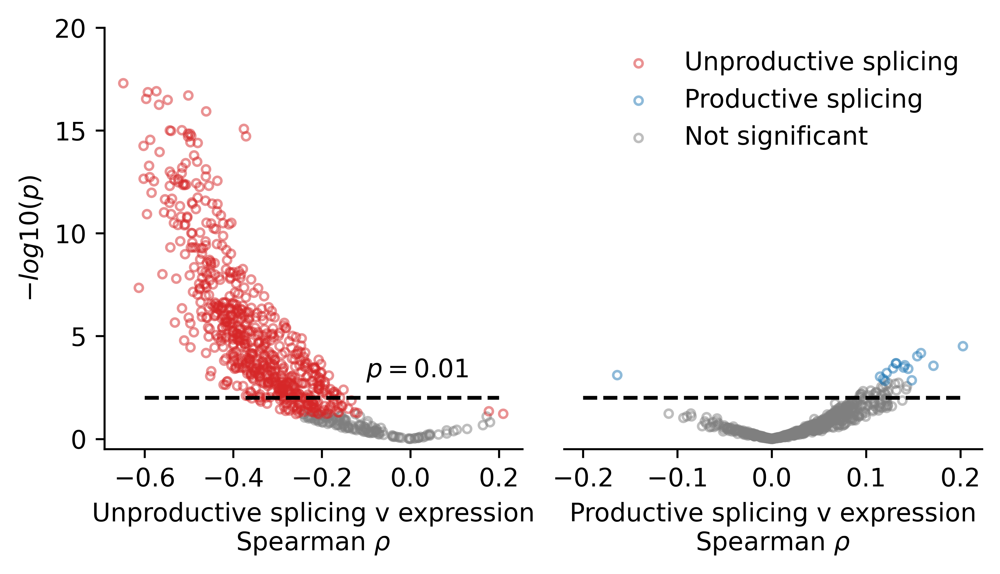

In [17]:
fig, ax = plt.subplots(ncols=2, figsize=(6.2, 3), gridspec_kw={'wspace':0.1}, dpi=600)


y = -np.log10(ds_dge.loc[(ds_dge.n>=50) & (ds_dge.FDR > 0.1)].sort_values('spearman_pval').spearman_pval)[::-1]
x = ds_dge.loc[(ds_dge.n>=50) & (ds_dge.FDR > 0.1)].sort_values('spearman_pval').spearman[::-1]
ax[0].scatter(x, y, edgecolor='tab:gray', facecolor='none', s=10, alpha=0.5, rasterized=True, label='Not significant')




y = -np.log10(ds_dge.loc[(ds_dge.n>=50) & (ds_dge.FDR <= 0.1)].sort_values('spearman_pval').spearman_pval)[::-1]
x = ds_dge.loc[(ds_dge.n>=50) & (ds_dge.FDR <= 0.1)].sort_values('spearman_pval').spearman[::-1]
ax[0].scatter(x, y, edgecolor='tab:red', facecolor='none', s=10, alpha=0.5, rasterized=True, label='Unproductive splicing')









x = [ds_dge.loc['Brain-Anteriorcingulatecortex_BA24_v_Cells-EBV-transformedlymphocytes', 'spearman']]
y = [-np.log10(ds_dge.loc['Brain-Anteriorcingulatecortex_BA24_v_Cells-EBV-transformedlymphocytes', 'spearman_pval'])]
# ax[0].scatter(x, y, edgecolor='black', facecolor='none', s=30, alpha=1, rasterized=True)

ax[0].plot([-0.6, 0.2], [2, 2], linestyle='--', c='black')
ax[0].text(-0.1, 3, r'$p=0.01$')
ax[0].set_xlabel('Unproductive splicing v expression\n' + r'Spearman $\rho$')
ax[0].set_ylabel(r'$-log10(p)$')
ax[0].set_ylim([-0.5, 20])
ax[0].spines[['top', 'right']].set_visible(False)

y = -np.log10(ds_dge.loc[(ds_dge.n>=50)& (ds_dge.FDR_p > 0.1)].sort_values('spearman_pval_p').spearman_pval_p)[::-1]
x = ds_dge.loc[(ds_dge.n>=50) & (ds_dge.FDR_p > 0.1)].sort_values('spearman_pval_p').spearman_p[::-1]
ax[1].scatter(x, y, edgecolor='tab:gray', facecolor='none', s=10, alpha=0.5, rasterized=True)



y = -np.log10(ds_dge.loc[(ds_dge.n>=50)& (ds_dge.FDR_p <= 0.1)].sort_values('spearman_pval_p').spearman_pval_p)[::-1]
x = ds_dge.loc[(ds_dge.n>=50) & (ds_dge.FDR_p <= 0.1)].sort_values('spearman_pval_p').spearman_p[::-1]
ax[1].scatter([0], [-50], edgecolor='tab:red', facecolor='none', s=10, alpha=0.5, rasterized=True, label='Unproductive splicing')

ax[1].scatter(x, y, edgecolor='tab:blue', facecolor='none', s=10, alpha=0.5, rasterized=True, label='Productive splicing')
ax[1].scatter([0], [-50], edgecolor='tab:gray', facecolor='none', s=10, alpha=0.5, rasterized=True, label='Not significant')




# y = -np.log10(ds_dge.loc[(ds_dge.n>=50) & (ds_dge.FDR > 0.1)].sort_values('spearman_pval').spearman_pval)[::-1]
# x = ds_dge.loc[(ds_dge.n>=50) & (ds_dge.FDR > 0.1)].sort_values('spearman_pval').spearman[::-1]
# ax[0].scatter(x, y, edgecolor='tab:gray', facecolor='none', s=10, alpha=0.5, rasterized=True)




# y = -np.log10(ds_dge.loc[(ds_dge.n>=50) & (ds_dge.FDR <= 0.1)].sort_values('spearman_pval').spearman_pval)[::-1]
# x = ds_dge.loc[(ds_dge.n>=50) & (ds_dge.FDR <= 0.1)].sort_values('spearman_pval').spearman[::-1]
# ax[0].scatter(x, y, edgecolor='tab:red', facecolor='none', s=10, alpha=0.5, rasterized=True)







ax[1].plot([-0.2, 0.2], [2, 2], linestyle='--', c='black')
# ax[1].text(-0.1, 3.2, 'p=0.01')
ax[1].set_xlabel('Productive splicing v expression\n' + r'Spearman $\rho$')
# ax.set_ylabel(r'$-log10(p)$')



ax[1].set_ylim([-0.5, 20])
ax[1].set_yticks([])

x = [ds_dge.loc['Brain-Anteriorcingulatecortex_BA24_v_Cells-EBV-transformedlymphocytes', 'spearman_p']]
y = [-np.log10(ds_dge.loc['Brain-Anteriorcingulatecortex_BA24_v_Cells-EBV-transformedlymphocytes', 'spearman_pval_p'])]
# ax[1].scatter(x, y, edgecolor='black', facecolor='none', s=30, alpha=1, rasterized=True)

# ax[0].set_xlim([-0.65, 0.25])
# ax[1].set_xlim([-0.25, 0.65])

ax[1].spines[['top', 'right', 'left']].set_visible(False)
# ax[0].set_title('Unproductive splicing')
# ax[1].set_title('Productive splicing')

# ax[0].legend(frameon=False)



ax[1].legend(frameon=False)

plt.savefig('plots/fig2C.png', dpi=600, bbox_inches='tight')
plt.savefig('plots/fig2C.pdf', dpi=600, bbox_inches='tight')
plt.savefig('plots/fig2C.svg', dpi=600, bbox_inches='tight')

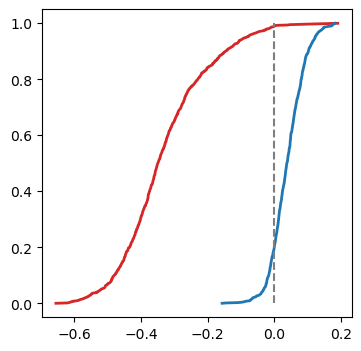

In [697]:
def cdf(y, ax, c='black', linewidth=1, alpha=1):
    x = np.linspace(0, 1, len(y))
    ax.plot(sorted(np.array(y)), x, linewidth=linewidth, alpha=alpha, c=c)
    
    
fig, ax = plt.subplots(figsize=(4, 4))

# y = ds_dge.loc[ds_dge.n>=100].spearman
# cdf(y, ax, c='tab:red', linewidth=3, alpha=1)
y = ds_dge.loc[(ds_dge.n>=50)].spearman
cdf(y, ax, c='tab:red', linewidth=2, alpha=1)
# y = ds_dge.loc[(ds_dge.n<50) & (ds_dge.n>=10)].spearman
# cdf(y, ax, c='tab:red', linewidth=1, alpha=1)



# y = ds_dge.loc[ds_dge.n>=100].spearman_p
# cdf(y, ax, c='tab:blue', linewidth=3, alpha=1)
y = ds_dge.loc[(ds_dge.n>=50)].spearman_p
cdf(y, ax, c='tab:blue', linewidth=2, alpha=1)
# y = ds_dge.loc[(ds_dge.n<50) & (ds_dge.n>=10)].spearman_p
# cdf(y, ax, c='tab:blue', linewidth=1, alpha=1)

ax.plot([0, 0], [0, 1], c='tab:gray', linestyle='--')

# x = ds_dge.loc[ds_dge.n>=200].spearman
# ax.scatter(x, y, edgecolor='none', facecolor='tab:red', alpha=0.2)


# # fig, ax = plt.subplots(figsize=(3, 5))
# y = -np.log10(ds_dge.loc[ds_dge.n>=200].spearman_pval_p)
# x = ds_dge.loc[ds_dge.n>=200].spearman_p
# ax.scatter(x, y, edgecolor='none', facecolor='tab:blue', alpha=0.02)

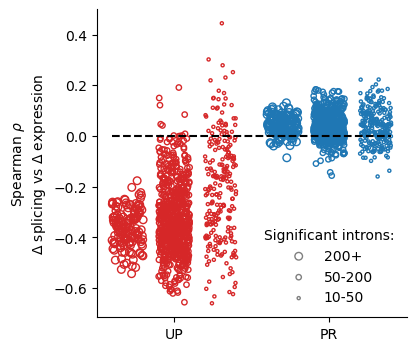

In [680]:
y_list = []
sig_list = []
col_list = []
pos = 0
fig, ax = plt.subplots(figsize=(4, 4))

y = ds_dge.loc[ds_dge.n>=200].spearman
y_list.extend(list(y))
sig_list.extend(['n100']*len(y))
col_list.extend(['UP']*len(y))

x = np.linspace(0, 1, len(y)) + pos
plt.scatter(x, y, s=30, edgecolor='tab:red', facecolor='none')

y = ds_dge.loc[(ds_dge.n<200) & (ds_dge.n>=50)].spearman
y_list.extend(list(y))
sig_list.extend(['n50']*len(y))
col_list.extend(['UP']*len(y))
pos += 1.5
x = np.linspace(0, 1, len(y)) + pos
plt.scatter(x, y, s=15, edgecolor='tab:red', facecolor='none')


y = ds_dge.loc[(ds_dge.n<50) & (ds_dge.n>=20)].spearman
y_list.extend(list(y))
sig_list.extend(['n10']*len(y))
col_list.extend(['UP']*len(y))
pos += 1.5
x = np.linspace(0, 1, len(y)) + pos
plt.scatter(x, y, s=5, edgecolor='tab:red', facecolor='none')



y = ds_dge.loc[ds_dge.n>=200].spearman_p
y_list.extend(list(y))
sig_list.extend(['n100']*len(y))
col_list.extend(['PR']*len(y))
pos += 2
x = np.linspace(0, 1, len(y)) + pos
plt.scatter(x, y, s=30, edgecolor='tab:blue', facecolor='none')

y = ds_dge.loc[(ds_dge.n<200) & (ds_dge.n>=50)].spearman_p
y_list.extend(list(y))
sig_list.extend(['n50']*len(y))
col_list.extend(['PR']*len(y))
pos += 1.5
x = np.linspace(0, 1, len(y)) + pos
plt.scatter(x, y, s=15, edgecolor='tab:blue', facecolor='none')

y = ds_dge.loc[(ds_dge.n<50) & (ds_dge.n>=20)].spearman_p
y_list.extend(list(y))
sig_list.extend(['n10']*len(y))
col_list.extend(['PR']*len(y))
pos += 1.5
x = np.linspace(0, 1, len(y)) + pos
plt.scatter(x, y, s=5, edgecolor='tab:blue', facecolor='none')

cor_df = pd.DataFrame()
cor_df['spearman'] = y_list
cor_df['n'] = sig_list
cor_df['itype'] = col_list

ax.plot([0, 9], [0, 0], linestyle='--', c='black')
ax.set_xticks([2, 7], ['UP', 'PR'])
ax.set_ylabel(r'Spearman $\rho$' + '\n' + r'$\Delta$ splicing vs $\Delta$ expression')
ax.scatter([-20], [0], s=30, edgecolor='tab:gray', facecolor='none', label='200+')
ax.scatter([-20], [0], s=15, edgecolor='tab:gray', facecolor='none', label='50-200')
ax.scatter([-20], [0], s=5, edgecolor='tab:gray', facecolor='none', label='10-50')

ax.set_xlim([-0.5, 9.5])
ax.spines[['top', 'right']].set_visible(False)
ax.legend(frameon=False, title='Significant introns:')
# ax.text(0, 0.45, 'N samples:', fontsize=8)
# ax.text(0, 0.35, '200', fontsize=8)
# ax.text(1.5, 0.35, '50', fontsize=8)

In [599]:
cor_map = np.zeros((49,49))
pval_map = np.zeros((49,49))
n_map = np.zeros((49, 49))
tissues = sorted(set([x.split('_v_')[0] for x in ds_dge.index]))
for i, tissue_1 in enumerate(tissues):
    for j, tissue_2 in enumerate(tissues):
        if tissue1 == tissue2:
            cor_map[i][i] = np.nan
            pval_map[i][i] = np.nan
            n_map[i][i] = 0
        
        else:
            key1 = tissue_1 + '_v_' + tissue_2
            key2 = tissue_2 + '_v_' + tissue_1
            if key1 in ds_dge.index:
                row = ds_dge.loc[key1]
                spear = row.spearman
                spear_p = row.spearman_p
                spear_pval = row.spearman_pval
                spear_p_pval = row.spearman_pval_p
                n = row.n
                n_p = row.n_p
            elif key1 in ds_dge.index:
                row = ds_dge.loc[key2]
                spear = row.spearman
                spear_p = row.spearman_p
                spear_pval = row.spearman_pval
                spear_p_pval = row.spearman_pval_p
                n = row.n
                n_p = row.n_p
            else:
                spear = np.nan
                spear_p = np.nan
                spear_pval = np.nan
                spear_p_pval = np.nan
                n = 0
                n_p = 0
                
                
            if tissue_1 > tissue_2:
                cor_map[i][j] = spear
                cor_map[j][i] = spear_p
                
                pval_map[i][j] = spear_pval
                pval_map[j][i] = spear_p_pval
                
                n_map[i][j] = n
                n_map[j][i] = n_p
                
            else:
                cor_map[j][i] = spear
                cor_map[i][j] = spear_p
                
                pval_map[j][i] = spear_pval
                pval_map[i][j] = spear_p_pval
                
                n_map[j][i] = n
                n_map[i][j] = n_p
                
        
            

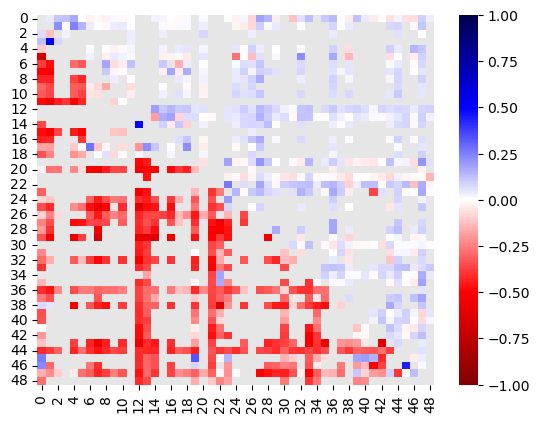

In [614]:
ax = sns.heatmap(cor_map, cmap='seismic_r', vmin=-1, vmax=1, mask=n_map < 10)
ax.collections[0].cmap.set_bad('0.9')

,0,1,12,13,19,21,32,36,38,43,44,46,47
0,0.0,23.0,0.0,0.0,0.0,0.0,224.0,318.0,193.0,159.0,1017.0,149.0,149.0
1,3.0,0.0,0.0,0.0,0.0,0.0,209.0,259.0,152.0,110.0,990.0,132.0,129.0
12,0.0,0.0,0.0,0.0,769.0,0.0,827.0,802.0,680.0,694.0,1330.0,742.0,719.0
13,0.0,0.0,0.0,0.0,599.0,906.0,655.0,639.0,516.0,555.0,1160.0,586.0,585.0
19,0.0,0.0,194.0,120.0,0.0,0.0,138.0,252.0,114.0,92.0,967.0,121.0,119.0
21,0.0,0.0,0.0,197.0,0.0,0.0,543.0,477.0,623.0,480.0,1101.0,636.0,538.0
23,17.0,0.0,161.0,98.0,13.0,97.0,151.0,180.0,104.0,0.0,908.0,168.0,107.0
32,19.0,17.0,197.0,128.0,15.0,99.0,0.0,148.0,137.0,106.0,1013.0,0.0,103.0
36,35.0,31.0,184.0,140.0,34.0,104.0,23.0,0.0,0.0,0.0,0.0,0.0,257.0
38,33.0,23.0,178.0,102.0,13.0,169.0,17.0,0.0,0.0,61.0,859.0,0.0,81.0


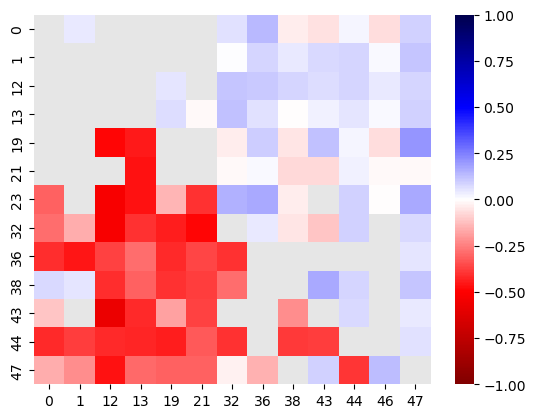

In [743]:
ax = sns.heatmap(pd.DataFrame(cor_map).iloc[((n_map < 10).mean(axis=1) <= 0.5), ((n_map < 10).mean(axis=0) <= 0.5)], cmap='seismic_r', vmin=-1, vmax=1, mask=pd.DataFrame(n_map).iloc[((n_map < 10).mean(axis=1) <= 0.5), ((n_map < 10).mean(axis=0) <= 0.5)] < 10)
ax.collections[0].cmap.set_bad('0.9')

pd.DataFrame(n_map).iloc[((n_map < 10).mean(axis=1) <= 0.5), ((n_map < 10).mean(axis=0) <= 0.5)]

In [616]:
cor_map = np.zeros((49,49))
pval_map = np.zeros((49,49))
n_map = np.zeros((49, 49))
tissues = sorted(set([x.split('_v_')[0] for x in ds_dge.index]))
for i, tissue_1 in enumerate(tissues):
    for j, tissue_2 in enumerate(tissues):
        if tissue1 == tissue2:
            cor_map[i][i] = np.nan
            pval_map[i][i] = np.nan
            n_map[i][i] = 0
        
        else:
            key1 = tissue_1 + '_v_' + tissue_2
            key2 = tissue_2 + '_v_' + tissue_1
            if key1 in ds_dge.index:
                row = ds_dge.loc[key1]
                spear = row.spearman
                spear_p = row.spearman_p
                spear_pval = row.spearman_pval
                spear_p_pval = row.spearman_pval_p
                n = row.n
                n_p = row.n_p
            elif key1 in ds_dge.index:
                row = ds_dge.loc[key2]
                spear = row.spearman
                spear_p = row.spearman_p
                spear_pval = row.spearman_pval
                spear_p_pval = row.spearman_pval_p
                n = row.n
                n_p = row.n_p
            else:
                spear = np.nan
                spear_p = np.nan
                spear_pval = np.nan
                spear_p_pval = np.nan
                n = 0
                n_p = 0
                
                
            if tissue_1 > tissue_2:
                cor_map[i][j] = spear
                cor_map[j][i] = spear_p
                
                pval_map[i][j] = spear_pval
                pval_map[j][i] = spear_p_pval
                
                n_map[i][j] = n
                n_map[j][i] = n_p
                
            else:
                cor_map[j][i] = spear
                cor_map[i][j] = spear_p
                
                pval_map[j][i] = spear_pval
                pval_map[i][j] = spear_p_pval
                
                n_map[j][i] = n
                n_map[i][j] = n_p
                
        
            

['Adipose-Subcutaneous',
 'Adipose-Visceral_Omentum',
 'AdrenalGland',
 'Artery-Aorta',
 'Artery-Coronary',
 'Bladder',
 'Brain-Amygdala',
 'Brain-Anteriorcingulatecortex_BA24',
 'Brain-Caudate_basalganglia',
 'Brain-CerebellarHemisphere',
 'Brain-Cerebellum',
 'Brain-Cortex',
 'Brain-FrontalCortex_BA9',
 'Brain-Hippocampus',
 'Brain-Hypothalamus',
 'Brain-Nucleusaccumbens_basalganglia',
 'Brain-Putamen_basalganglia',
 'Brain-Spinalcord_cervicalc-1',
 'Brain-Substantianigra',
 'Breast-MammaryTissue',
 'Cells-Culturedfibroblasts',
 'Cells-EBV-transformedlymphocytes',
 'Colon-Sigmoid',
 'Colon-Transverse',
 'Esophagus-GastroesophagealJunction',
 'Esophagus-Mucosa',
 'Esophagus-Muscularis',
 'Heart-AtrialAppendage',
 'Heart-LeftVentricle',
 'Kidney-Cortex',
 'Liver',
 'Lung',
 'MinorSalivaryGland',
 'Muscle-Skeletal',
 'Nerve-Tibial',
 'Ovary',
 'Pancreas',
 'Pituitary',
 'Prostate',
 'Skin-NotSunExposed_Suprapubic',
 'Skin-SunExposed_Lowerleg',
 'SmallIntestine-TerminalIleum',
 'Spleen',

In [29]:
ds_dge.loc[(ds_dge.spearman <= -0.4) & (ds_dge.n > 200)].sort_values('spearman_pval')

,slope,slope_pval,spearman,spearman_pval,pearson,pearson_pval,n,slope_p,slope_pval_p,spearman_p,spearman_pval_p,pearson_p,pearson_pval_p,n_p
tissue_comparison,,,,,,,,,,,,,,
Brain-FrontalCortex_BA9_v_Cells-EBV-transformedlymphocytes,-0.966175,6.003892e-24,-0.501194,1.966001e-17,-0.527744,1.795852e-19,252,0.003417,0.966670,0.035251,0.245549,-0.007112,0.814828,1087
Brain-Amygdala_v_Cells-EBV-transformedlymphocytes,-0.549589,2.005013e-27,-0.547811,3.244449e-17,-0.348248,3.800335e-07,202,-0.009304,0.904654,0.038819,0.228046,-0.016957,0.598610,966
Brain-Cortex_v_Testis,-0.156806,3.155609e-06,-0.460909,1.169291e-16,-0.142292,1.530668e-02,290,0.119942,0.126203,0.059029,0.065139,0.054530,0.088468,977
SmallIntestine-TerminalIleum_v_Brain-FrontalCortex_BA9,-0.905931,3.470430e-21,-0.515828,9.632674e-16,-0.467820,7.155651e-13,211,-0.022912,0.771437,0.000830,0.981209,-0.020954,0.552252,807
Brain-Anteriorcingulatecortex_BA24_v_WholeBlood,-0.873641,4.742691e-15,-0.501990,1.423794e-15,-0.456182,8.271274e-13,222,-0.059912,0.193656,0.033776,0.328201,-0.035808,0.299916,840
Testis_v_Brain-Anteriorcingulatecortex_BA24,-0.766571,8.451727e-18,-0.497030,1.446280e-15,-0.451087,8.882820e-13,227,0.029124,0.760227,0.014542,0.674961,0.027667,0.424899,834
Brain-Anteriorcingulatecortex_BA24_v_Cells-EBV-transformedlymphocytes,-1.078193,6.627729e-26,-0.494520,1.827131e-15,-0.534497,3.028634e-18,228,-0.131815,0.154352,0.002235,0.943037,-0.045155,0.148556,1025
Brain-Caudate_basalganglia_v_Cells-EBV-transformedlymphocytes,-0.763750,2.170930e-40,-0.501786,1.970810e-15,-0.214593,1.363890e-03,220,-0.096046,0.294586,-0.020109,0.535881,-0.037414,0.249293,950
Brain-Nucleusaccumbens_basalganglia_v_Cells-EBV-transformedlymphocytes,-0.823780,2.674621e-19,-0.496512,3.702932e-15,-0.442910,4.928709e-12,221,-0.059227,0.523040,-0.012212,0.703328,-0.027746,0.386800,975


In [30]:
[x for x in ds_dge.loc[(ds_dge.spearman <= -0.3) & (ds_dge.n > 100)].sort_values('spearman_pval').index if 'Brain' not in x]

['Muscle-Skeletal_v_Cells-EBV-transformedlymphocytes',
 'Heart-AtrialAppendage_v_Cells-EBV-transformedlymphocytes',
 'Kidney-Cortex_v_Cells-EBV-transformedlymphocytes',
 'Heart-LeftVentricle_v_Cells-EBV-transformedlymphocytes',
 'Spleen_v_Muscle-Skeletal',
 'WholeBlood_v_Muscle-Skeletal',
 'Heart-AtrialAppendage_v_WholeBlood',
 'Stomach_v_Muscle-Skeletal',
 'WholeBlood_v_Artery-Tibial',
 'Liver_v_Cells-EBV-transformedlymphocytes',
 'Cells-Culturedfibroblasts_v_Muscle-Skeletal',
 'Cells-EBV-transformedlymphocytes_v_Artery-Tibial',
 'Muscle-Skeletal_v_Liver',
 'Testis_v_MinorSalivaryGland',
 'Kidney-Cortex_v_Muscle-Skeletal',
 'Testis_v_Kidney-Cortex',
 'Vagina_v_Muscle-Skeletal',
 'SmallIntestine-TerminalIleum_v_Muscle-Skeletal',
 'Muscle-Skeletal_v_Colon-Transverse',
 'Prostate_v_Cells-EBV-transformedlymphocytes',
 'Esophagus-GastroesophagealJunction_v_Cells-EBV-transformedlymphocytes',
 'Pituitary_v_Cells-EBV-transformedlymphocytes',
 'Muscle-Skeletal_v_Skin-NotSunExposed_Suprapubic',

In [31]:
ds_dge.loc['WholeBlood_v_Muscle-Skeletal'].

slope             -7.802096e-01
slope_pval         1.395287e-09
spearman          -3.936265e-01
spearman_pval      1.145635e-08
pearson           -3.824387e-01
pearson_pval       3.172759e-08
n                  1.960000e+02
slope_p            1.737492e-01
slope_pval_p       1.082132e-01
spearman_p         9.077795e-02
spearman_pval_p    1.532049e-02
pearson_p          4.025149e-02
pearson_pval_p     2.831155e-01
n_p                7.130000e+02
Name: WholeBlood_v_Muscle-Skeletal, dtype: float64

In [49]:
os.listdir('/project/yangili1/cfbuenabadn/leafcutter2_paper/code/results/ds_v_dge_confounder/')

['pairwise_comparisons.tab.gz',
 'inflection_points.tsv.gz',
 'tables',
 'deltaPSI_median_protein-coding.tsv.gz',
 'deltaPSI_median.tsv.gz',
 'rds_files']

In [14]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import rpy2.robjects as ro
import os
from rpy2.robjects import pandas2ri
import gzip
from scipy.stats import spearmanr, pearsonr
import statsmodels.api as sm
from statsmodels.regression.linear_model import OLS
#from tqdm import tqdm

# pairwise_comparisons = os.listdir('/project/yangili1/cfbuenabadn/leafcutter2_paper/code/results/ds_v_dge/')
pairwise_comparisons = os.listdir('/project/yangili1/cfbuenabadn/leafcutter2_paper/code/results/ds_v_dge_confounder/rds_files/')

import numpy as np
from scipy.stats import rankdata


def process_comparison(rds_file):
    a_v_b = rds_file.split('.rds')[0]
    readRDS = ro.r['readRDS']
    # rds = readRDS(f'/project/yangili1/cfbuenabadn/leafcutter2_paper/code/results/ds_v_dge/{rds_file}')
    rds = readRDS(f'/project/yangili1/cfbuenabadn/leafcutter2_paper/code/results/ds_v_dge_confounder/rds_files/{rds_file}')
    ds = rds[0]
    with (ro.default_converter + pandas2ri.converter).context():
        pd_from_r_df = ro.conversion.get_conversion().rpy2py(ds)
        output = pd_from_r_df
        
    dge = rds[1]
    with (ro.default_converter + pandas2ri.converter).context():
        pd_from_r_df = ro.conversion.get_conversion().rpy2py(dge)
        dge = pd_from_r_df
        
    intron_list = []
    cluster_list = []
    median_count_list = []
    
    with gzip.open(
        f'/project/yangili1/cfbuenabadn/leafcutter2_paper/code/results/ds/GTEx/{a_v_b}/ds_perind_numers.counts.noise_by_intron.lf1.gz'
    ) as fh:
        fh.readline()
        for line in fh:
            line = line.decode().rstrip().split(' ')
            intron_list.append(line[0])
            cluster_list.append(line[0].split(':')[0] + ':' + line[0].split(':')[-1])
            median_counts = int(np.median([int(y) for y in line[1:]]))
            median_count_list.append(median_counts)
    
    intron_median_counts = pd.DataFrame()
    intron_median_counts['intron'] = intron_list
    intron_median_counts['cluster'] = cluster_list
    intron_median_counts['median_counts'] = median_count_list
    
    ds = pd.merge(output, intron_median_counts, right_on=['intron', 'cluster'], left_on=['intron', 'cluster'])
    
    cluster_counts = pd.DataFrame(ds.groupby('cluster').median_counts.sum()).reset_index()
    cluster_counts.columns = ['cluster', 'cluster_counts']

    ds = pd.merge(ds, cluster_counts, right_on='cluster', left_on='cluster')

    dfCluster_max = pd.DataFrame(ds.groupby('gene_id').cluster_counts.max()).reset_index()
    dfCluster_max.columns = ['gene_id', 'max_cluster_counts']

    ds = pd.merge(ds, dfCluster_max, left_on='gene_id', right_on='gene_id')
    ds['cluster_fraction'] = ds.cluster_counts/ds.max_cluster_counts
    
    
    ds_sig_p = ds.loc[(ds.itype=='PR') & (ds.ctype=='PR') & (ds['p.adjust'] <= 1e-2) & (ds.deltapsi.abs() >= 0.1) & (ds.cluster_counts >= 10) & (ds.cluster_fraction >= 0.1)]

    ds_sig_p = pd.merge(ds_sig_p, dge.loc[(dge.padj <= 1e-2) & (dge.log2FoldChange.abs() >= 1)], 
                      left_on='gene_id', right_on = 'gene_id').drop_duplicates()

    ds_sig_p = ds_sig_p.groupby('gene_id')[['logef', 'log2FoldChange']].median()
    
    
    ds_sig = ds.loc[(ds.itype=='UP') & (ds.ctype=='PR,UP') & (ds['p.adjust'] <= 1e-2) & (ds.deltapsi.abs() >= 0.1) & (ds.cluster_counts >= 10) & (ds.cluster_fraction >= 0.1)]

    ds_sig = pd.merge(ds_sig, dge.loc[(dge.padj <= 1e-2) & (dge.log2FoldChange.abs() >= 1)], 
                      left_on='gene_id', right_on = 'gene_id').drop_duplicates()

    ds_sig = ds_sig.groupby('gene_id')[['logef', 'log2FoldChange']].median()


    return ds_sig, ds_sig_p

In [15]:
ds_sig, ds_sig_p = process_comparison('Muscle-Skeletal_v_Brain-FrontalCortex_BA9.rds')
rds_file = 'Muscle-Skeletal_v_Brain-FrontalCortex_BA9.rds'
a_v_b = rds_file.split('.rds')[0]
readRDS = ro.r['readRDS']
rds = readRDS(f'/project/yangili1/cfbuenabadn/leafcutter2_paper/code/results/ds_v_dge_confounder/rds_files/{rds_file}')

ds = rds[0]
with (ro.default_converter + pandas2ri.converter).context():
    pd_from_r_df = ro.conversion.get_conversion().rpy2py(ds)
    output = pd_from_r_df

dge = rds[1]
with (ro.default_converter + pandas2ri.converter).context():
    pd_from_r_df = ro.conversion.get_conversion().rpy2py(dge)
    dge = pd_from_r_df

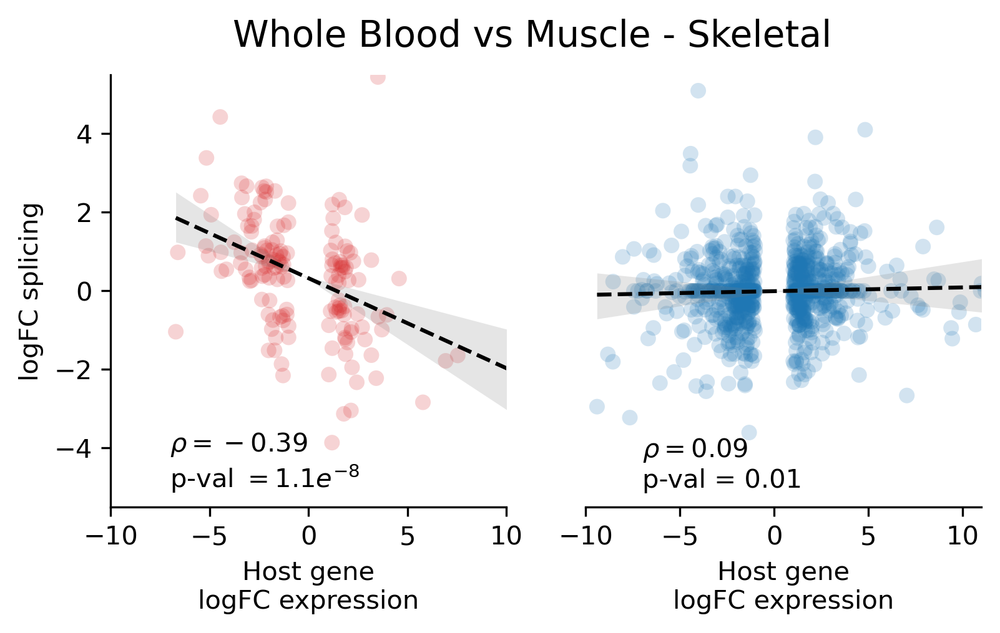

In [13]:
rho_list = []
for i in range(100):
    idx = np.random.choice(np.arange(156), 30, replace=False)
    
    Y = np.array(list(ds_sig.logef))[idx]
    X = np.array(list(ds_sig.log2FoldChange))[idx]
    X = sm.add_constant(X)

    
    model = sm.RLM(Y,X)
    results = model.fit()

    slope = results.params[1]
    const = results.params[0]

    rho_list.append(slope)

fig, ax = plt.subplots(ncols = 2, figsize=(6, 3), dpi=300)

ax[0].scatter(ds_sig.log2FoldChange, ds_sig.logef, facecolor='tab:red', edgecolor='none', alpha=0.2, rasterized=True)



Y = ds_sig['logef']
X = ds_sig['log2FoldChange']
X = sm.add_constant(X)

model = sm.RLM(Y,X)
results = model.fit()

slope = results.params.loc['log2FoldChange']
const = results.params.loc['const']


# slope = pearsonr(list(ds_sig.logef), list(ds_sig.log2FoldChange))[0]
# intercept = np.mean(list(ds_sig.log2FoldChange))
slope_90 = np.quantile(rho_list, 0.9)
slope_10 = np.quantile(rho_list, 0.1)

# Plot confidence intervals (optional)

mean_X = np.mean(X.log2FoldChange)




x = np.linspace(np.min(X.log2FoldChange)-mean_X, np.max(X.log2FoldChange)-mean_X, 100) 

ax[0].plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


ax[0].fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
                (slope_10 * x) + const+ (slope*mean_X), 
                 color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)



# mean_X = np.mean(X.log2FoldChange)

# x = np.linspace(np.min(ds_sig.log2FoldChange)-mean_X, np.max(ds_sig.log2FoldChange)-mean_X, 100) 

# ax[0].plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


# ax[0].fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
#                 (slope_10 * x) + const+ (slope*mean_X), 
#                  color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)





# x = np.linspace(-7.5, 8.5, 100)

# ax[0].plot(x, slope * x + 0, color='black', linestyle='--')


# ax[0].fill_between(x,( slope_90 * np.array(x)) + 0, 
#                 (slope_10 * x) + 0, 
#                  color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)

ax[0].set_ylim([-5.5, 5.5])
ax[0].set_xlim([-10, 10])
ax[0].spines[['top', 'right']].set_visible(False)

# ax.set_xlim([-3.5, 3.5])

# ax.set_ylim([-1.8, 1.8])
ax[0].text(-7, -5, r'$\rho = -0.39$' + '\np-val $= 1.1e^{-8}$')

ax[0].set_ylabel('logFC splicing')
ax[0].set_xlabel('Host gene\nlogFC expression')




####################

rho_list = []
for i in range(100):
    idx = np.random.choice(np.arange(ds_sig_p.shape[0]), 30, replace=False)
    
    Y = np.array(list(ds_sig_p.logef))[idx]
    X = np.array(list(ds_sig_p.log2FoldChange))[idx]
    X = sm.add_constant(X)

    
    model = sm.RLM(Y,X)
    results = model.fit()

    slope = results.params[1]
    const = results.params[0]

    rho_list.append(slope)


ax[1].scatter(ds_sig_p.log2FoldChange, ds_sig_p.logef, facecolor='tab:blue', edgecolor='none', alpha=0.2, rasterized=True)



Y = ds_sig_p['logef']
X = ds_sig_p['log2FoldChange']
X = sm.add_constant(X)

model = sm.RLM(Y,X)
results = model.fit()

slope = results.params.loc['log2FoldChange']
const = results.params.loc['const']


# slope = pearsonr(list(ds_sig.logef), list(ds_sig.log2FoldChange))[0]
# intercept = np.mean(list(ds_sig.log2FoldChange))
slope_90 = np.quantile(rho_list, 0.9)
slope_10 = np.quantile(rho_list, 0.1)

# Plot confidence intervals (optional)


mean_X = np.mean(X.log2FoldChange)




x = np.linspace(np.min(X.log2FoldChange)-mean_X, np.max(X.log2FoldChange)-mean_X, 100) 

ax[1].plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


ax[1].fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
                (slope_10 * x) + const+ (slope*mean_X), 
                 color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)



# x = np.linspace(np.min(ds_sig.log2FoldChange)-mean_X, np.max(ds_sig.log2FoldChange)-mean_X, 100) 

# ax[1].plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


# ax[1].fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
#                 (slope_10 * x) + const+ (slope*mean_X), 
#                  color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)



# x = np.linspace(-7.5, 8.5, 100)

# ax[1].plot(x, slope * x + 0, color='black', linestyle='--')


# ax[1].fill_between(x,( slope_90 * np.array(x)) + 0, 
#                 (slope_10 * x) + 0, 
#                  color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)

ax[1].set_ylim([-5.5, 5.5])
ax[1].set_xlim([-10, 11])
ax[1].spines[['top', 'right', 'left']].set_visible(False)

fig.suptitle('Whole Blood vs Muscle - Skeletal', fontsize=14)

# ax.set_xlim([-3.5, 3.5])

# ax.set_ylim([-1.8, 1.8])
ax[1].text(-7, -5, r'$\rho = 0.09$' + '\np-val = 0.01')

# ax[1].set_ylabel('logFC splicing')
ax[1].set_yticks([])
ax[1].set_xlabel('Host gene\nlogFC expression')


plt.savefig('plots/fig2B_corrected3.png', dpi=300, bbox_inches='tight')
plt.savefig('plots/fig2B_corrected3.pdf', dpi=300, bbox_inches='tight')
plt.savefig('plots/fig2B_corrected3.svg', dpi=300, bbox_inches='tight')

In [91]:
ds_sig, ds_sig_p = process_comparison('Brain-Cortex_v_Testis.rds')
rds_file = 'Brain-Cortex_v_Testis.rds'
a_v_b = rds_file.split('.rds')[0]
readRDS = ro.r['readRDS']
rds = readRDS(f'/project/yangili1/cfbuenabadn/leafcutter2_paper/code/results/ds_v_dge_confounder/rds_files/{rds_file}')

ds = rds[0]
with (ro.default_converter + pandas2ri.converter).context():
    pd_from_r_df = ro.conversion.get_conversion().rpy2py(ds)
    output = pd_from_r_df

dge = rds[1]
with (ro.default_converter + pandas2ri.converter).context():
    pd_from_r_df = ro.conversion.get_conversion().rpy2py(dge)
    dge = pd_from_r_df

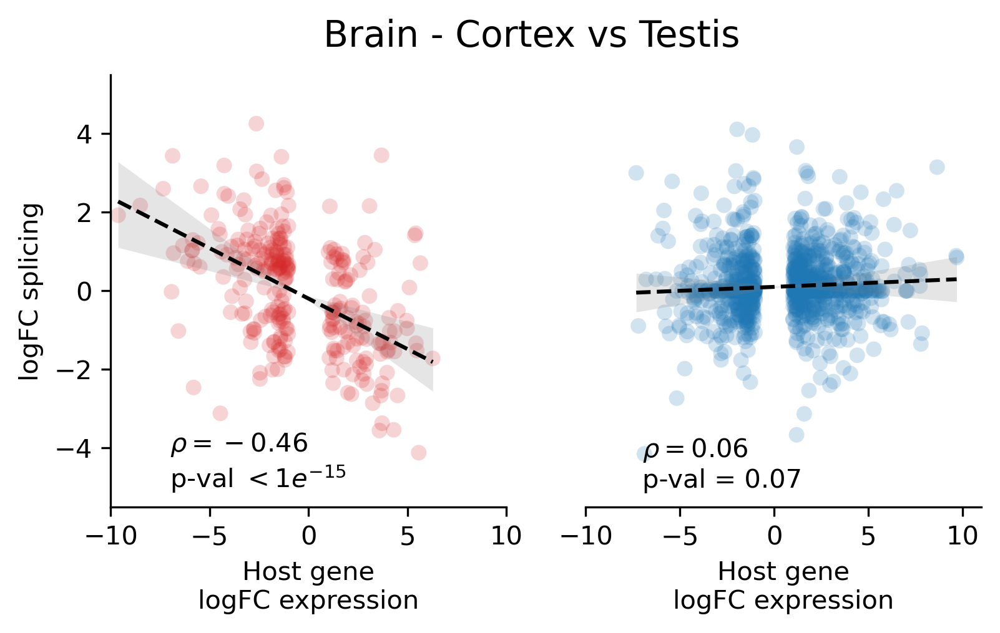

In [92]:
rho_list = []
for i in range(100):
    idx = np.random.choice(np.arange(290), 30, replace=False)
    
    Y = np.array(list(ds_sig.logef))[idx]
    X = np.array(list(ds_sig.log2FoldChange))[idx]
    X = sm.add_constant(X)

    
    model = sm.RLM(Y,X)
    results = model.fit()

    slope = results.params[1]
    const = results.params[0]

    rho_list.append(slope)

fig, ax = plt.subplots(ncols = 2, figsize=(6, 3), dpi=300)

ax[0].scatter(ds_sig.log2FoldChange, ds_sig.logef, facecolor='tab:red', edgecolor='none', alpha=0.2, rasterized=True)



Y = ds_sig['logef']
X = ds_sig['log2FoldChange']
X = sm.add_constant(X)

model = sm.RLM(Y,X)
results = model.fit()

slope = results.params.loc['log2FoldChange']
const = results.params.loc['const']


# slope = pearsonr(list(ds_sig.logef), list(ds_sig.log2FoldChange))[0]
# intercept = np.mean(list(ds_sig.log2FoldChange))
slope_90 = np.quantile(rho_list, 0.9)
slope_10 = np.quantile(rho_list, 0.1)

# Plot confidence intervals (optional)

mean_X = np.mean(X.log2FoldChange)




x = np.linspace(np.min(X.log2FoldChange)-mean_X, np.max(X.log2FoldChange)-mean_X, 100) 

ax[0].plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


ax[0].fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
                (slope_10 * x) + const+ (slope*mean_X), 
                 color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)



# mean_X = np.mean(X.log2FoldChange)

# x = np.linspace(np.min(ds_sig.log2FoldChange)-mean_X, np.max(ds_sig.log2FoldChange)-mean_X, 100) 

# ax[0].plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


# ax[0].fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
#                 (slope_10 * x) + const+ (slope*mean_X), 
#                  color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)





# x = np.linspace(-7.5, 8.5, 100)

# ax[0].plot(x, slope * x + 0, color='black', linestyle='--')


# ax[0].fill_between(x,( slope_90 * np.array(x)) + 0, 
#                 (slope_10 * x) + 0, 
#                  color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)

ax[0].set_ylim([-5.5, 5.5])
ax[0].set_xlim([-10, 10])
ax[0].spines[['top', 'right']].set_visible(False)

# ax.set_xlim([-3.5, 3.5])

# ax.set_ylim([-1.8, 1.8])
ax[0].text(-7, -5, r'$\rho = -0.46$' + '\np-val $< 1e^{-15}$')

ax[0].set_ylabel('logFC splicing')
ax[0].set_xlabel('Host gene\nlogFC expression')




####################

rho_list = []
for i in range(100):
    idx = np.random.choice(np.arange(ds_sig_p.shape[0]), 30, replace=False)
    
    Y = np.array(list(ds_sig_p.logef))[idx]
    X = np.array(list(ds_sig_p.log2FoldChange))[idx]
    X = sm.add_constant(X)

    
    model = sm.RLM(Y,X)
    results = model.fit()

    slope = results.params[1]
    const = results.params[0]

    rho_list.append(slope)


ax[1].scatter(ds_sig_p.log2FoldChange, ds_sig_p.logef, facecolor='tab:blue', edgecolor='none', alpha=0.2, rasterized=True)



Y = ds_sig_p['logef']
X = ds_sig_p['log2FoldChange']
X = sm.add_constant(X)

model = sm.RLM(Y,X)
results = model.fit()

slope = results.params.loc['log2FoldChange']
const = results.params.loc['const']


# slope = pearsonr(list(ds_sig.logef), list(ds_sig.log2FoldChange))[0]
# intercept = np.mean(list(ds_sig.log2FoldChange))
slope_90 = np.quantile(rho_list, 0.9)
slope_10 = np.quantile(rho_list, 0.1)

# Plot confidence intervals (optional)


mean_X = np.mean(X.log2FoldChange)




x = np.linspace(np.min(X.log2FoldChange)-mean_X, np.max(X.log2FoldChange)-mean_X, 100) 

ax[1].plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


ax[1].fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
                (slope_10 * x) + const+ (slope*mean_X), 
                 color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)



# x = np.linspace(np.min(ds_sig.log2FoldChange)-mean_X, np.max(ds_sig.log2FoldChange)-mean_X, 100) 

# ax[1].plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


# ax[1].fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
#                 (slope_10 * x) + const+ (slope*mean_X), 
#                  color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)



# x = np.linspace(-7.5, 8.5, 100)

# ax[1].plot(x, slope * x + 0, color='black', linestyle='--')


# ax[1].fill_between(x,( slope_90 * np.array(x)) + 0, 
#                 (slope_10 * x) + 0, 
#                  color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)

ax[1].set_ylim([-5.5, 5.5])
ax[1].set_xlim([-10, 11])
ax[1].spines[['top', 'right', 'left']].set_visible(False)

# ax.set_xlim([-3.5, 3.5])

# ax.set_ylim([-1.8, 1.8])
ax[1].text(-7, -5, r'$\rho = 0.06$' + '\np-val = 0.07')

# 0.059029	0.065139	

# ax[1].set_ylabel('logFC splicing')
ax[1].set_yticks([])
ax[1].set_xlabel('Host gene\nlogFC expression')

fig.suptitle('Brain - Cortex vs Testis', fontsize=14)



plt.savefig('plots/fig2B_corrected2.png', dpi=300, bbox_inches='tight')
plt.savefig('plots/fig2B_corrected2.pdf', dpi=300, bbox_inches='tight')
plt.savefig('plots/fig2B_corrected2.svg', dpi=300, bbox_inches='tight')

In [93]:
ds_sig, ds_sig_p = process_comparison('Brain-FrontalCortex_BA9_v_Cells-EBV-transformedlymphocytes.rds')
rds_file = 'Brain-FrontalCortex_BA9_v_Cells-EBV-transformedlymphocytes.rds'
a_v_b = rds_file.split('.rds')[0]
readRDS = ro.r['readRDS']
rds = readRDS(f'/project/yangili1/cfbuenabadn/leafcutter2_paper/code/results/ds_v_dge_confounder/rds_files/{rds_file}')

ds = rds[0]
with (ro.default_converter + pandas2ri.converter).context():
    pd_from_r_df = ro.conversion.get_conversion().rpy2py(ds)
    output = pd_from_r_df

dge = rds[1]
with (ro.default_converter + pandas2ri.converter).context():
    pd_from_r_df = ro.conversion.get_conversion().rpy2py(dge)
    dge = pd_from_r_df

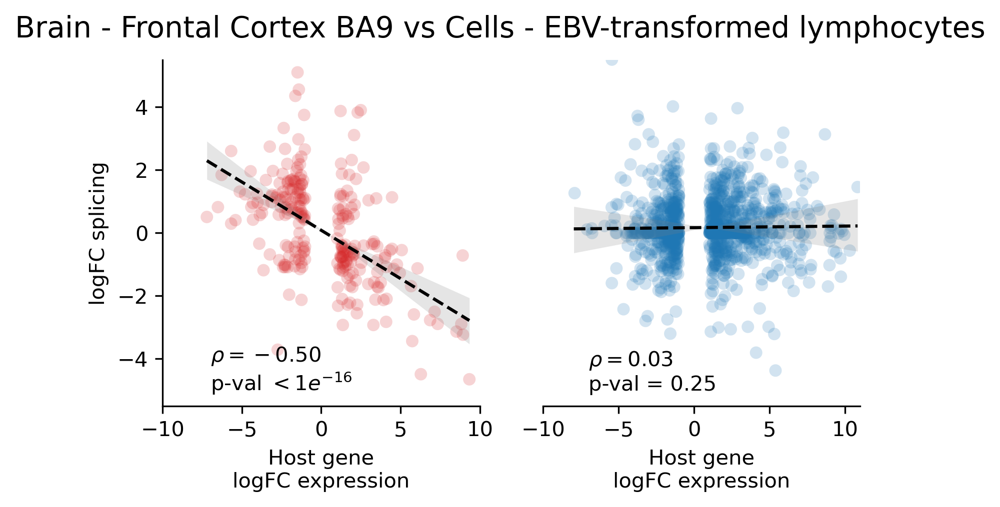

In [94]:
rho_list = []
for i in range(100):
    idx = np.random.choice(np.arange(202), 30, replace=False)
    
    Y = np.array(list(ds_sig.logef))[idx]
    X = np.array(list(ds_sig.log2FoldChange))[idx]
    X = sm.add_constant(X)

    
    model = sm.RLM(Y,X)
    results = model.fit()

    slope = results.params[1]
    const = results.params[0]

    rho_list.append(slope)

fig, ax = plt.subplots(ncols = 2, figsize=(6, 3), dpi=300)

ax[0].scatter(ds_sig.log2FoldChange, ds_sig.logef, facecolor='tab:red', edgecolor='none', alpha=0.2, rasterized=True)



Y = ds_sig['logef']
X = ds_sig['log2FoldChange']
X = sm.add_constant(X)

model = sm.RLM(Y,X)
results = model.fit()

slope = results.params.loc['log2FoldChange']
const = results.params.loc['const']


# slope = pearsonr(list(ds_sig.logef), list(ds_sig.log2FoldChange))[0]
# intercept = np.mean(list(ds_sig.log2FoldChange))
slope_90 = np.quantile(rho_list, 0.9)
slope_10 = np.quantile(rho_list, 0.1)

# Plot confidence intervals (optional)

mean_X = np.mean(X.log2FoldChange)




x = np.linspace(np.min(X.log2FoldChange)-mean_X, np.max(X.log2FoldChange)-mean_X, 100) 

ax[0].plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


ax[0].fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
                (slope_10 * x) + const+ (slope*mean_X), 
                 color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)



# mean_X = np.mean(X.log2FoldChange)

# x = np.linspace(np.min(ds_sig.log2FoldChange)-mean_X, np.max(ds_sig.log2FoldChange)-mean_X, 100) 

# ax[0].plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


# ax[0].fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
#                 (slope_10 * x) + const+ (slope*mean_X), 
#                  color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)





# x = np.linspace(-7.5, 8.5, 100)

# ax[0].plot(x, slope * x + 0, color='black', linestyle='--')


# ax[0].fill_between(x,( slope_90 * np.array(x)) + 0, 
#                 (slope_10 * x) + 0, 
#                  color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)

ax[0].set_ylim([-5.5, 5.5])
ax[0].set_xlim([-10, 10])
ax[0].spines[['top', 'right']].set_visible(False)

# ax.set_xlim([-3.5, 3.5])

# ax.set_ylim([-1.8, 1.8])
ax[0].text(-7, -5, r'$\rho = -0.50$' + '\np-val $< 1e^{-16}$')

ax[0].set_ylabel('logFC splicing')
ax[0].set_xlabel('Host gene\nlogFC expression')




####################

rho_list = []
for i in range(100):
    idx = np.random.choice(np.arange(ds_sig_p.shape[0]), 30, replace=False)
    
    Y = np.array(list(ds_sig_p.logef))[idx]
    X = np.array(list(ds_sig_p.log2FoldChange))[idx]
    X = sm.add_constant(X)

    
    model = sm.RLM(Y,X)
    results = model.fit()

    slope = results.params[1]
    const = results.params[0]

    rho_list.append(slope)


ax[1].scatter(ds_sig_p.log2FoldChange, ds_sig_p.logef, facecolor='tab:blue', edgecolor='none', alpha=0.2, rasterized=True)



Y = ds_sig_p['logef']
X = ds_sig_p['log2FoldChange']
X = sm.add_constant(X)

model = sm.RLM(Y,X)
results = model.fit()

slope = results.params.loc['log2FoldChange']
const = results.params.loc['const']


# slope = pearsonr(list(ds_sig.logef), list(ds_sig.log2FoldChange))[0]
# intercept = np.mean(list(ds_sig.log2FoldChange))
slope_90 = np.quantile(rho_list, 0.9)
slope_10 = np.quantile(rho_list, 0.1)

# Plot confidence intervals (optional)


mean_X = np.mean(X.log2FoldChange)




x = np.linspace(np.min(X.log2FoldChange)-mean_X, np.max(X.log2FoldChange)-mean_X, 100) 

ax[1].plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


ax[1].fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
                (slope_10 * x) + const+ (slope*mean_X), 
                 color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)



# x = np.linspace(np.min(ds_sig.log2FoldChange)-mean_X, np.max(ds_sig.log2FoldChange)-mean_X, 100) 

# ax[1].plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


# ax[1].fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
#                 (slope_10 * x) + const+ (slope*mean_X), 
#                  color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)



# x = np.linspace(-7.5, 8.5, 100)

# ax[1].plot(x, slope * x + 0, color='black', linestyle='--')


# ax[1].fill_between(x,( slope_90 * np.array(x)) + 0, 
#                 (slope_10 * x) + 0, 
#                  color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)

ax[1].set_ylim([-5.5, 5.5])
ax[1].set_xlim([-10, 11])
ax[1].spines[['top', 'right', 'left']].set_visible(False)

# ax.set_xlim([-3.5, 3.5])

# ax.set_ylim([-1.8, 1.8])
ax[1].text(-7, -5, r'$\rho = 0.03$' + '\np-val = 0.25')
# 0.035251	0.245549

# ax[1].set_ylabel('logFC splicing')
ax[1].set_yticks([])
ax[1].set_xlabel('Host gene\nlogFC expression')

fig.suptitle('Brain - Frontal Cortex BA9 vs Cells - EBV-transformed lymphocytes', fontsize=14)



plt.savefig('plots/fig2B_corrected.png', dpi=300, bbox_inches='tight')
plt.savefig('plots/fig2B_corrected.pdf', dpi=300, bbox_inches='tight')
plt.savefig('plots/fig2B_corrected.svg', dpi=300, bbox_inches='tight')

In [140]:
ds_sig, ds_sig_p = process_comparison('Ovary_v_WholeBlood.rds')
rds_file = 'Ovary_v_WholeBlood.rds'
a_v_b = rds_file.split('.rds')[0]
readRDS = ro.r['readRDS']
rds = readRDS(f'/project/yangili1/cfbuenabadn/leafcutter2_paper/code/results/ds_v_dge_confounder/rds_files/{rds_file}')

ds = rds[0]
with (ro.default_converter + pandas2ri.converter).context():
    pd_from_r_df = ro.conversion.get_conversion().rpy2py(ds)
    output = pd_from_r_df

dge = rds[1]
with (ro.default_converter + pandas2ri.converter).context():
    pd_from_r_df = ro.conversion.get_conversion().rpy2py(dge)
    dge = pd_from_r_df

In [141]:
spearmanr(ds_sig_p.log2FoldChange, ds_sig_p.logef)

SignificanceResult(statistic=np.float64(0.015516350645005597), pvalue=np.float64(0.7049356590374687))

In [142]:
spearmanr(ds_sig.log2FoldChange, ds_sig.logef)

SignificanceResult(statistic=np.float64(-0.18055808833797446), pvalue=np.float64(0.025035018247024154))

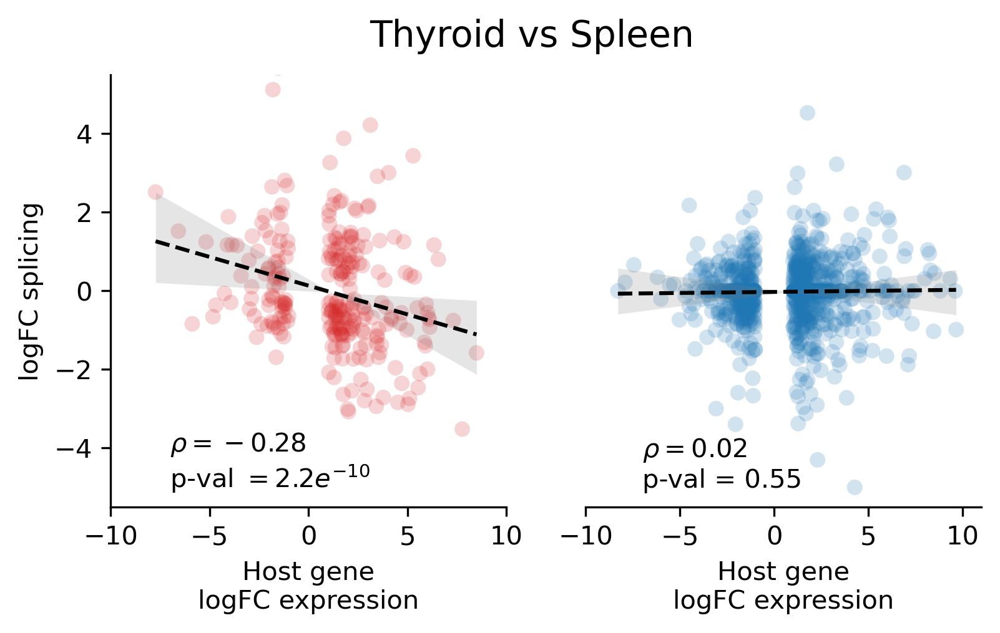

In [124]:
rho_list = []
for i in range(100):
    idx = np.random.choice(np.arange(250), 30, replace=False)
    
    Y = np.array(list(ds_sig.logef))[idx]
    X = np.array(list(ds_sig.log2FoldChange))[idx]
    X = sm.add_constant(X)

    
    model = sm.RLM(Y,X)
    results = model.fit()

    slope = results.params[1]
    const = results.params[0]

    rho_list.append(slope)

fig, ax = plt.subplots(ncols = 2, figsize=(6, 3), dpi=300)

ax[0].scatter(ds_sig.log2FoldChange, ds_sig.logef, facecolor='tab:red', edgecolor='none', alpha=0.2, rasterized=True)



Y = ds_sig['logef']
X = ds_sig['log2FoldChange']
X = sm.add_constant(X)

model = sm.RLM(Y,X)
results = model.fit()

slope = results.params.loc['log2FoldChange']
const = results.params.loc['const']


# slope = pearsonr(list(ds_sig.logef), list(ds_sig.log2FoldChange))[0]
# intercept = np.mean(list(ds_sig.log2FoldChange))
slope_90 = np.quantile(rho_list, 0.9)
slope_10 = np.quantile(rho_list, 0.1)

# Plot confidence intervals (optional)

mean_X = np.mean(X.log2FoldChange)




x = np.linspace(np.min(X.log2FoldChange)-mean_X, np.max(X.log2FoldChange)-mean_X, 100) 

ax[0].plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


ax[0].fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
                (slope_10 * x) + const+ (slope*mean_X), 
                 color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)



# mean_X = np.mean(X.log2FoldChange)

# x = np.linspace(np.min(ds_sig.log2FoldChange)-mean_X, np.max(ds_sig.log2FoldChange)-mean_X, 100) 

# ax[0].plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


# ax[0].fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
#                 (slope_10 * x) + const+ (slope*mean_X), 
#                  color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)





# x = np.linspace(-7.5, 8.5, 100)

# ax[0].plot(x, slope * x + 0, color='black', linestyle='--')


# ax[0].fill_between(x,( slope_90 * np.array(x)) + 0, 
#                 (slope_10 * x) + 0, 
#                  color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)

ax[0].set_ylim([-5.5, 5.5])
ax[0].set_xlim([-10, 10])
ax[0].spines[['top', 'right']].set_visible(False)

# ax.set_xlim([-3.5, 3.5])

# ax.set_ylim([-1.8, 1.8])
ax[0].text(-7, -5, r'$\rho = -0.28$' + '\np-val $= 2.2e^{-10}$')

ax[0].set_ylabel('logFC splicing')
ax[0].set_xlabel('Host gene\nlogFC expression')




####################

rho_list = []
for i in range(100):
    idx = np.random.choice(np.arange(ds_sig_p.shape[0]), 30, replace=False)
    
    Y = np.array(list(ds_sig_p.logef))[idx]
    X = np.array(list(ds_sig_p.log2FoldChange))[idx]
    X = sm.add_constant(X)

    
    model = sm.RLM(Y,X)
    results = model.fit()

    slope = results.params[1]
    const = results.params[0]

    rho_list.append(slope)


ax[1].scatter(ds_sig_p.log2FoldChange, ds_sig_p.logef, facecolor='tab:blue', edgecolor='none', alpha=0.2, rasterized=True)



Y = ds_sig_p['logef']
X = ds_sig_p['log2FoldChange']
X = sm.add_constant(X)

model = sm.RLM(Y,X)
results = model.fit()

slope = results.params.loc['log2FoldChange']
const = results.params.loc['const']


# slope = pearsonr(list(ds_sig.logef), list(ds_sig.log2FoldChange))[0]
# intercept = np.mean(list(ds_sig.log2FoldChange))
slope_90 = np.quantile(rho_list, 0.9)
slope_10 = np.quantile(rho_list, 0.1)

# Plot confidence intervals (optional)


mean_X = np.mean(X.log2FoldChange)




x = np.linspace(np.min(X.log2FoldChange)-mean_X, np.max(X.log2FoldChange)-mean_X, 100) 

ax[1].plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


ax[1].fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
                (slope_10 * x) + const+ (slope*mean_X), 
                 color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)



# x = np.linspace(np.min(ds_sig.log2FoldChange)-mean_X, np.max(ds_sig.log2FoldChange)-mean_X, 100) 

# ax[1].plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


# ax[1].fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
#                 (slope_10 * x) + const+ (slope*mean_X), 
#                  color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)



# x = np.linspace(-7.5, 8.5, 100)

# ax[1].plot(x, slope * x + 0, color='black', linestyle='--')


# ax[1].fill_between(x,( slope_90 * np.array(x)) + 0, 
#                 (slope_10 * x) + 0, 
#                  color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)

ax[1].set_ylim([-5.5, 5.5])
ax[1].set_xlim([-10, 11])
ax[1].spines[['top', 'right', 'left']].set_visible(False)

# ax.set_xlim([-3.5, 3.5])

# ax.set_ylim([-1.8, 1.8])
ax[1].text(-7, -5, r'$\rho = 0.02$' + '\np-val = 0.55')
# 0.035251	0.245549

# ax[1].set_ylabel('logFC splicing')
ax[1].set_yticks([])
ax[1].set_xlabel('Host gene\nlogFC expression')

fig.suptitle('Thyroid vs Spleen', fontsize=14)



plt.savefig('plots/fig2B_corrected4.png', dpi=300, bbox_inches='tight')
plt.savefig('plots/fig2B_corrected4.pdf', dpi=300, bbox_inches='tight')
plt.savefig('plots/fig2B_corrected4.svg', dpi=300, bbox_inches='tight')

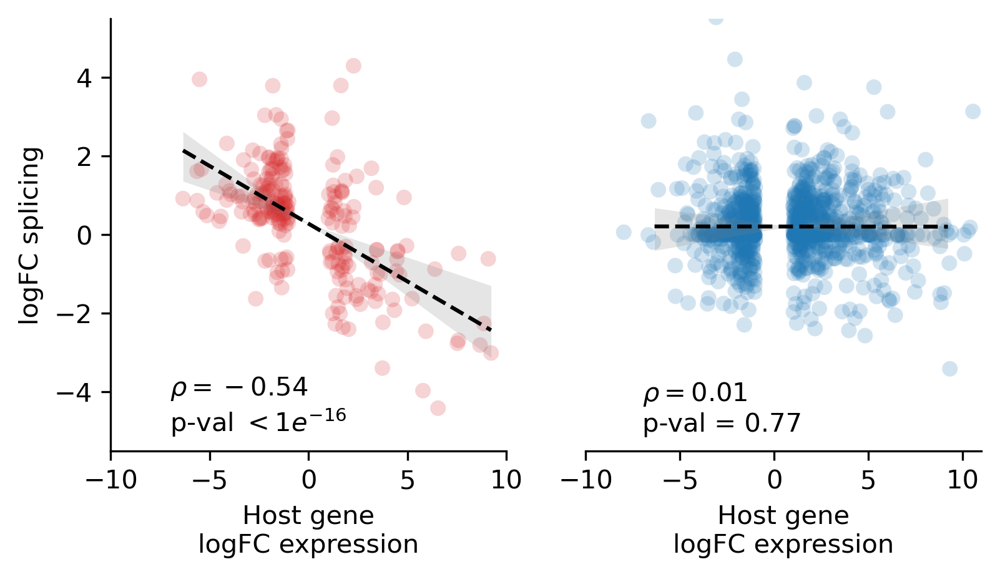

In [152]:
rho_list = []
for i in range(100):
    idx = np.random.choice(np.arange(225), 30, replace=False)
    
    Y = np.array(list(ds_sig.logef))[idx]
    X = np.array(list(ds_sig.log2FoldChange))[idx]
    X = sm.add_constant(X)

    
    model = sm.RLM(Y,X)
    results = model.fit()

    slope = results.params[1]
    const = results.params[0]

    rho_list.append(slope)

fig, ax = plt.subplots(ncols = 2, figsize=(6, 3), dpi=300)

ax[0].scatter(ds_sig.log2FoldChange, ds_sig.logef, facecolor='tab:red', edgecolor='none', alpha=0.2, rasterized=True)



Y = ds_sig['logef']
X = ds_sig['log2FoldChange']
X = sm.add_constant(X)

model = sm.RLM(Y,X)
results = model.fit()

slope = results.params.loc['log2FoldChange']
const = results.params.loc['const']


# slope = pearsonr(list(ds_sig.logef), list(ds_sig.log2FoldChange))[0]
# intercept = np.mean(list(ds_sig.log2FoldChange))
slope_90 = np.quantile(rho_list, 0.9)
slope_10 = np.quantile(rho_list, 0.1)

# Plot confidence intervals (optional)

mean_X = np.mean(X.log2FoldChange)

x = np.linspace(np.min(ds_sig.log2FoldChange)-mean_X, np.max(ds_sig.log2FoldChange)-mean_X, 100) 

ax[0].plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


ax[0].fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
                (slope_10 * x) + const+ (slope*mean_X), 
                 color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)





# x = np.linspace(-7.5, 8.5, 100)

# ax[0].plot(x, slope * x + 0, color='black', linestyle='--')


# ax[0].fill_between(x,( slope_90 * np.array(x)) + 0, 
#                 (slope_10 * x) + 0, 
#                  color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)

ax[0].set_ylim([-5.5, 5.5])
ax[0].set_xlim([-10, 10])
ax[0].spines[['top', 'right']].set_visible(False)

# ax.set_xlim([-3.5, 3.5])

# ax.set_ylim([-1.8, 1.8])
ax[0].text(-7, -5, r'$\rho = -0.54$' + '\np-val $< 1e^{-16}$')

ax[0].set_ylabel('logFC splicing')
ax[0].set_xlabel('Host gene\nlogFC expression')




####################

rho_list = []
for i in range(100):
    idx = np.random.choice(np.arange(ds_sig_p.shape[0]), 30, replace=False)
    
    Y = np.array(list(ds_sig_p.logef))[idx]
    X = np.array(list(ds_sig_p.log2FoldChange))[idx]
    X = sm.add_constant(X)

    
    model = sm.RLM(Y,X)
    results = model.fit()

    slope = results.params[1]
    const = results.params[0]

    rho_list.append(slope)


ax[1].scatter(ds_sig_p.log2FoldChange, ds_sig_p.logef, facecolor='tab:blue', edgecolor='none', alpha=0.2, rasterized=True)



Y = ds_sig_p['logef']
X = ds_sig_p['log2FoldChange']
X = sm.add_constant(X)

model = sm.RLM(Y,X)
results = model.fit()

slope = results.params.loc['log2FoldChange']
const = results.params.loc['const']


# slope = pearsonr(list(ds_sig.logef), list(ds_sig.log2FoldChange))[0]
# intercept = np.mean(list(ds_sig.log2FoldChange))
slope_90 = np.quantile(rho_list, 0.9)
slope_10 = np.quantile(rho_list, 0.1)

# Plot confidence intervals (optional)


mean_X = np.mean(X.log2FoldChange)



x = np.linspace(np.min(X.log2FoldChange)-mean_X, np.max(X.log2FoldChange)-mean_X, 100) 

ax.plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


ax.fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
                (slope_10 * x) + const+ (slope*mean_X), 
                 color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)



# x = np.linspace(np.min(ds_sig.log2FoldChange)-mean_X, np.max(ds_sig.log2FoldChange)-mean_X, 100) 

# ax[1].plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


# ax[1].fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
#                 (slope_10 * x) + const+ (slope*mean_X), 
#                  color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)



# x = np.linspace(-7.5, 8.5, 100)

# ax[1].plot(x, slope * x + 0, color='black', linestyle='--')


# ax[1].fill_between(x,( slope_90 * np.array(x)) + 0, 
#                 (slope_10 * x) + 0, 
#                  color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)

ax[1].set_ylim([-5.5, 5.5])
ax[1].set_xlim([-10, 11])
ax[1].spines[['top', 'right', 'left']].set_visible(False)

# ax.set_xlim([-3.5, 3.5])

# ax.set_ylim([-1.8, 1.8])
ax[1].text(-7, -5, r'$\rho = 0.01$' + '\np-val = 0.77')

# ax[1].set_ylabel('logFC splicing')
ax[1].set_yticks([])
ax[1].set_xlabel('Host gene\nlogFC expression')


plt.savefig('plots/fig2B.png', dpi=300, bbox_inches='tight')
plt.savefig('plots/fig2B.pdf', dpi=300, bbox_inches='tight')
plt.savefig('plots/fig2B.svg', dpi=300, bbox_inches='tight')

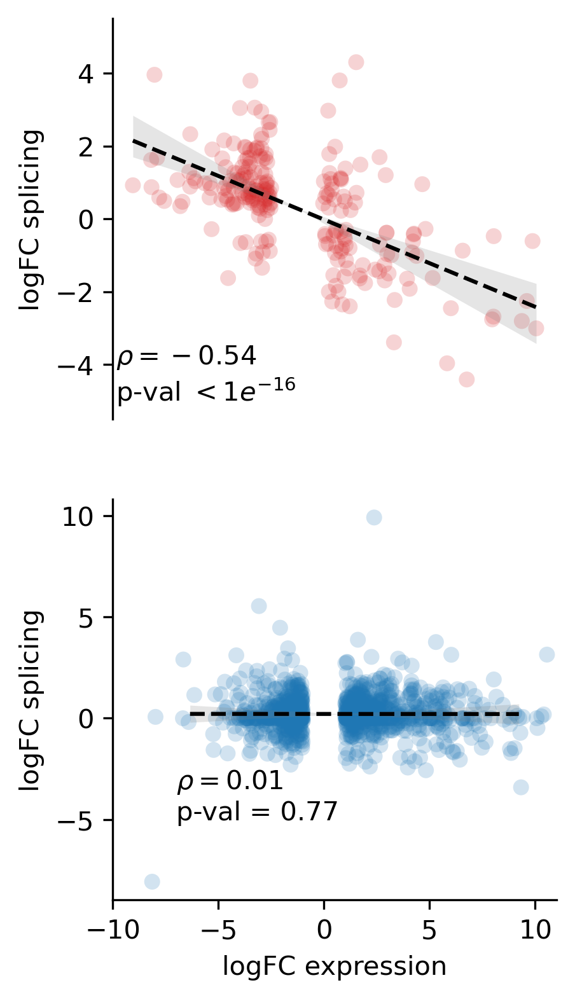

In [150]:
rho_list = []
for i in range(100):
    idx = np.random.choice(np.arange(225), 30, replace=False)
    
    Y = np.array(list(ds_sig.logef))[idx]
    X = np.array(list(ds_sig.log2FoldChange))[idx]
    X = sm.add_constant(X)

    
    model = sm.RLM(Y,X)
    results = model.fit()

    slope = results.params[1]
    const = results.params[0]

    rho_list.append(slope)

fig, ax = plt.subplots(nrows = 2, figsize=(3, 6), dpi=300)

ax[0].scatter(ds_sig.log2FoldChange, ds_sig.logef, facecolor='tab:red', edgecolor='none', alpha=0.2, rasterized=True)



Y = ds_sig['logef']
X = ds_sig['log2FoldChange']
X = sm.add_constant(X)

model = sm.RLM(Y,X)
results = model.fit()

slope = results.params.loc['log2FoldChange']
const = results.params.loc['const']


# slope = pearsonr(list(ds_sig.logef), list(ds_sig.log2FoldChange))[0]
# intercept = np.mean(list(ds_sig.log2FoldChange))
slope_90 = np.quantile(rho_list, 0.9)
slope_10 = np.quantile(rho_list, 0.1)

# Plot confidence intervals (optional)



mean_X = np.mean(X.log2FoldChange)

x = np.linspace(np.min(ds_sig.log2FoldChange)-mean_X, np.max(ds_sig.log2FoldChange)-mean_X, 100) 

ax[0].plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


ax[0].fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
                (slope_10 * x) + const+ (slope*mean_X), 
                 color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)


# x = np.linspace(-7.5, 8.5, 100)

# ax[0].plot(x, slope * x + 0, color='black', linestyle='--')


# ax[0].fill_between(x,( slope_90 * np.array(x)) + 0, 
#                 (slope_10 * x) + 0, 
#                  color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)

ax[0].set_ylim([-5.5, 5.5])
ax[1].set_xlim([-10, 11])
ax[0].spines[['top', 'right', 'bottom']].set_visible(False)

# ax.set_xlim([-3.5, 3.5])

# ax.set_ylim([-1.8, 1.8])
ax[0].text(-7, -5, r'$\rho = -0.54$' + '\np-val $< 1e^{-16}$')

ax[0].set_ylabel('logFC splicing')
# ax[0].set_xlabel('logFC expression')




####################

rho_list = []
for i in range(100):
    idx = np.random.choice(np.arange(ds_sig_p.shape[0]), 30, replace=False)
    
    Y = np.array(list(ds_sig_p.logef))[idx]
    X = np.array(list(ds_sig_p.log2FoldChange))[idx]
    X = sm.add_constant(X)

    
    model = sm.RLM(Y,X)
    results = model.fit()

    slope = results.params[1]
    const = results.params[0]

    rho_list.append(slope)


ax[1].scatter(ds_sig_p.log2FoldChange, ds_sig_p.logef, facecolor='tab:blue', edgecolor='none', alpha=0.2, rasterized=True)



Y = ds_sig_p['logef']
X = ds_sig_p['log2FoldChange']
X = sm.add_constant(X)

model = sm.RLM(Y,X)
results = model.fit()

slope = results.params.loc['log2FoldChange']
const = results.params.loc['const']


# slope = pearsonr(list(ds_sig.logef), list(ds_sig.log2FoldChange))[0]
# intercept = np.mean(list(ds_sig.log2FoldChange))
slope_90 = np.quantile(rho_list, 0.9)
slope_10 = np.quantile(rho_list, 0.1)

# Plot confidence intervals (optional)



mean_X = np.mean(X.log2FoldChange)

x = np.linspace(np.min(ds_sig.log2FoldChange)-mean_X, np.max(ds_sig.log2FoldChange)-mean_X, 100) 

ax[1].plot(x + mean_X, (slope * (x+mean_X)) + const, color='black', linestyle='--')


ax[1].fill_between(x + mean_X,( slope_90 * np.array(x)) + const + (slope*mean_X), 
                (slope_10 * x) + const+ (slope*mean_X), 
                 color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)


# x = np.linspace(-7.5, 8.5, 100)

# ax[1].plot(x, slope * x + 0, color='black', linestyle='--')


# ax[1].fill_between(x,( slope_90 * np.array(x)) + 0, 
#                 (slope_10 * x) + 0, 
#                  color='tab:gray', alpha=0.2, label='Confidence Interval', linewidth=0)

# ax[1].set_ylim([-5.5, 5.5])
ax[1].set_xlim([-10, 11])
ax[1].spines[['top', 'right']].set_visible(False)

# ax.set_xlim([-3.5, 3.5])

# ax.set_ylim([-1.8, 1.8])
ax[1].text(-7, -5, r'$\rho = 0.01$' + '\np-val = 0.77')

# ax[1].set_ylabel('logFC splicing')
ax[0].set_xticks([])
ax[1].set_xlabel('logFC expression')
ax[1].set_ylabel('logFC splicing')


plt.savefig('plots/fig2B_alt.png', dpi=300, bbox_inches='tight')
plt.savefig('plots/fig2B_alt.pdf', dpi=300, bbox_inches='tight')
plt.savefig('plots/fig2B_alt.svg', dpi=300, bbox_inches='tight')

In [148]:
spearmanr(ds_sig_p.log2FoldChange, ds_sig_p.logef)

SignificanceResult(statistic=np.float64(0.009409114996596645), pvalue=np.float64(0.7656503468560334))

In [149]:
spearmanr(ds_sig.log2FoldChange, ds_sig.logef)

SignificanceResult(statistic=np.float64(-0.542790771175727), pvalue=np.float64(1.2224134675154584e-18))

In [81]:
up_psi_filter = pd.read_csv('UP_clusters.tsv', sep='\t')
up_psi_filter['gene'] = up_psi_filter.gene_id.apply(lambda x: x.split('.')[0])

In [84]:
up_psi_filter['gene'] = up_psi_filter.gene_id.apply(lambda x: x.split('.')[0])

In [4]:
import gseapy as gp
from gseapy import barplot, dotplot

def read_gene_list(gene_file):
    with open(gene_file, 'r') as fh:
        gene_list = [x.rstrip() for x in fh.readlines()]
    return gene_list

bg = read_gene_list('/project/yangili1/cfbuenabadn/splice-pub/gofig/background_genes.txt')
genes_df = pd.read_csv('../../code/resources/all_genes.protein_coding.bed.gz', sep='\t', 
                       names = ['chrom', 'start', 'end', 'gene_id', 'gene_name', 'strand'])


grp = up_psi_filter.gene.unique()
grp = sorted(set(grp))

ad_gene_names = list(genes_df.loc[genes_df.gene_id.isin(grp)].gene_name)
bg_names = list(genes_df.loc[genes_df.gene_id.isin(bg)].gene_name)

import warnings
warnings.filterwarnings("ignore")


# gene_list = list(top_genes.loc[top_genes.resid > top_genes.resid.quantile(0.75)].symbol)

enr2 = gp.enrich(gene_list=ad_gene_names, # or gene_list=glist
                 gene_sets=['../../code/resources/MSigDB/c5.go.bp.v2023.1.Hs.symbols.gmt'], # kegg is a dict object
                 background=None, #"hsapiens_gene_ensembl",
                 outdir=None,
                 verbose=True)

dp = dotplot(enr2.res2d, title='Top AD affected genes',cmap='viridis', size=8, figsize=(3,5))

NameError: name 'up_psi_filter' is not defined

2025-01-31 23:08:37,015 [INFO] User defined gene sets is given: ../code/resources/MSigDB/c5.go.bp.v2023.1.Hs.symbols.gmt
2025-01-31 23:08:37,091 [INFO] Run: c5.go.bp.v2023.1.Hs.symbols.gmt 
2025-01-31 23:08:41,233 [INFO] Background is not set! Use all 17890 genes in c5.go.bp.v2023.1.Hs.symbols.gmt.
2025-01-31 23:08:42,721 [INFO] Done.


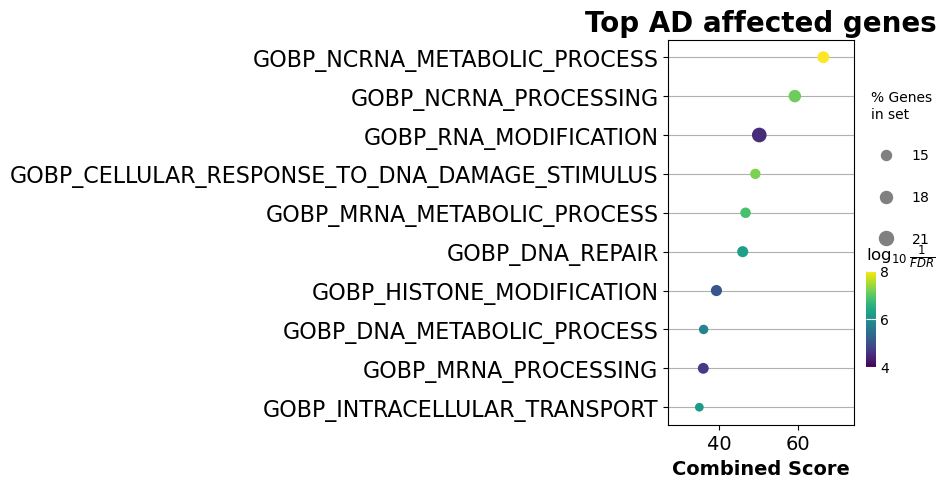

In [106]:
import warnings
warnings.filterwarnings("ignore")


# gene_list = list(top_genes.loc[top_genes.resid > top_genes.resid.quantile(0.75)].symbol)

enr2 = gp.enrich(gene_list=ad_gene_names, # or gene_list=glist
                 gene_sets=['../../code/resources/MSigDB/c5.go.bp.v2023.1.Hs.symbols.gmt'], # kegg is a dict object
                 background=None, #"hsapiens_gene_ensembl",
                 outdir=None,
                 verbose=True)

dp = dotplot(enr2.res2d, title='Top AD affected genes',cmap='viridis', size=8, figsize=(3,5))

In [170]:
100-38.2-35.9

25.9

In [166]:
45.6+46.8)

92.4

In [168]:
(45.6/92.4)*90.4

44.61298701298701

In [169]:
44.6+45.8+9.6

100.0

In [86]:
for i in sorted(sorted_tissues_names):
    print(i)

Adipose - Subcutaneous
Adipose - Visceral (Omentum)
Adrenal Gland
Artery - Aorta
Artery - Coronary
Artery - Tibial
Brain - Amygdala
Brain - Anterior cingulate cortex (BA24)
Brain - Caudate (basal ganglia)
Brain - Cerebellar Hemisphere
Brain - Cerebellum
Brain - Cortex
Brain - Frontal Cortex (BA9)
Brain - Hippocampus
Brain - Hypothalamus
Brain - Nucleus accumbens (basal ganglia)
Brain - Putamen (basal ganglia)
Brain - Spinal cord (cervical c-1)
Brain - Substantianigra
Breast - Mammary Tissue
Cells - Cultured fibroblasts
Cells - EBV-transformed lymphocytes
Colon - Sigmoid
Colon - Transverse
Esophagus - Gastroesophageal Junction
Esophagus - Mucosa
Esophagus - Muscularis
Heart - Atrial Appendage
Heart - Left Ventricle
Kidney - Cortex
Liver
Lung
Minor Salivary Gland
Muscle - Skeletal
Nerve - Tibial
Ovary
Pancreas
Pituitary
Prostate
Skin - Not Sun Exposed (Suprapubic)
Skin - Sun Exposed (Lower leg)
Small Intestine - Terminal Ileum
Spleen
Stomach
Testis
Thyroid
Uterus
Vagina
Whole Blood


In [10]:
import re
def transform_string(s):
    s = s.replace(" ", "")  # Remove spaces
    s = re.sub(r"\(", "_", s)  # Replace '(' with '_'
    s = re.sub(r"\)", "", s)  # Remove ')'
    return s

metadata = pd.read_csv('../../code/resources/GTEx/GTEx_Analysis_v8_Annotations_SampleAttributesDS.txt', sep='\t')


metadata['IndivID'] = metadata.SAMPID.apply(lambda x: '-'.join(x.split('-')[:2]))
metadata['Tissue_Name'] = metadata.SMTSD.apply(lambda x: transform_string(x))
metadata['LC2_name'] = metadata.IndivID + '.' + metadata.Tissue_Name
metadata = metadata.merge(pct_df, left_on = 'LC2_name', right_index = True)
metadata.index = metadata.SAMPID


In [11]:
tissues = sorted(metadata.Tissue_Name.unique())
len(tissues)

49

In [116]:
len(index_map['Ovary'])

180

In [5]:
from scipy.stats import pearsonr, spearmanr

In [ ]:
with gzip.open('/project2/mstephens/cfbuenabadn/gtex-stm/code/gtex_tables/GTEx_Analysis_2017-06-05_v8_RNASeQCv1.1.9_gene_tpm.gct.gz',
                   'rb') as tpm_fh:
    tpm_fh.readline()
    tpm_fh.readline()
    colnames = tpm_fh.readline().decode().rstrip().split('\t')


    meta = metadata.loc[metadata.SAMPID.isin(colnames)]

    index_map = {}
    tissue_corr_dict = {'gene_name':[], 'gene_id':[], 'AllTissue_spearmanr':[], 'AllTissue_pearsonr':[]}

    UP_pct_map = {}
    
    for tissue in tissues:
        C = meta.loc[meta.Tissue_Name == tissue].index # all of these are in colnames
        A = list(range(len(colnames)))
        B = colnames
        index_map_tissue = {b: i for i, b in enumerate(B)}
        tissue_idx = [A[index_map_tissue[c]] for c in C]
        index_map.update({tissue:tissue_idx})

        tissue_corr_dict.update({f'{tissue}_spearmanr':[],
                                 f'{tissue}_pearsonr':[]})

        UP_pct_map.update({tissue:list(meta.loc[meta.Tissue_Name == tissue].pct)})

    
    for line in tqdm(tpm_fh):
        exp_line = np.array(line.decode().rstrip().split('\t'))
        gene_id = exp_line[0]
        gene_name = exp_line[1]

        gene_up = []
        gene_exp = []
        
        for tissue in tissues:
            tissue_idx = index_map[tissue]
            exp_tissue = [float(x) for x in exp_line[tissue_idx]]
            tissue_UP_pct = UP_pct_map[tissue]

            try:
                spearmanr_tissue = spearmanr(exp_tissue, tissue_UP_pct)
                pearsonr_tissue = pearsonr(exp_tissue, tissue_UP_pct)

                gene_exp.extend(list(exp_tissue))
                gene_up.extend(list(tissue_UP_pct))
                
            except:
                spearmanr_tissue = (np.nan, np.nan)
                pearsonr_tissue = (np.nan, np.nan)

            tissue_corr_dict[f'{tissue}_spearmanr'].append(spearmanr_tissue)
            tissue_corr_dict[f'{tissue}_pearsonr'].append(pearsonr_tissue)

        spearmanr_all = spearmanr(gene_exp, gene_up)
        pearsonr_all = pearsonr(gene_exp, gene_up)

        tissue_corr_dict['AllTissue_spearmanr'].append(spearmanr_all)
        tissue_corr_dict['AllTissue_pearsonr'].append(pearsonr_all)
        
        tissue_corr_dict['gene_name'].append(gene_name)
        tissue_corr_dict['gene_id'].append(gene_id)

        

14it [00:01,  7.53it/s]/tmp/ipykernel_1104250/1871571592.py:43: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearmanr_tissue = spearmanr(exp_tissue, tissue_UP_pct)
/tmp/ipykernel_1104250/1871571592.py:44: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  pearsonr_tissue = pearsonr(exp_tissue, tissue_UP_pct)
40it [00:05,  7.58it/s]/tmp/ipykernel_1104250/1871571592.py:56: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearmanr_all = spearmanr(gene_exp, gene_up)
/tmp/ipykernel_1104250/1871571592.py:57: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  pearsonr_all = pearsonr(gene_exp, gene_up)
95it [00:12,  7.61it/s]

In [125]:
tissue_corr_df = pd.DataFrame(tissue_corr_dict)

In [127]:
for col in tissue_corr_df.columns:
    if col.endswith('_spearmanr') or col.endswith('_pearsonr'):
        # Split tuples into two new columns
        tissue_corr_df[f'{col}_rho'] = tissue_corr_df[col].apply(lambda x: x[0])
        tissue_corr_df[f'{col}_pval'] = tissue_corr_df[col].apply(lambda x: x[1])
        # Optionally drop the original column
        tissue_corr_df.drop(columns=[col], inplace=True)

/tmp/ipykernel_3703637/4054275126.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  tissue_corr_df[f'{col}_pval'] = tissue_corr_df[col].apply(lambda x: x[1])
/tmp/ipykernel_3703637/4054275126.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  tissue_corr_df[f'{col}_rho'] = tissue_corr_df[col].apply(lambda x: x[0])
/tmp/ipykernel_3703637/4054275126.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns

In [129]:
tissue_corr_df.to_csv('GeneExpression_v_UP_pct.tab.gz', sep='\t', header=True, index = False)

In [131]:
tissue_corr_df['Brain-Cortex_spearmanr_pval'].sort_values()

45426    6.995697e-42
32141    1.997708e-39
43130    2.355004e-35
45997    6.438078e-35
34439    1.559807e-33
             ...     
56158             NaN
56159             NaN
56160             NaN
56161             NaN
56162             NaN
Name: Brain-Cortex_spearmanr_pval, Length: 56200, dtype: float64

In [135]:
tissue_corr_df.loc[

gene_name                                           THOC1
gene_id                                ENSG00000079134.11
Adipose-Subcutaneous_spearmanr_rho               0.529111
Adipose-Subcutaneous_spearmanr_pval                   0.0
Adipose-Subcutaneous_pearsonr_rho                0.542483
                                              ...        
Vagina_pearsonr_pval                                  0.0
WholeBlood_spearmanr_rho                         0.461026
WholeBlood_spearmanr_pval                             0.0
WholeBlood_pearsonr_rho                          0.467363
WholeBlood_pearsonr_pval                              0.0
Name: 45997, Length: 198, dtype: object

In [52]:
metadata.index = metadata.SAMPID
pct_df.loc[metadata.loc[colnames[2:]].LC2_name]

KeyError: "['GTEX-N7MT.Cervix-Ectocervix', 'GTEX-OHPK.FallopianTube', 'GTEX-OHPN.Cervix-Endocervix', 'GTEX-OIZF.Bladder', 'GTEX-P44H.Bladder', 'GTEX-P78B.Cervix-Ectocervix', 'GTEX-P78B.Cervix-Endocervix', 'GTEX-PLZ4.Cervix-Endocervix', 'GTEX-PLZ4.FallopianTube', 'GTEX-Q2AG.Cervix-Ectocervix', 'GTEX-QEL4.Bladder', 'GTEX-R55E.Kidney-Medulla', 'GTEX-RN64.Bladder', 'GTEX-RU72.Kidney-Medulla', 'GTEX-RU72.Bladder', 'GTEX-S32W.Bladder', 'GTEX-S32W.FallopianTube', 'GTEX-S32W.Cervix-Ectocervix', 'GTEX-S32W.Cervix-Endocervix', 'GTEX-S33H.Bladder', 'GTEX-S341.FallopianTube', 'GTEX-S341.Cervix-Ectocervix', 'GTEX-S341.Cervix-Endocervix', 'GTEX-S3XE.Bladder', 'GTEX-S4Q7.Bladder', 'GTEX-S4UY.Bladder', 'GTEX-S4UY.Cervix-Ectocervix', 'GTEX-S95S.Bladder', 'GTEX-SE5C.FallopianTube', 'GTEX-SE5C.Bladder', 'GTEX-SNMC.Bladder', 'GTEX-SNOS.Bladder', 'GTEX-T2YK.Bladder', 'GTEX-T5JC.Kidney-Medulla', 'GTEX-T5JW.FallopianTube', 'GTEX-T5JW.Cervix-Ectocervix', 'GTEX-T5JW.Cervix-Endocervix', 'GTEX-T5JW.Bladder', 'GTEX-T6MN.Bladder', 'GTEX-T6MO.FallopianTube', 'GTEX-T6MO.Cervix-Endocervix', 'GTEX-TKQ2.Kidney-Medulla', 'GTEX-TML8.Cervix-Endocervix', 'GTEX-TMMY.Bladder', 'GTEX-TSE9.FallopianTube', 'GTEX-TSE9.Cervix-Endocervix', 'GTEX-TSE9.Cervix-Ectocervix', 'GTEX-U3ZM.Bladder', 'GTEX-U3ZN.FallopianTube', 'GTEX-U3ZN.Bladder', 'GTEX-U3ZN.Cervix-Ectocervix', 'GTEX-U4B1.Bladder', 'GTEX-ZPIC.Cervix-Endocervix'] not in index"

In [6]:
gene_expression_v_up = pd.read_csv('GeneExpression_v_UP_pct.tab.gz', sep='\t')

In [7]:
from scipy.stats import false_discovery_control

In [8]:
gene_expression_v_up = gene_expression_v_up.dropna().copy()

In [9]:
gene_expression_v_up['Muscle-Skeletal_pearsonr_fdr'] = false_discovery_control(gene_expression_v_up['Muscle-Skeletal_pearsonr_pval'])

In [11]:
cross_gene_corr = {'gene':[], 'gene_id':[], 'spear_rho':[], 'spear_pval':[], 'pear_rho':[], 'pear_pval':[]}

pct_mean = pct_df.groupby('tissue').pct.mean()

for idx, row in tqdm(median_expression.iterrows()):

    try:
        gene_id = row.Name.split('.')[0]
        gene_name = row.Description
    
        exp = list(row.loc[pct_mean.index])
        srho, spval = spearmanr(exp, list(pct_mean))
        prho, ppval = pearsonr(exp, list(pct_mean))
    
        cross_gene_corr['gene'].append(gene_name)
        cross_gene_corr['gene_id'].append(gene_id)
        cross_gene_corr['spear_rho'].append(srho)
        cross_gene_corr['spear_pval'].append(spval)
        cross_gene_corr['pear_rho'].append(prho)
        cross_gene_corr['pear_pval'].append(ppval)
    except:
        continue
    
# median_expression[pct_df.groupby('tissue').pct.mean().index]

NameError: name 'pct_df' is not defined

In [12]:
cross_gene_corr = pd.DataFrame(cross_gene_corr).dropna()

In [13]:
cross_gene_corr['pear_pval_log'] = -np.log10(cross_gene_corr.pear_pval)
cross_gene_corr['spear_pval_log'] = -np.log10(cross_gene_corr.spear_pval)

In [14]:
cross_gene_corr['qval'] = false_discovery_control(cross_gene_corr.pear_pval)

In [15]:
cross_gene_corr.loc[(cross_gene_corr.qval <= 0.01) & cross_gene_corr.gene.isin(genes_df.gene_name)].sort_values('pear_rho', ascending=False)

,gene,gene_id,spear_rho,spear_pval,pear_rho,pear_pval,pear_pval_log,spear_pval_log,qval


In [16]:
cross_gene_corr.loc[(cross_gene_corr.qval <= 0.01) & cross_gene_corr.gene.isin(genes_df.gene_name)].sort_values('pear_rho', ascending=False)[
    ['gene', 'pear_rho']].to_csv('prerank.rnk',
                                                                                                                              header = None, index=False,
                                                                                                                              sep='\t')

In [135]:
pre_res = gp.prerank(rnk="prerank.rnk", # or rnk = rnk,
                     gene_sets=['../../code/resources/MSigDB/c5.go.bp.v2023.1.Hs.symbols.gmt'],
                     threads=4,
                     min_size=20,
                     max_size=1000,
                     permutation_num=1000, # reduce number to speed up testing
                     outdir=None, # don't write to disk
                     seed=6,
                     verbose=True, # see what's going on behind the scenes
                    )

2026-01-14 15:40:02,063 [WARNING] Duplicated values found in preranked stats: 5.34% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-01-14 15:40:02,063 [INFO] Parsing data files for GSEA.............................
2026-01-14 15:40:02,296 [INFO] 6462 gene_sets have been filtered out when max_size=1000 and min_size=20
2026-01-14 15:40:02,296 [INFO] 1289 gene_sets used for further statistical testing.....
2026-01-14 15:40:02,297 [INFO] Start to run GSEA...Might take a while..................
2026-01-14 15:40:15,661 [INFO] Congratulations. GSEApy runs successfully................



In [106]:
pre_res.res2d['ntags'] = pre_res.res2d['Tag %'].apply(lambda x: int(x.split('/')[1]))

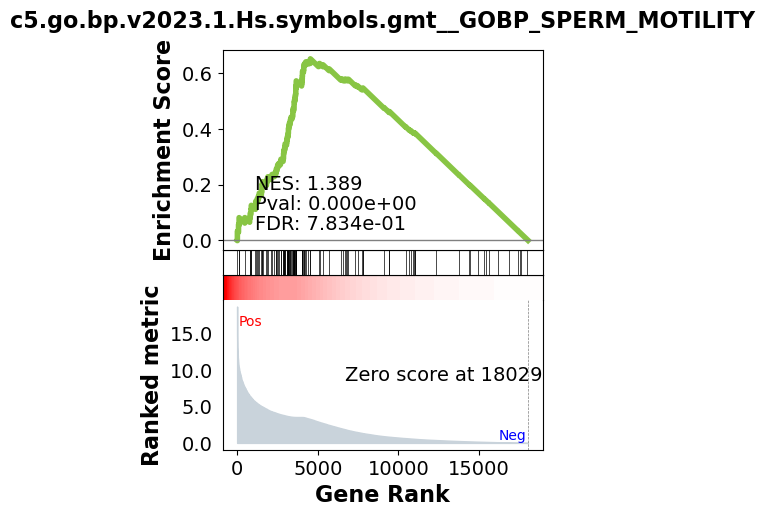

In [122]:
terms = list(pre_res.res2d.loc[pre_res.res2d.ntags >= 50].Term)
axs = pre_res.plot(terms=terms[3]) # v1.0.5

/scratch/midway3/cnajar/anaconda3/envs/leafcutter2/lib/python3.12/site-packages/gseapy/plot.py:738: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[self.colname] = df[self.colname].replace(0, np.nan).bfill()


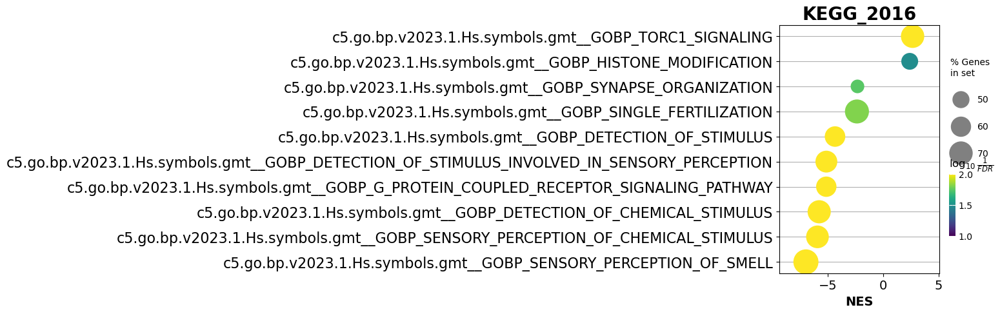

In [136]:
from gseapy import dotplot
# to save your figure, make sure that ``ofname`` is not None
ax = dotplot(pre_res.res2d,
             column="FDR q-val",
             title='KEGG_2016',
             cmap=plt.cm.viridis,
             size=6, # adjust dot size
             figsize=(4,5),  show_ring=False)

In [14]:
import gseapy as gp
from gseapy import barplot, dotplot

def read_gene_list(gene_file):
    with open(gene_file, 'r') as fh:
        gene_list = [x.rstrip() for x in fh.readlines()]
    return gene_list

bg = read_gene_list('/project/yangili1/cfbuenabadn/splice-pub/gofig/background_genes.txt')
genes_df = pd.read_csv('../../code/resources/all_genes.protein_coding.bed.gz', sep='\t', 
                       names = ['chrom', 'start', 'end', 'gene_id', 'gene_name', 'strand'])


# grp = up_psi_filter.gene.unique()
# grp = sorted(set(grp))

# ad_gene_names = list(genes_df.loc[genes_df.gene_id.isin(grp)].gene_name)
# bg_names = list(genes_df.loc[genes_df.gene_id.isin(bg)].gene_name)

# import warnings
# warnings.filterwarnings("ignore")


# # gene_list = list(top_genes.loc[top_genes.resid > top_genes.resid.quantile(0.75)].symbol)

# enr2 = gp.enrich(gene_list=ad_gene_names, # or gene_list=glist
#                  gene_sets=['../../code/resources/MSigDB/c5.go.bp.v2023.1.Hs.symbols.gmt'], # kegg is a dict object
#                  background=None, #"hsapiens_gene_ensembl",
#                  outdir=None,
#                  verbose=True)

# dp = dotplot(enr2.res2d, title='Top AD affected genes',cmap='viridis', size=8, figsize=(3,5))

In [164]:
tissue_weighted_corr = {'gene':gene_expression_v_up.gene_name}
for tissue in tissues:
    wcor = -np.log10(gene_expression_v_up[f'{tissue}_pearsonr_pval'])*gene_expression_v_up[f'{tissue}_pearsonr_rho']
    tissue_weighted_corr.update({tissue:wcor})

In [166]:
tissue_weighted_corr = pd.DataFrame(tissue_weighted_corr)
tissue_weighted_corr = tissue_weighted_corr.loc[tissue_weighted_corr.gene.isin(genes_df.gene_name)].copy()
tissue_weighted_corr = tissue_weighted_corr.set_index('gene')

In [168]:
tissue_weighted_corr.mean(axis=1).sort_values(ascending=False).reset_index().to_csv('wcor_prerank.rnk',  
                                                                                    header = None, index=False,
                                                                                    sep='\t')

In [234]:
tissue_weighted_corr[[x for x in tissue_weighted_corr.columns if x != 'Testis']
    ].mean(axis=1).sort_values(ascending=False).reset_index().to_csv('wcor_prerank_no_testis.rnk',  
                                                                                    header = None, index=False,
                                                                                    sep='\t')

In [237]:
tissue_weighted_corr[[x for x in tissue_weighted_corr.columns if ((x != 'Testis') and (not x.startswith('Brain')))]
    ].mean(axis=1).sort_values(ascending=False).reset_index().to_csv('wcor_prerank_no_brain_testis.rnk',  
                                                                                    header = None, index=False,
                                                                                    sep='\t')

Text(0, 0.5, 'Weighted correlation (no Testis or Brain)')

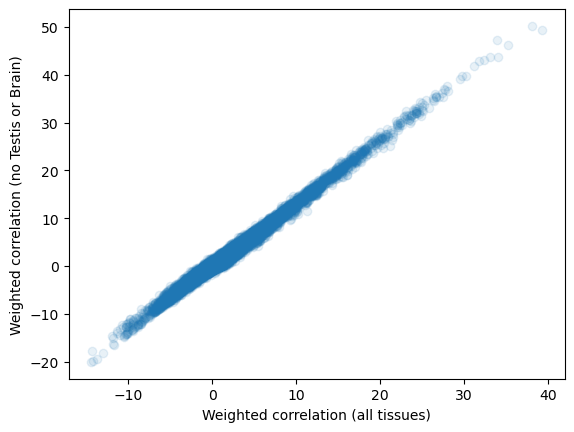

In [247]:
plt.scatter(
            tissue_weighted_corr.mean(axis=1),
tissue_weighted_corr[[x for x in tissue_weighted_corr.columns if ((x != 'Testis') and (not x.startswith('Brain')))]
    ].mean(axis=1), alpha = 0.1)

plt.xlabel('Weighted correlation (all tissues)')
plt.ylabel('Weighted correlation (no Testis or Brain)')

Text(0, 0.5, 'Weighted correlation (no Testis or Brain)')

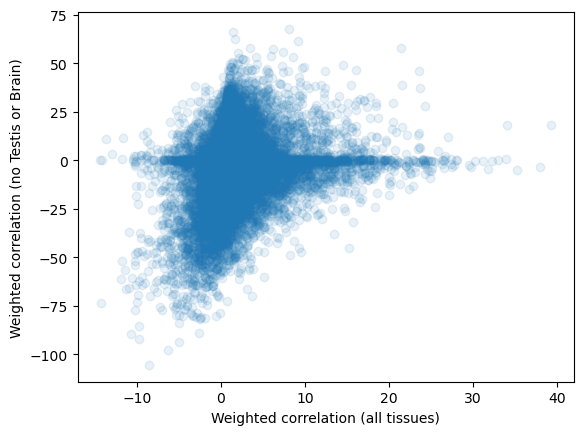

In [253]:
plt.scatter(
            tissue_weighted_corr.mean(axis=1),
tissue_weighted_corr[[x for x in tissue_weighted_corr.columns if ((x == 'Testis'))]
    ].mean(axis=1), alpha = 0.1)

plt.xlabel('Weighted correlation (all tissues)')
plt.ylabel('Weighted correlation (no Testis or Brain)')

In [1]:
import gseapy as gp
from gseapy import dotplot
from matplotlib import pyplot as plt

pre_res = gp.prerank(rnk="wcor_prerank.rnk", # or rnk = rnk,
                     gene_sets=['../../code/resources/MSigDB/c5.go.bp.v2025.1.Hs.symbols.gmt'],
                     threads=4,
                     min_size=20,
                     max_size=1000,
                     permutation_num=1000, # reduce number to speed up testing
                     outdir=None, # don't write to disk
                     seed=6,
                     verbose=True, # see what's going on behind the scenes
                    )

2026-01-17 00:17:04,085 [INFO] Input gene rankings contains duplicated IDs
2026-01-17 00:17:04,090 [INFO] Parsing data files for GSEA.............................
2026-01-17 00:17:04,313 [INFO] 3982 gene_sets have been filtered out when max_size=1000 and min_size=20
2026-01-17 00:17:04,314 [INFO] 3601 gene_sets used for further statistical testing.....
2026-01-17 00:17:04,314 [INFO] Start to run GSEA...Might take a while..................
2026-01-17 00:20:24,207 [INFO] Congratulations. GSEApy runs successfully................



/scratch/midway3/cnajar/anaconda3/envs/leafcutter2/lib/python3.12/site-packages/gseapy/plot.py:738: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[self.colname] = df[self.colname].replace(0, np.nan).bfill()


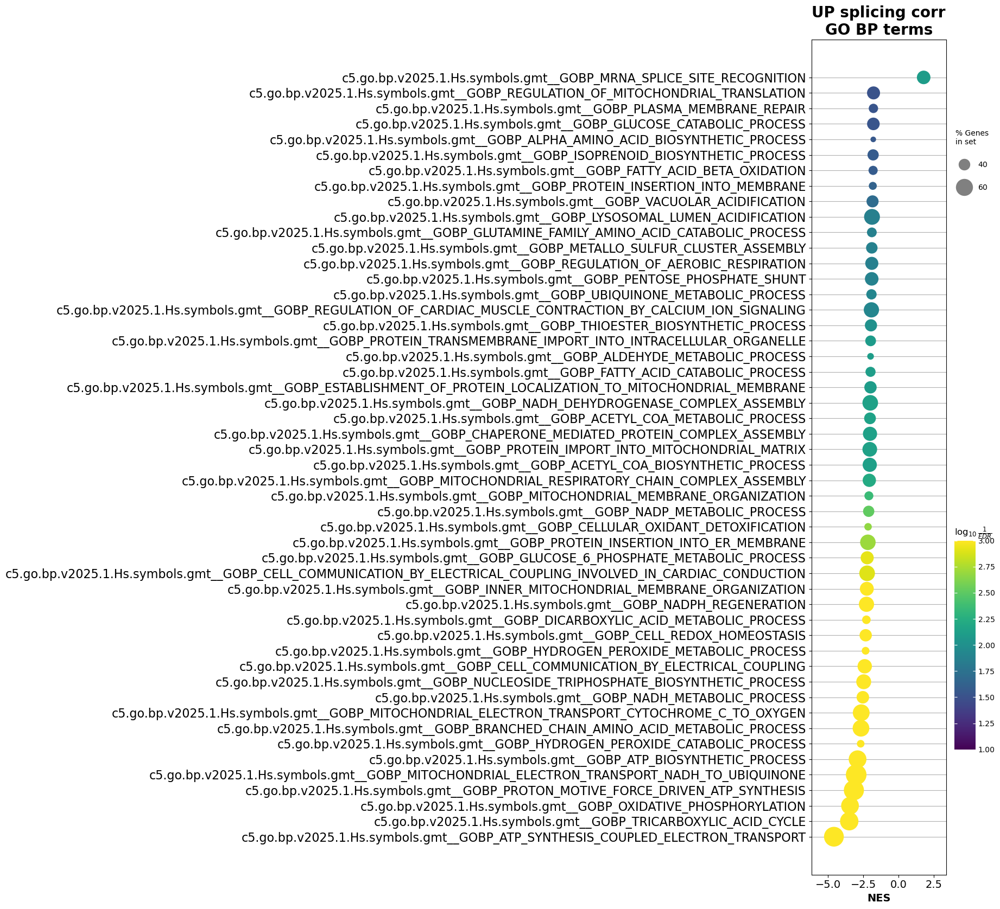

In [3]:
from gseapy import dotplot
from matplotlib import pyplot as plt
# to save your figure, make sure that ``ofname`` is not None
ax = dotplot(pre_res.res2d,
             column="FDR q-val",
             title='UP splicing corr\nGO BP terms',
             cmap=plt.cm.viridis, top_term=50,
             size=6, # adjust dot size
             figsize=(4,20),  show_ring=False)

plt.savefig('revision_plots/GSEA_UP_expression.png', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/GSEA_UP_expression.pdf', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/GSEA_UP_expression.svg', dpi=300, bbox_inches='tight') 

In [241]:
pre_res = gp.prerank(rnk="wcor_prerank_no_brain_testis.rnk", # or rnk = rnk,
                     gene_sets=['../../code/resources/MSigDB/c5.go.bp.v2023.1.Hs.symbols.gmt'],
                     threads=4,
                     min_size=20,
                     max_size=1000,
                     permutation_num=1000, # reduce number to speed up testing
                     outdir=None, # don't write to disk
                     seed=6,
                     verbose=True, # see what's going on behind the scenes
                    )

2026-01-15 16:26:38,559 [INFO] Input gene rankings contains duplicated IDs
2026-01-15 16:26:38,563 [INFO] Parsing data files for GSEA.............................
2026-01-15 16:26:38,816 [INFO] 4064 gene_sets have been filtered out when max_size=1000 and min_size=20
2026-01-15 16:26:38,816 [INFO] 3687 gene_sets used for further statistical testing.....
2026-01-15 16:26:38,817 [INFO] Start to run GSEA...Might take a while..................
2026-01-15 16:28:20,866 [INFO] Congratulations. GSEApy runs successfully................



In [ ]:
from gseapy import dotplot
# to save your figure, make sure that ``ofname`` is not None
ax = dotplot(pre_res.res2d,
             column="FDR q-val",
             title='UP splicing corr\nGO BP terms',
             cmap=plt.cm.viridis, top_term=50,
             size=6, # adjust dot size
             figsize=(4,20),  show_ring=False)

In [187]:
os.listdir('../../code/resources/MSigDB/')

['c2.all.v2023.1.Hs.symbols.gmt',
 'c5.go.cc.v2025.1.Hs.symbols.gmt',
 'c2.ALZHEIMER.gmt',
 'c5.go.mf.v2025.1.Hs.symbols.gmt',
 'c5.go.cc.v2025.1.Hs.symbols (1).gmt',
 'c5.AMYLOID.gmt',
 'c5.go.bp.v2023.1.Hs.symbols.gmt',
 'download_file.jsp?filePath=%2Fmsigdb%2Frelease%2F2025.1.Hs%2Fc5.go.mf.v2025.1.Hs.symbols.gmt',
 'download_file.jsp?filePath=%2Fmsigdb%2Frelease%2F2025.1.Hs%2Fc5.go.cc.v2025.1.Hs.symbols.gmt',
 'c5.go.mf.v2023.1.Hs.symbols.gmt',
 'c5.all.v2023.1.Hs.symbols.gmt']

In [1]:
import gseapy as gp
from gseapy import dotplot
from matplotlib import pyplot as plt
pre_res = gp.prerank(rnk="wcor_prerank.rnk", # or rnk = rnk,
                     gene_sets=['../../code/resources/MSigDB/c5.go.cc.v2025.1.Hs.symbols.gmt'],
                     threads=4,
                     min_size=20,
                     max_size=1000,
                     permutation_num=1000, # reduce number to speed up testing
                     outdir=None, # don't write to disk
                     seed=6,
                     verbose=True, # see what's going on behind the scenes
                    )

2026-01-17 00:23:02,700 [INFO] Input gene rankings contains duplicated IDs
2026-01-17 00:23:02,706 [INFO] Parsing data files for GSEA.............................
2026-01-17 00:23:02,743 [INFO] 0590 gene_sets have been filtered out when max_size=1000 and min_size=20
2026-01-17 00:23:02,744 [INFO] 0452 gene_sets used for further statistical testing.....
2026-01-17 00:23:02,744 [INFO] Start to run GSEA...Might take a while..................
2026-01-17 00:23:29,868 [INFO] Congratulations. GSEApy runs successfully................



/scratch/midway3/cnajar/anaconda3/envs/leafcutter2/lib/python3.12/site-packages/gseapy/plot.py:738: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[self.colname] = df[self.colname].replace(0, np.nan).bfill()


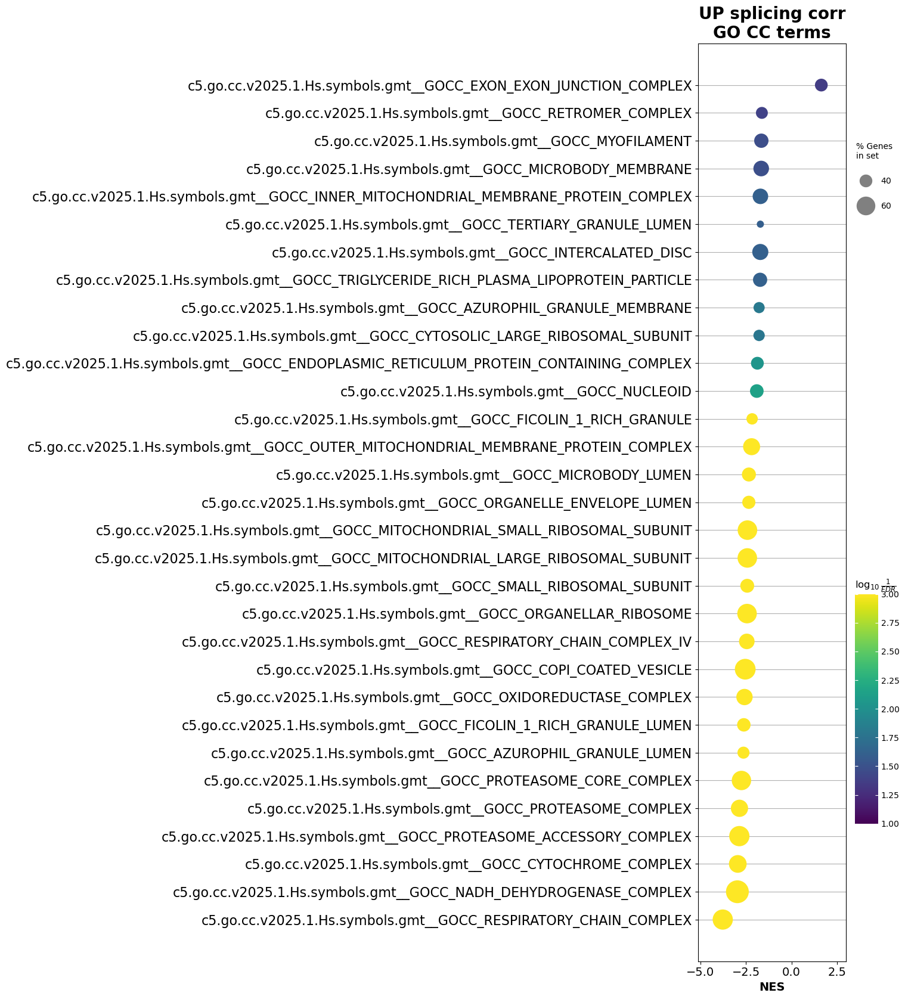

In [2]:
from gseapy import dotplot
# to save your figure, make sure that ``ofname`` is not None
ax = dotplot(pre_res.res2d,
             column="FDR q-val",
             title='UP splicing corr\nGO CC terms',
             cmap=plt.cm.viridis, top_term=50,
             size=6, # adjust dot size
             figsize=(4,20),  show_ring=False)

plt.savefig('revision_plots/GSEA_UP_CC_expression.png', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/GSEA_UP_CC_expression.pdf', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/GSEA_UP_CC_expression.svg', dpi=300, bbox_inches='tight') 

In [3]:
pre_res = gp.prerank(rnk="wcor_prerank.rnk", # or rnk = rnk,
                     gene_sets=['../../code/resources/MSigDB/c5.go.mf.v2025.1.Hs.symbols.gmt'],
                     threads=4,
                     min_size=20,
                     max_size=1000,
                     permutation_num=1000, # reduce number to speed up testing
                     outdir=None, # don't write to disk
                     seed=6,
                     verbose=True, # see what's going on behind the scenes
                    )

2026-01-17 00:25:37,407 [INFO] Input gene rankings contains duplicated IDs
2026-01-17 00:25:37,412 [INFO] Parsing data files for GSEA.............................
2026-01-17 00:25:37,471 [INFO] 1170 gene_sets have been filtered out when max_size=1000 and min_size=20
2026-01-17 00:25:37,472 [INFO] 0685 gene_sets used for further statistical testing.....
2026-01-17 00:25:37,472 [INFO] Start to run GSEA...Might take a while..................
2026-01-17 00:26:15,881 [INFO] Congratulations. GSEApy runs successfully................



/scratch/midway3/cnajar/anaconda3/envs/leafcutter2/lib/python3.12/site-packages/gseapy/plot.py:738: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[self.colname] = df[self.colname].replace(0, np.nan).bfill()


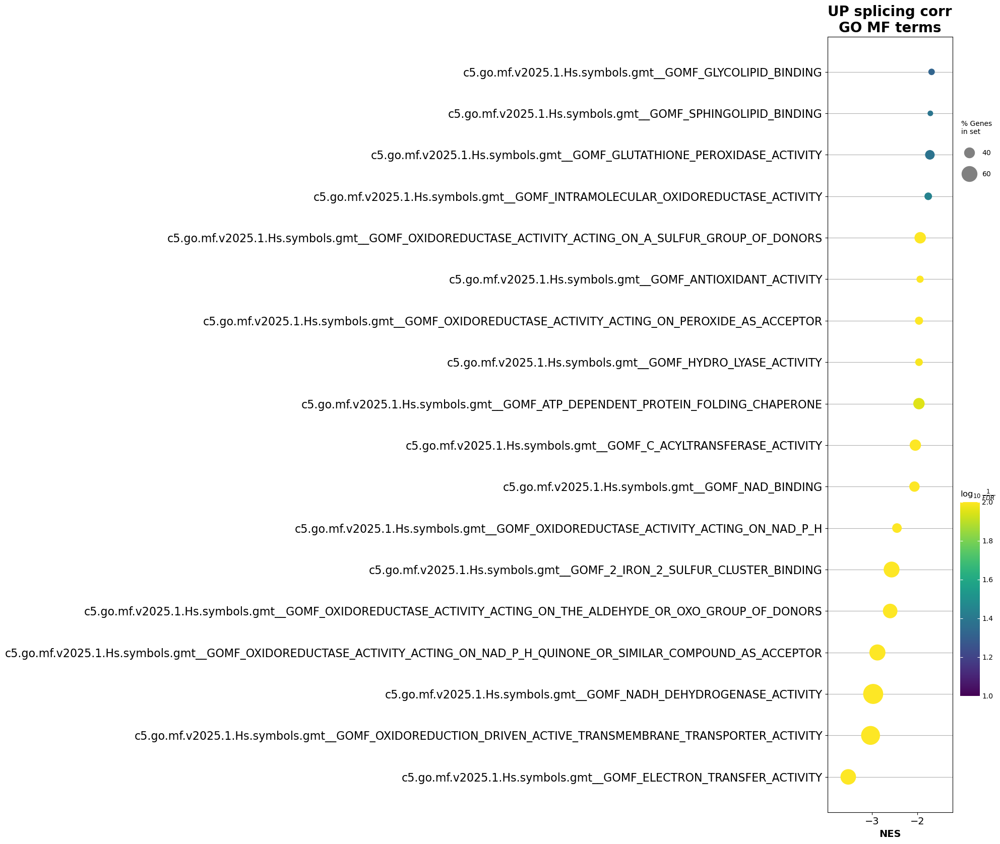

In [4]:
from gseapy import dotplot
# to save your figure, make sure that ``ofname`` is not None
ax = dotplot(pre_res.res2d,
             column="FDR q-val",
             title='UP splicing corr\nGO MF terms',
             cmap=plt.cm.viridis, top_term=50,
             size=6, # adjust dot size
             figsize=(4,20),  show_ring=False)

plt.savefig('revision_plots/GSEA_UP_MF_expression.png', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/GSEA_UP_MF_expression.pdf', dpi=300, bbox_inches='tight')
plt.savefig('revision_plots/GSEA_UP_MF_expression.svg', dpi=300, bbox_inches='tight') 

In [205]:
', '.join(tissue_weighted_corr.mean(axis=1).sort_values(ascending=False).index[-100:])

'NIF3L1, RTCB, RAB1B, NDUFAB1, TUBB4B, MRPL58, LSM1, MRPS23, MGST3, SLC25A5, VDAC1, ETFB, EMC3, PCCA, RAB10, ANXA6, PPIA, SUCLA2, ALDH9A1, ATP6V1D, UQCRQ, MRPS36, COX6B1, UQCRC2, MRPL37, HPS6, DDX1, PSMD14, MRPS18A, STOML2, SDHC, AIMP2, NDUFA9, RAB7A, MRPS28, DLAT, CHCHD3, MTHFD1, AP3B1, HCCS, GOT2, NDUFB3, ACAT1, ACAA2, PCCB, MRPS11, PSMD8, ICMT, NDUFA1, NDUFB9, RRAGA, NDUFA8, PPP1CA, HSD17B10, PGM1, ETFA, GDE1, ORMDL2, PARK7, UQCRC1, NDUFC2, NDUFS1, ATP6V1E1, C1QBP, YWHAB, PGAM1, MRPL15, IARS2, MRPS35, SND1, PSMD1, MRPS18C, PSMB6, TALDO1, ACO2, NCOA4, PSMB5, TRAPPC1, CLTC, PRDX1, MDH1, PDHB, GHITM, MRPS16, PSMC1, UQCRH, PEPD, LDHB, DLD, COX8A, PRDX2, COX5A, AIFM1, UQCRFS1, NDUFA4, FH, MTCH2, SDHB, PRDX3, MDH2'

In [208]:
', '.join(tissue_weighted_corr.mean(axis=1).sort_values(ascending=False).index[200:300])

'HSF4, CCDC66, ZBTB17, NPIPB4, PDE6C, KMT5C, TTC14, QTRT1, SECISBP2, CHKB, BRF1, HAUS5, TYW5, PRPF4B, ALG13, ZNF182, PPP4R3A, WDR91, SNAPC4, INPP5E, LEAP2, AGER, RCOR3, HYPK, PAN2, ATAD3B, LEMD2, NRN1L, DUS1L, AMT, SAFB2, USF1, SELENOO, CLCN6, TYK2, IDUA, TJAP1, GSDMB, ZNF226, CCDC14, ARHGEF7, DNAH1, CRYGS, ZNF432, DDX51, ZNF84, UHRF2, KANSL3, AGAP5, POMT1, GON4L, RBBP6, ANKRD36, WDR59, CATSPER2, ZNF814, TAS2R5, RICTOR, UBAP1L, MSS51, RINT1, DMAP1, ZNF577, UCKL1, HSD17B3, ZNF789, PHF11, NAT9, TTC21A, ZNF274, USP36, STRADA, ZNF600, E2F5, NAA25, ATXN2L, SGSM2, SZT2, PRSS53, ZNF326, RPAIN, INTS11, POU2F1, LRRC70, ZFC3H1, KCTD13, MST1, ARMCX4, ZNF345, ABHD18, MAU2, TUBE1, LRP2BP, N4BP2L2, DDX39B, S100PBP, CEP44, FCHSD1, PRKD2, ZBTB25'

In [230]:
tissue_weighted_corr.loc[[x for x in tissue_weighted_corr.index if x.startswith('SRSF')]].mean(axis=1)

gene
SRSF10    13.477074
SRSF4     13.088323
SRSF11    25.249606
SRSF7      7.099497
SRSF3      5.960221
SRSF12     1.751715
SRSF8      3.343883
SRSF9     -2.945761
SRSF5     22.002873
SRSF1     13.430415
SRSF2     12.984195
SRSF6      5.520300
dtype: float64